In [1]:
# !unzip /content/Toy_problem_VRP.zip -d /content/Toy_problem_VRP

In [2]:
!unzip /content/mygeodata.zip -d /content/Geojson_data

Archive:  /content/mygeodata.zip
replace /content/Geojson_data/destination point.geojson? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace /content/Geojson_data/origin point.geojson? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace /content/Geojson_data/road network fin.geojson? [y]es, [n]o, [A]ll, [N]one, [r]ename: n


In [3]:
!pip install geopandas
!pip install networkx

In [4]:
import geopandas as gpd

import networkx as nx
from shapely.geometry import LineString,point,Point

import matplotlib.pyplot as plt

from shapely.ops import unary_union, nearest_points
import random
import math

#Load data

In [5]:
path = "/content/Toy_problem_VRP/"
geo_path = "/content/Geojson_data/"

destination_path = geo_path + "destination point.geojson"
origin_path = geo_path + "origin point.geojson"
road_network_path = geo_path + "road network fin.geojson"

In [6]:
# Load the datasets
road_network = gpd.read_file(road_network_path)
origins = gpd.read_file(origin_path)
destinations = gpd.read_file(destination_path)

# Display first few rows
print("Road Network:")
display(road_network.head())

print("Origin Points:")
display(origins.head())

print("Destination Points:")
display(destinations.head())


Road Network:


,length,no,geometry
0,1633.648,1,"LINESTRING (87.3086 22.31986, 87.30846 22.3198..."
1,679.087,2,"LINESTRING (87.31555 22.32109, 87.31504 22.321..."
2,1250.464,3,"LINESTRING (87.30726 22.31713, 87.30993 22.317..."
3,29.747,4,"LINESTRING (87.31928 22.31871, 87.31945 22.318..."
4,928.862,5,"LINESTRING (87.30714 22.31704, 87.30626 22.315..."


Origin Points:


,id,layer,x,y,geometry
0,39,INSTITUTE,87.300818,22.318045,POINT (87.30082 22.31804)
1,6,HOSTEL,87.307806,22.319820,POINT (87.31831 22.30731)
2,1,HOSTEL,87.307674,22.321061,POINT (87.30769 22.32106)


Destination Points:


,id,destinatio,geometry
0,1,None,POINT (87.32778 22.31104)
1,4,metallurgical department,POINT (87.3136 22.32081)
2,6,nalanda complex,POINT (87.31731 22.31711)


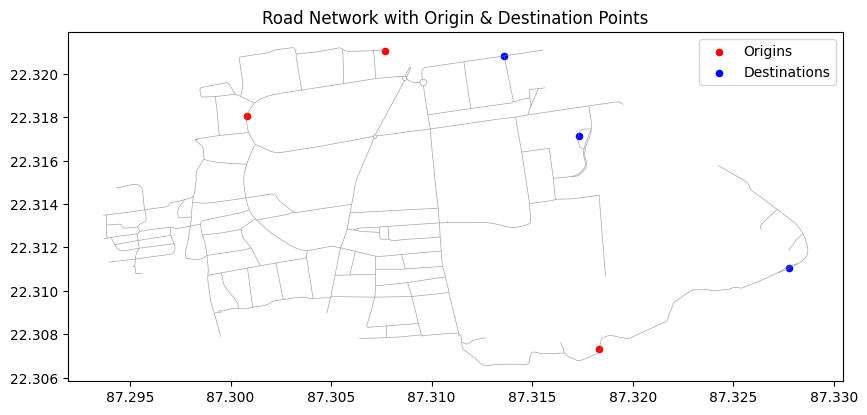

In [7]:
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the road network
road_network.plot(ax=ax, color="gray", linewidth=0.5, alpha=0.7)

# Plot origins and destinations
origins.plot(ax=ax, color="red", markersize=20, label="Origins")
destinations.plot(ax=ax, color="blue", markersize=20, label="Destinations")

plt.legend()
plt.title("Road Network with Origin & Destination Points")
plt.show()

# Find intersections

In [8]:
# Create an empty graph
G = nx.Graph()

# Extract road geometries
road_lines = [LineString(feature.geometry) for feature in road_network.itertuples()]

# Find intersection points
intersections = set()
for i, line1 in enumerate(road_lines):
    for j, line2 in enumerate(road_lines):
        if i >= j:
            continue  # Avoid duplicate checks

        # Find intersection points
        intersection = line1.intersection(line2)

        # If intersection is a valid point (not a line or area)
        if isinstance(intersection, Point):
            intersections.add((intersection.x, intersection.y))

# Add intersections as nodes to the graph
for node in intersections:
    G.add_node(node)

print(f"✅ Found {len(intersections)} intersections.")

# Add origin points as nodes to the graph
for _, origin in origins.iterrows():
    origin_coords = (origin.geometry.x, origin.geometry.y)
    G.add_node(origin_coords)

# Add destination points as nodes to the graph
for _, destination in destinations.iterrows():
    destination_coords = (destination.geometry.x, destination.geometry.y)
    G.add_node(destination_coords)

print(f"✅ Added {len(origins)} origin points and {len(destinations)} destination points as nodes.")



✅ Found 138 intersections.
✅ Added 3 origin points and 3 destination points as nodes.


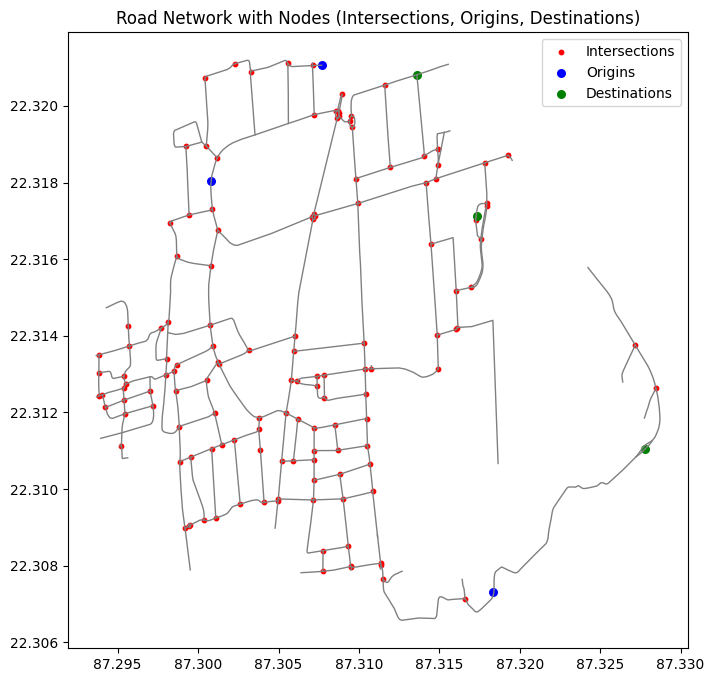

In [9]:
# Visualize all nodes (intersections, origins, destinations)
fig, ax = plt.subplots(figsize=(8, 8))

# Plot the road network lines
for line in road_lines:
    x, y = line.xy
    ax.plot(x, y, color="gray", linewidth=1)

# Plot intersection points in red
x_inter, y_inter = zip(*intersections)
ax.scatter(x_inter, y_inter, color="red", s=10, label="Intersections")

# Plot origin points in blue
x_orig, y_orig = zip(*[(origin.geometry.x, origin.geometry.y) for _, origin in origins.iterrows()])
ax.scatter(x_orig, y_orig, color="blue", s=30, label="Origins")

# Plot destination points in green
x_dest, y_dest = zip(*[(destination.geometry.x, destination.geometry.y) for _, destination in destinations.iterrows()])
ax.scatter(x_dest, y_dest, color="green", s=30, label="Destinations")

# # Plot all nodes from the graph
# for node in G.nodes:
#     ax.scatter(node[0], node[1], color="orange", s=20)

# Add legend and labels
plt.legend()
plt.title("Road Network with Nodes (Intersections, Origins, Destinations)")
plt.show()


#Add edges

In [10]:
# ✅ Add edges between intersections
for i, row in road_network.iterrows():
    line = row.geometry
    road_length = row["length"]  # Use precomputed road length

    # Iterate over consecutive segment pairs
    for p1, p2 in zip(line.coords[:-1], line.coords[1:]):
        p1, p2 = Point(p1), Point(p2)

        # Find nearest intersection points
        nearest_p1 = nearest_points(p1, unary_union([Point(x, y) for x, y in intersections]))[1]
        nearest_p2 = nearest_points(p2, unary_union([Point(x, y) for x, y in intersections]))[1]

        if nearest_p1 != nearest_p2:
            G.add_edge((nearest_p1.x, nearest_p1.y), (nearest_p2.x, nearest_p2.y), weight=road_length)

In [11]:
# Origins
G.add_edge((87.3008181, 22.3180446), (87.3011881, 22.3186459), weight=0.0007)
G.add_edge((87.3008181, 22.3180446), (87.3008856, 22.3173078), weight=0.0008)

G.add_edge((87.3183091, 22.307314), (87.3284675, 22.3126279), weight=0.001)
G.add_edge((87.3183091, 22.307314), (87.3166026, 22.307132), weight=0.001)

G.add_edge((87.3076863, 22.3210607), (87.3071132, 22.3210546), weight=0.0006)
G.add_edge((87.3076863, 22.3210607), (87.3072196, 22.3197718), weight=0.0009)

# Destinations
G.add_edge((87.3277825, 22.3110414), (87.3284675, 22.3126279), weight=0.001)
G.add_edge((87.3277825, 22.3110414), (87.3166026, 22.307132), weight=0.001)

G.add_edge((87.3173107, 22.3171132), (87.3172534, 22.3170132), weight=0.0005)
G.add_edge((87.3173107, 22.3171132), (87.3179339, 22.3173944), weight=0.0007)

print("✅ Added edges from origin and destination nodes to their nearest intersections.")


✅ Added edges from origin and destination nodes to their nearest intersections.


In [12]:
# Print connected edges for each origin node
print("\n🔵 Edges connected to Origins:")
for _, row in origins.iterrows():
    origin_coords = (row.geometry.x, row.geometry.y)
    if origin_coords in G:
        edges = list(G.edges(origin_coords, data=True))
        print(f"Origin {origin_coords} connected to:")
        for u, v, data in edges:
            print(f"  → {v} (Distance: {data['weight']:.2f})")
    else:
        print(f"Origin {origin_coords} not found in graph.")

# Print connected edges for each destination node
print("\n🟢 Edges connected to Destinations:")
for _, row in destinations.iterrows():
    dest_coords = (row.geometry.x, row.geometry.y)
    if dest_coords in G:
        edges = list(G.edges(dest_coords, data=True))
        print(f"Destination {dest_coords} connected to:")
        for u, v, data in edges:
            print(f"  → {v} (Distance: {data['weight']:.2f})")
    else:
        print(f"Destination {dest_coords} not found in graph.")



🔵 Edges connected to Origins:
Origin (87.3008181, 22.3180446) connected to:
  → (87.3011881, 22.3186459) (Distance: 0.00)
  → (87.3008856, 22.3173078) (Distance: 0.00)
Origin (87.3183091, 22.307314) connected to:
  → (87.3284675, 22.3126279) (Distance: 0.00)
  → (87.3166026, 22.307132) (Distance: 0.00)
Origin (87.3076863, 22.3210607) connected to:
  → (87.3071132, 22.3210546) (Distance: 0.00)
  → (87.3072196, 22.3197718) (Distance: 0.00)

🟢 Edges connected to Destinations:
Destination (87.3277825, 22.3110414) connected to:
  → (87.3284675, 22.3126279) (Distance: 0.00)
  → (87.3166026, 22.307132) (Distance: 0.00)
Destination (87.3136019, 22.320812) connected to:
  → (87.311604, 22.3205432) (Distance: 679.09)
  → (87.3140445, 22.3187008) (Distance: 680.48)
Destination (87.3173107, 22.3171132) connected to:
  → (87.3172534, 22.3170132) (Distance: 0.00)
  → (87.3179339, 22.3173944) (Distance: 0.00)


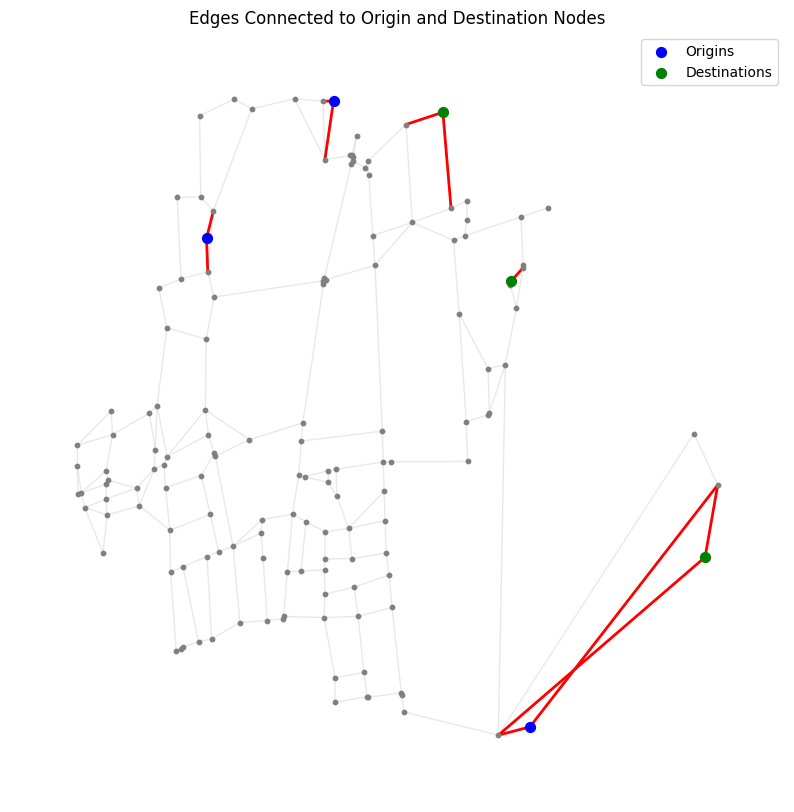

In [13]:
import matplotlib.pyplot as plt
import networkx as nx

# Convert geometries to (x, y) tuples
origin_nodes = [(point.geometry.x, point.geometry.y) for _, point in origins.iterrows()]
destination_nodes = [(point.geometry.x, point.geometry.y) for _, point in destinations.iterrows()]

# Combine all points of interest
special_nodes = set(origin_nodes + destination_nodes)

# Extract edges connected to special nodes
special_edges = []
for u, v in G.edges():
    if u in special_nodes or v in special_nodes:
        special_edges.append((u, v))

# Draw the graph
pos = {node: node for node in G.nodes()}  # Since nodes are (x, y), use directly as positions

plt.figure(figsize=(10, 10))

# Draw all edges in light gray
nx.draw_networkx_edges(G, pos, edge_color='lightgray', alpha=0.5)

# Draw special edges in red
nx.draw_networkx_edges(G, pos, edgelist=special_edges, edge_color='red', width=2)

# Draw all nodes
nx.draw_networkx_nodes(G, pos, node_size=10, node_color='gray')

# Highlight origin and destination nodes
nx.draw_networkx_nodes(G, pos, nodelist=origin_nodes, node_color='blue', node_size=50, label='Origins')
nx.draw_networkx_nodes(G, pos, nodelist=destination_nodes, node_color='green', node_size=50, label='Destinations')

plt.legend()
plt.title("Edges Connected to Origin and Destination Nodes")
plt.axis('off')
plt.show()


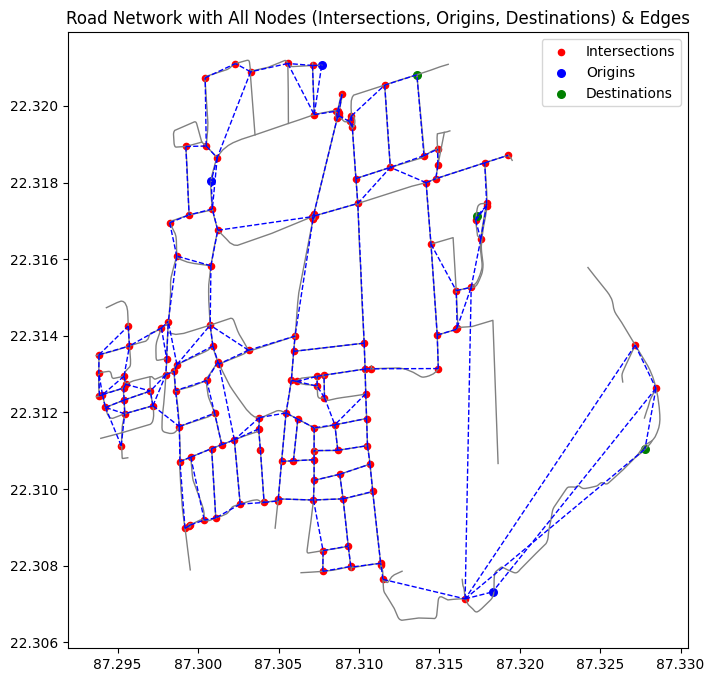

In [14]:
# Visualize the road network with all nodes (intersections, origins, and destinations) and edges
fig, ax = plt.subplots(figsize=(8, 8))

# Plot road segments
for line in road_lines:
    x, y = line.xy
    ax.plot(x, y, color="gray", linewidth=1)

# Plot intersection nodes
x_inter, y_inter = zip(*intersections)
ax.scatter(x_inter, y_inter, color="red", s=20, label="Intersections")

# Plot origin nodes
x_orig, y_orig = zip(*[(origin.geometry.x, origin.geometry.y) for _, origin in origins.iterrows()])
ax.scatter(x_orig, y_orig, color="blue", s=30, label="Origins")

# Plot destination nodes
x_dest, y_dest = zip(*[(destination.geometry.x, destination.geometry.y) for _, destination in destinations.iterrows()])
ax.scatter(x_dest, y_dest, color="green", s=30, label="Destinations")

# Draw all edges in the graph
for edge in G.edges():
    x_vals, y_vals = zip(*edge)
    ax.plot(x_vals, y_vals, color="blue", linestyle="--", linewidth=1)

# Add legend and labels
plt.legend()
plt.title("Road Network with All Nodes (Intersections, Origins, Destinations) & Edges")
plt.show()


In [15]:
print(f"Graph constructed with {G.number_of_nodes()} nodes and {G.number_of_edges()} edges.")

Graph constructed with 143 nodes and 214 edges.


In [16]:
# ✅ Check if edge weights are assigned correctly
print("Edges with weights:")
for u, v, data in G.edges(data=True):
    print(f"{u} <--> {v} | Weight: {data['weight']}")


Edges with weights:
(87.2953946, 22.3123207) <--> (87.2954359, 22.311964) | Weight: 504.332
(87.2953946, 22.3123207) <--> (87.295376, 22.3126381) | Weight: 504.332
(87.2953946, 22.3123207) <--> (87.2970334, 22.3125586) | Weight: 291.56
(87.2953946, 22.3123207) <--> (87.2942417, 22.3121293) | Weight: 291.56
(87.3007972, 22.3158278) <--> (87.3007514, 22.3142769) | Weight: 285.718
(87.3007972, 22.3158278) <--> (87.3012232, 22.3167536) | Weight: 285.718
(87.3007972, 22.3158278) <--> (87.2986732, 22.3160786) | Weight: 222.098
(87.307212, 22.3107642) <--> (87.3072112, 22.3110022) | Weight: 512.849
(87.307212, 22.3107642) <--> (87.3072139, 22.3102271) | Weight: 512.849
(87.307212, 22.3107642) <--> (87.3059281, 22.3107371) | Weight: 208.186
(87.3095346, 22.3197384) <--> (87.311604, 22.3205432) | Weight: 679.087
(87.3095346, 22.3197384) <--> (87.3094147, 22.3195928) | Weight: 107.016
(87.3095346, 22.3197384) <--> (87.3095891, 22.3194366) | Weight: 107.016
(87.3149353, 22.3131442) <--> (87.31486

# Find shortest path

In [17]:
# Function to find the nearest node in the graph
def find_nearest_node(graph, point):
    return min(graph.nodes, key=lambda node: Point(node).distance(Point(point)))

In [18]:
# Extract origin and destination coordinates
origin_coords = [(row.geometry.x, row.geometry.y) for _, row in origins.iterrows()]
destination_coords = [(row.geometry.x, row.geometry.y) for _, row in destinations.iterrows()]

In [19]:
# Compute and store shortest paths
shortest_paths = {}  # Dictionary to store paths
for i, origin in enumerate(origin_coords):
    origin_node = find_nearest_node(G, origin)

    for j, destination in enumerate(destination_coords):
        destination_node = find_nearest_node(G, destination)

        # Compute shortest path
        shortest_path = nx.shortest_path(G, source=origin_node, target=destination_node, weight="weight")
        shortest_paths[(origin, destination)] = shortest_path  # Store the path

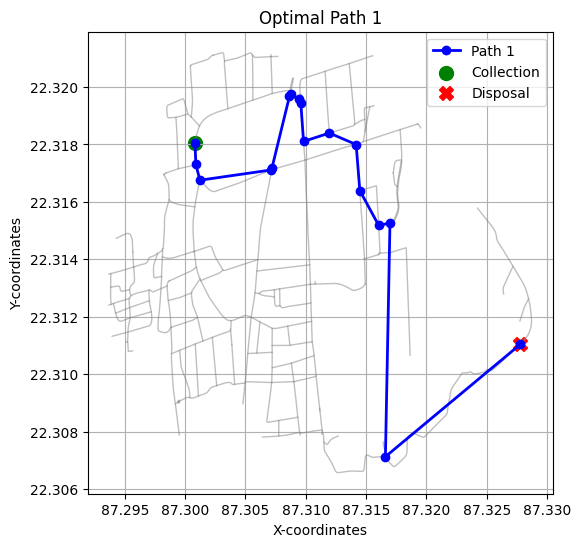

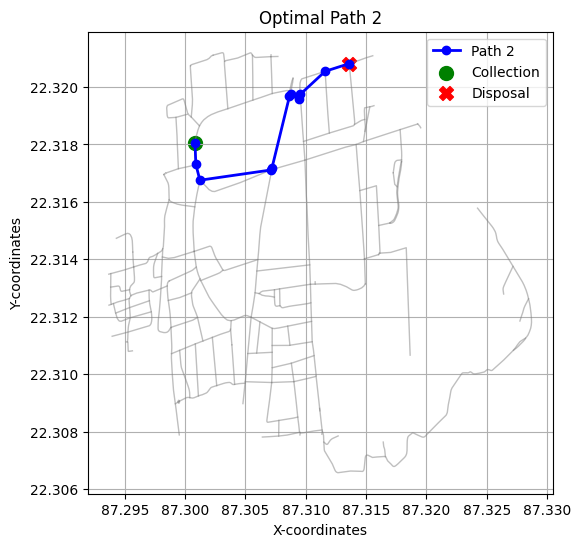

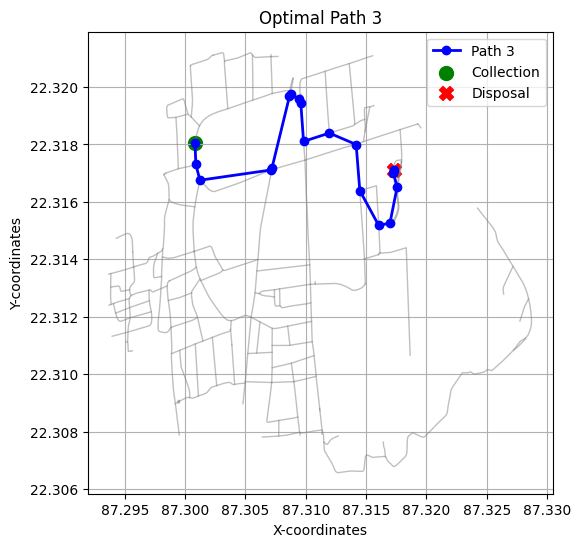

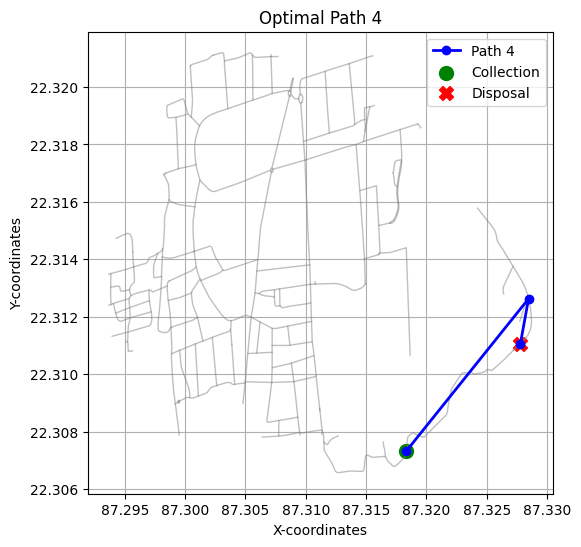

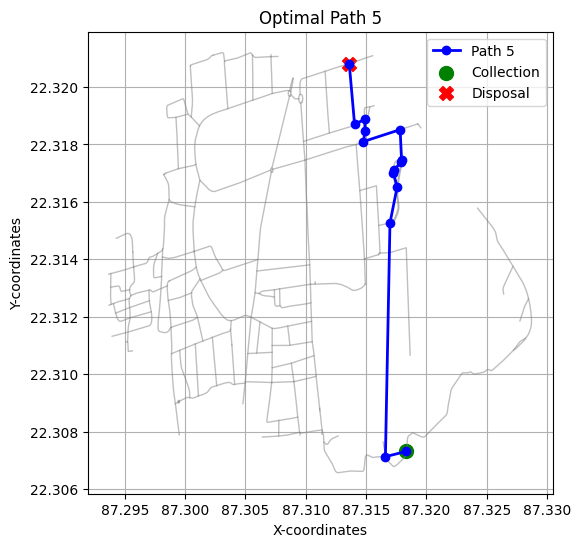

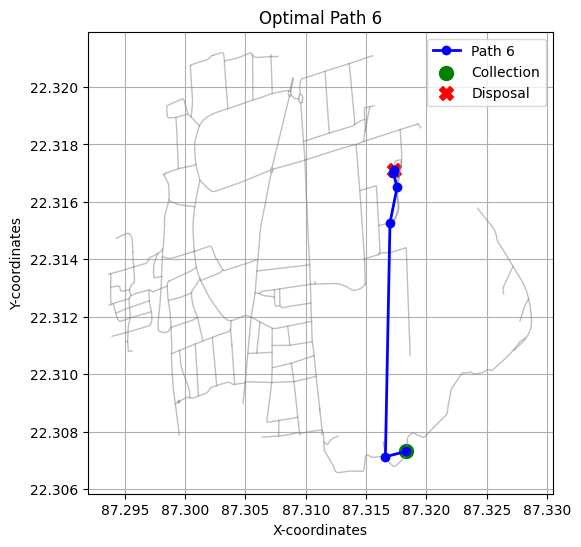

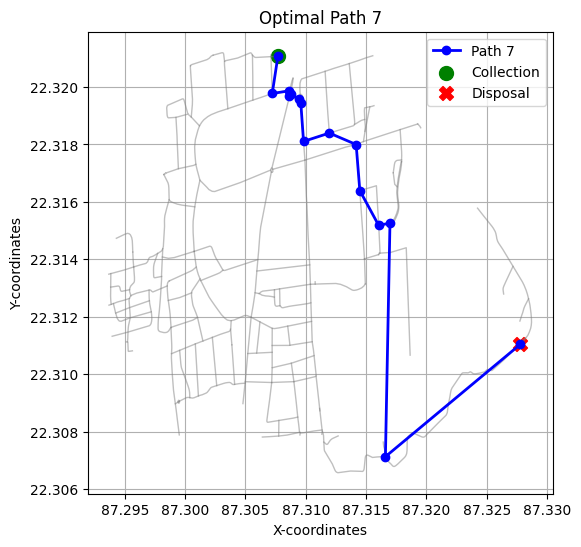

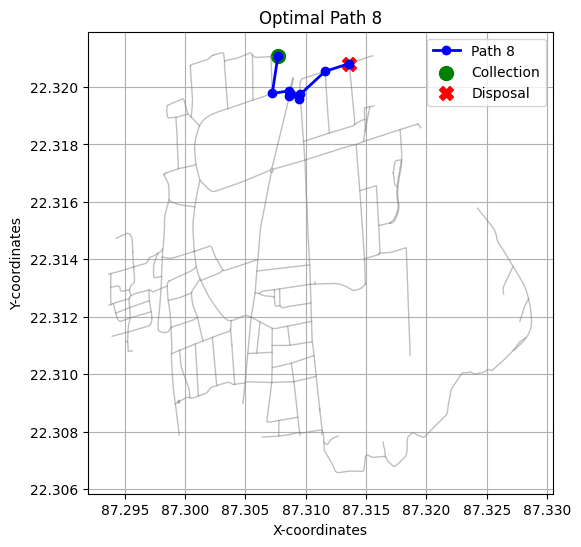

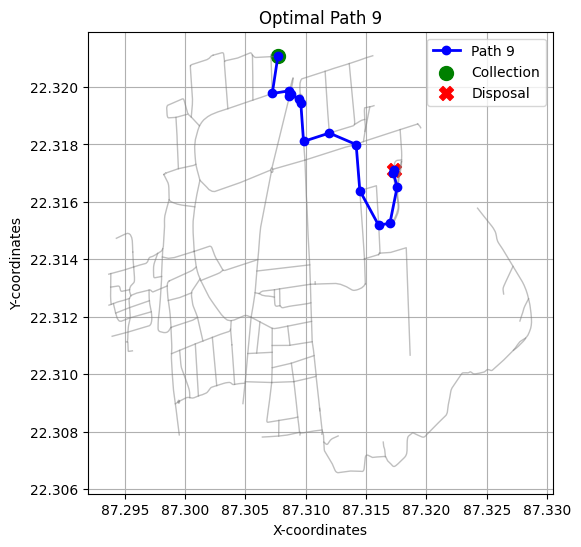

In [20]:
# Plot each shortest path separately
for idx, ((origin, destination), path) in enumerate(shortest_paths.items()):
    plt.figure(figsize=(6, 6))  # Create a new figure for each path

    # Plot all roads in light gray for reference
    for line in road_lines:
        x, y = line.xy
        plt.plot(x, y, color="gray", linewidth=1, alpha=0.5)

    # Extract coordinates of the path nodes
    path_coords = [(node[0], node[1]) for node in path]
    path_x, path_y = zip(*path_coords)

    # Plot the shortest path
    plt.plot(path_x, path_y, marker="o", color="blue", linewidth=2, label=f"Path {idx+1}")

    # Mark origin and destination
    plt.scatter(*origin, color="green", s=100, label="Collection", marker="o")
    plt.scatter(*destination, color="red", s=100, label="Disposal", marker="X")

    # Set title and labels
    plt.title(f"Optimal Path {idx+1}")
    plt.xlabel("X-coordinates")
    plt.ylabel("Y-coordinates")
    plt.legend()
    plt.grid(True)

    # Show plot separately for each path
    plt.show()


#DP & RL

## Declartion

In [21]:
import random

from sklearn.cluster import KMeans
import numpy as np
import gym

import torch
import torch.nn as nn
import torch.optim as optim

In [22]:
# Extract origin and destination coordinates
collection_centers = [(row.geometry.x, row.geometry.y) for _, row in origins.iterrows()]
disposal_centers = [(row.geometry.x, row.geometry.y) for _, row in destinations.iterrows()]

len(collection_centers), len(disposal_centers)

(3, 3)

In [23]:
disposal_centers

[(87.3277825, 22.3110414), (87.3136019, 22.320812), (87.3173107, 22.3171132)]

In [24]:

"""
disposal_centers: List of (x, y) coordinates
n_vehicles: Number of vehicles to assign
Returns: List of dicts with vehicle info
"""

n_vehicles = 3
vehicles = []

selected_indices = random.sample(range(len(disposal_centers)),n_vehicles )


for i, idx in enumerate(selected_indices):
    vehicles.append({
        "id": i,
        "depot": disposal_centers[idx],  # (x, y)
        "assigned_cluster": [],
        "capacity": random.randint(20, 40)  # example capacity
    })


# View output
for v in vehicles:
    print(f"Vehicle {v['id']} → Depot: {v['depot']} | Capacity: {v['capacity']}")


Vehicle 0 → Depot: (87.3136019, 22.320812) | Capacity: 29
Vehicle 1 → Depot: (87.3277825, 22.3110414) | Capacity: 28
Vehicle 2 → Depot: (87.3173107, 22.3171132) | Capacity: 40


In [25]:
# Assign random waste amounts to collection centers (e.g., 5–15 units)
collection_centers_data = [
    {
        "id": i,
        "coords": coords,
        "waste": random.randint(5, 15)
    }
    for i, coords in enumerate(collection_centers)
]

# Assign random capacity to disposal centers (e.g., 30–100 units)
disposal_centers_data = [
    {
        "id": i,
        "coords": coords,
        "capacity": random.randint(30, 100)
    }
    for i, coords in enumerate(disposal_centers)
]

# Optional: Display a few samples
print("Sample Collection Centers:")
for c in collection_centers_data:
    print(c)

print("\nSample Disposal Centers:")
for d in disposal_centers_data:
    print(d)


Sample Collection Centers:
{'id': 0, 'coords': (87.3008181, 22.3180446), 'waste': 8}
{'id': 1, 'coords': (87.3183091, 22.307314), 'waste': 11}
{'id': 2, 'coords': (87.3076863, 22.3210607), 'waste': 12}

Sample Disposal Centers:
{'id': 0, 'coords': (87.3277825, 22.3110414), 'capacity': 40}
{'id': 1, 'coords': (87.3136019, 22.320812), 'capacity': 37}
{'id': 2, 'coords': (87.3173107, 22.3171132), 'capacity': 84}


In [26]:
# Step 1: Prepare collection center coordinates and waste
coords = np.array([c["coords"] for c in collection_centers_data])
wastes = [c["waste"] for c in collection_centers_data]

vehicle_caps = [v["capacity"] for v in vehicles]
vehicle_depots = [v["depot"] for v in vehicles]


# Step 2: Initialize empty clusters
clusters = [[] for _ in range(3)]
cluster_waste = [0 for _ in range(3)]

# Step 3: Use basic KMeans to group spatially
kmeans = KMeans(n_clusters=3, random_state=0).fit(coords)
initial_labels = kmeans.labels_


def euclidean(p1, p2):
    return ((p1[0]-p2[0])**2 + (p1[1]-p2[1])**2)**0.5

In [27]:
# Step 4: Reassign based on waste capacity
for idx, label in enumerate(initial_labels):
    waste = wastes[idx]
    assigned = False

    # Try original label first
    if cluster_waste[label] + waste <= vehicle_caps[label]:
        clusters[label].append(idx)
        cluster_waste[label] += waste
        continue

    # Try other clusters
    for alt_label in range(3):
        if cluster_waste[alt_label] + waste <= vehicle_caps[alt_label]:
            clusters[alt_label].append(idx)
            cluster_waste[alt_label] += waste
            assigned = True
            break

    if not assigned:
        print(f"⚠️ Could not assign collection center {idx} due to capacity limit.")

In [28]:
assigned_vehicles = []

for i in range(3):
    assigned_centers = [collection_centers_data[j] for j in clusters[i]]
    depot = vehicle_depots[i]

    # Find nearest disposal center
    nearest_disposal = min(disposal_centers_data, key=lambda d: euclidean(d["coords"], depot))

    assigned_vehicles.append({
        "vehicle_id": i,
        "capacity": vehicle_caps[i],
        "collection_centers": assigned_centers,
        "disposal_center": [nearest_disposal]
    })

In [29]:
for i in assigned_vehicles:
  print(i)

{'vehicle_id': 0, 'capacity': 29, 'collection_centers': [{'id': 1, 'coords': (87.3183091, 22.307314), 'waste': 11}], 'disposal_center': [{'id': 1, 'coords': (87.3136019, 22.320812), 'capacity': 37}]}
{'vehicle_id': 1, 'capacity': 28, 'collection_centers': [{'id': 2, 'coords': (87.3076863, 22.3210607), 'waste': 12}], 'disposal_center': [{'id': 0, 'coords': (87.3277825, 22.3110414), 'capacity': 40}]}
{'vehicle_id': 2, 'capacity': 40, 'collection_centers': [{'id': 0, 'coords': (87.3008181, 22.3180446), 'waste': 8}], 'disposal_center': [{'id': 2, 'coords': (87.3173107, 22.3171132), 'capacity': 84}]}


In [101]:
import gym
import numpy as np
import networkx as nx
import torch
import random

class VehicleRoutingEnv(gym.Env):
    def __init__(self, graph, vehicle, collection_centers, disposal_centers):
        super().__init__()
        self.graph = graph
        self.vehicle = vehicle
        self.collection_centers = collection_centers
        self.disposal_centers = disposal_centers
        self.directions = ['north', 'east', 'south', 'west']

        self.reset()

    def reset(self):
        self.current_node = self.vehicle["depot"]
        self.prev_node = None
        self.collection_index = 0
        self.disposal_index = 0
        self.visited = set([self.current_node])
        self.current_phase = "collect"
        self.waste_loaded = 0
        self.total_distance_travelled = 0.0

        self.shortest_total_dist = self._compute_total_shortest_path()
        self.next_dest = self.collection_centers[self.collection_index]

        return self._get_state()

    def _compute_total_shortest_path(self):
        try:
            full_seq = [self.vehicle["depot"]] + self.collection_centers + self.disposal_centers + [self.vehicle["depot"]]
            total = 0.0
            for i in range(len(full_seq) - 1):
                dist = nx.shortest_path_length(self.graph, full_seq[i], full_seq[i+1], weight='weight')
                total += dist
            return total
        except:
            return float('inf')

    def _get_state(self):
        x, y = self.current_node
        dest_x, dest_y = self.next_dest if self.next_dest is not None else (-1, -1)

        # Distance to next destination
        if self.next_dest is not None and self.graph.has_node(self.next_dest):
            try:
                dist_to_next = nx.shortest_path_length(self.graph, self.current_node, self.next_dest, weight='weight')
            except:
                dist_to_next = -1.0
        else:
            dist_to_next = -1.0
        # Loop indicator (has this node been visited before?)
        is_looping = 1.0 if self.current_node in self.visited else 0.0

        # One-hot encode the phase
        phase_one_hot = {
            "collect": [1.0, 0.0, 0.0],
            "dispose": [0.0, 1.0, 0.0],
            "return": [0.0, 0.0, 1.0],
            "done":    [0.0, 0.0, 0.0],  # terminal
        }.get(self.current_phase, [0.0, 0.0, 0.0])

        return np.array([
            float(x), float(y),
            float(self.waste_loaded),
            float(dest_x), float(dest_y),
            float(dist_to_next),
            is_looping,
            *phase_one_hot  # spread one-hot vector into array
        ], dtype=np.float32)


    def _update_next_dest(self):
        if self.current_phase == "collect":
            self.collection_index += 1
            if self.collection_index < len(self.collection_centers):
                self.next_dest = self.collection_centers[self.collection_index]
            else:
                self.current_phase = "dispose"
                self.next_dest = self.disposal_centers[self.disposal_index]

        elif self.current_phase == "dispose":
            self.disposal_index += 1
            if self.disposal_index < len(self.disposal_centers):
                self.next_dest = self.disposal_centers[self.disposal_index]
            else:
                self.current_phase = "return"
                self.next_dest = self.vehicle["depot"]

        elif self.current_phase == "return":
            self.current_phase = "done"
            self.next_dest = None

    def step(self, action):
        done = False

        if not self.graph.has_edge(self.current_node, action):
            return self._get_state(), -10, False, {}

        distance = self.graph[self.current_node][action]['weight']
        self.prev_node = self.current_node
        self.current_node = action
        self.total_distance_travelled += distance

        reward = 0

        try:
            ideal_remaining = nx.shortest_path_length(self.graph, self.current_node, self.next_dest, weight='weight')
        except:
            ideal_remaining = float('inf')

        deviation = self.total_distance_travelled - self.shortest_total_dist
        reward -= max(deviation, 0)

        if action in self.visited:
            reward -= 5
        else:
            self.visited.add(action)

        if action == self.next_dest:
            if self.current_phase == "collect":
                self.waste_loaded += 1
                reward += 30
            elif self.current_phase == "dispose":
                self.waste_loaded = max(0, self.waste_loaded - 1)
                reward += 30
            elif self.current_phase == "return":
                reward += 100
                done = True
            self._update_next_dest()

        return self._get_state(), reward, done, {}

    def relative_position(self, current_node, neighbor_node):
        cx, cy = current_node
        nx_, ny_ = neighbor_node
        if ny_ > cy:
            return 'north'
        elif ny_ < cy:
            return 'south'
        elif nx_ > cx:
            return 'east'
        elif nx_ < cx:
            return 'west'
        return None

    def select_action(self, state, epsilon):
        valid_actions = list(self.graph.neighbors(self.current_node))
        if self.prev_node and self.prev_node in valid_actions:
            valid_actions.remove(self.prev_node)

        if not valid_actions:
            return None, None

        if random.random() < epsilon:
            return random.choice(valid_actions), None

        q_vals = dqn(state)
        masked_q_vals = torch.full_like(q_vals, float('-inf'))
        sorted_actions = [None for _ in range(4)]

        for neighbor in valid_actions:
            rel_dir = self.relative_position(self.current_node, neighbor)
            if rel_dir:
                idx = self.directions.index(rel_dir)
                sorted_actions[idx] = neighbor
                masked_q_vals[0, idx] = q_vals[0, idx]

        best_idx = torch.argmax(masked_q_vals).item()
        return sorted_actions[best_idx], best_idx


In [102]:
class DQN(nn.Module):
    def __init__(self, state_size, action_size):
        super(DQN, self).__init__()
        self.fc1 = nn.Linear(state_size, 128)
        self.fc2 = nn.Linear(128, 64)
        self.out = nn.Linear(64, action_size)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        return self.out(x)


## Training

In [103]:
id = 0

collection_centers = [c['coords'] for c in assigned_vehicles[id]['collection_centers']]
disposal_centers = [c['coords'] for c in assigned_vehicles[id]['disposal_center']]

env = VehicleRoutingEnv(graph=G, vehicle=vehicles[id],
                        collection_centers=collection_centers,
                        disposal_centers=disposal_centers)

In [104]:
import matplotlib.patches as mpatches

def plot_path_static(graph, path):
    pos = {node: (node[1], node[0]) for node in graph.nodes}  # lon = x, lat = y

    centers = env.collection_centers + env.disposal_centers
    plt.figure(figsize=(10, 8))

    # Draw base graph
    nx.draw(graph, pos, node_size=20, node_color='lightgray', edge_color='lightgray')

    # Draw the full path
    if len(path) > 1:
        edges_in_path = list(zip(path[:-1], path[1:]))
        nx.draw_networkx_edges(graph, pos, edgelist=edges_in_path, edge_color='blue', width=2)

    # Highlight visited nodes
    nx.draw_networkx_nodes(graph, pos, nodelist=path, node_color='blue', node_size=50)

    # Centers to vist
    nx.draw_networkx_nodes(graph, pos, nodelist=centers, node_color='black', node_size=100,label = 'centers')


    # Mark origin
    nx.draw_networkx_nodes(graph, pos, nodelist=[path[0]], node_color='green', node_size=100, label="Depot")

    # Mark last node (destination)
    nx.draw_networkx_nodes(graph, pos, nodelist=[path[-1]], node_color='red', node_size=100, label="Last node")


    # Custom legend using patches
    legend_patches = [
        mpatches.Patch(color='blue', label='Traversed Path'),
        mpatches.Patch(color='green', label='Depot (Start)'),
        mpatches.Patch(color='red', label='Last Node'),
        mpatches.Patch(color='black', label='Centers to Visit'),
    ]

    plt.title("Agent Path Traversal")
    plt.axis('off')
    plt.legend(handles=legend_patches, loc='upper right')
    plt.show()

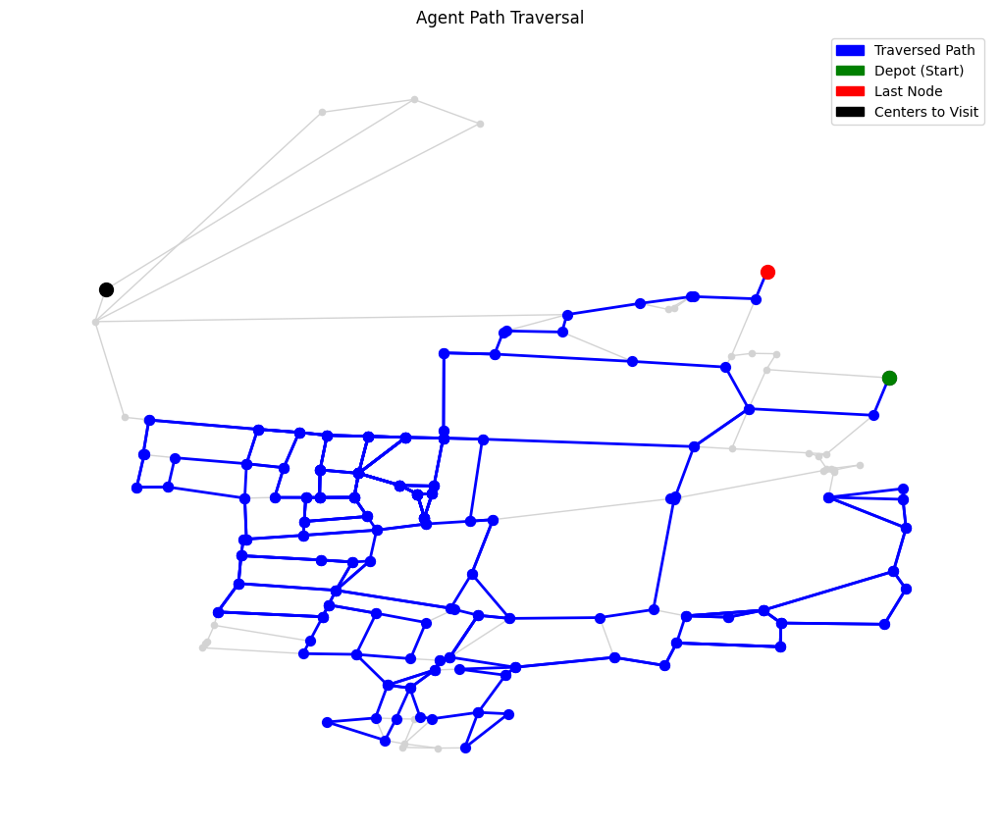

Episode 0, Total reward: -23953356.37


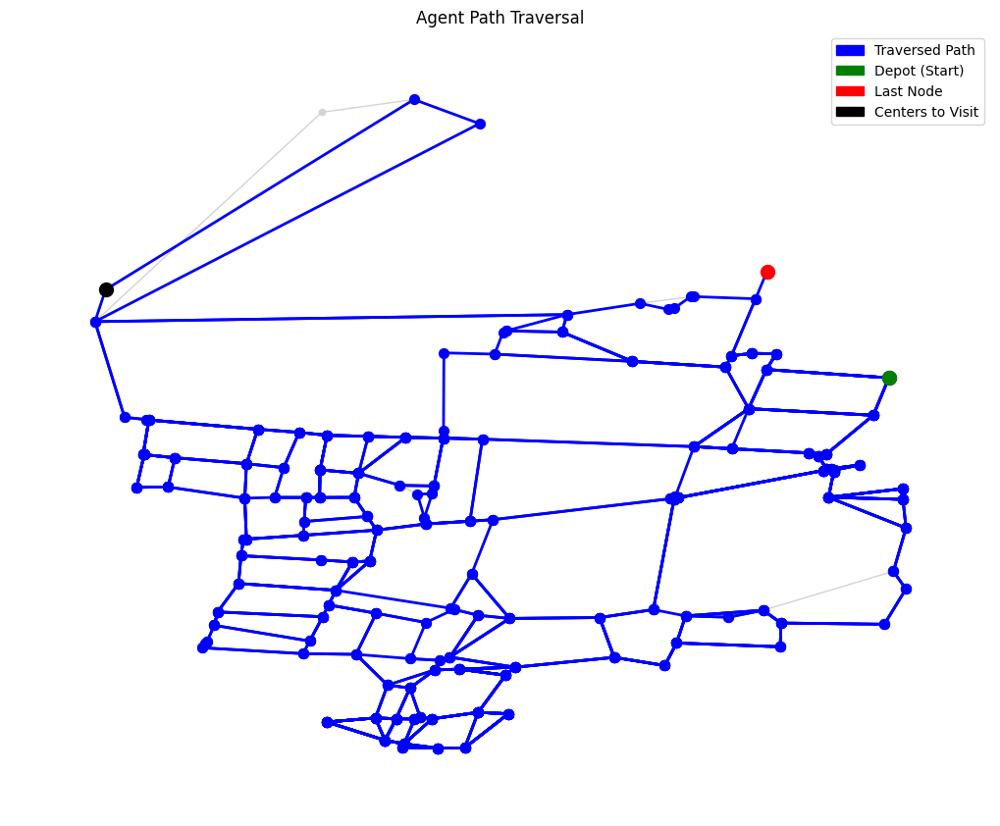

Episode 1, Total reward: -132382234.97


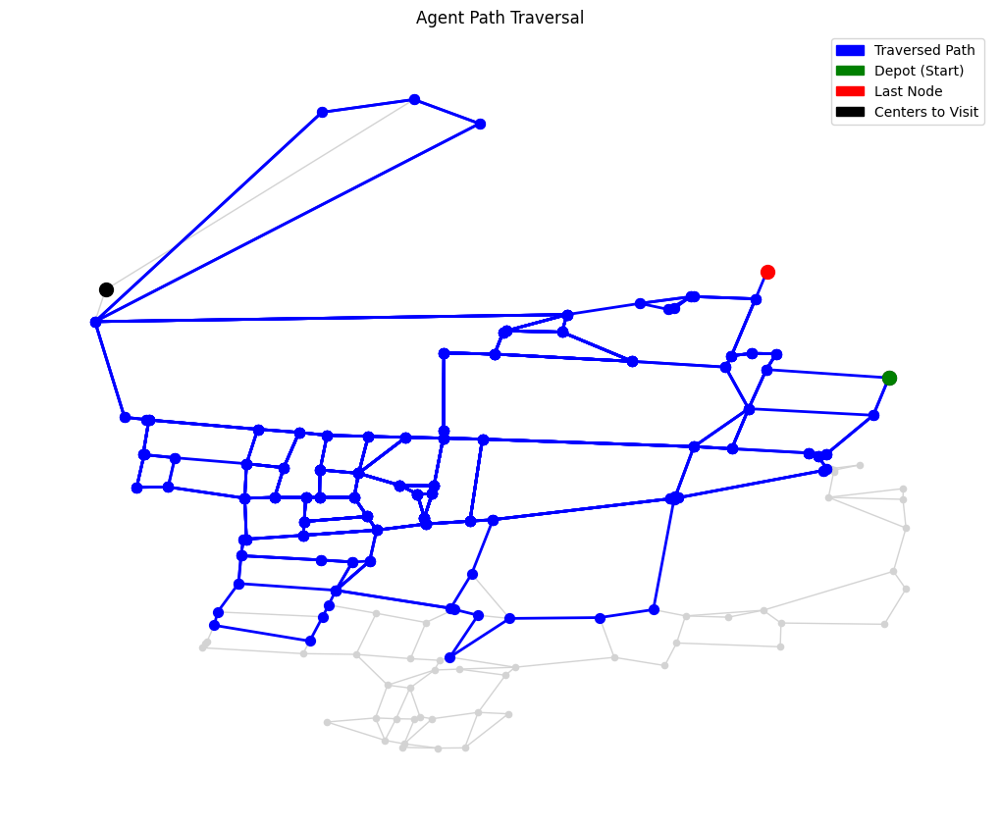

Episode 2, Total reward: -108676812.26


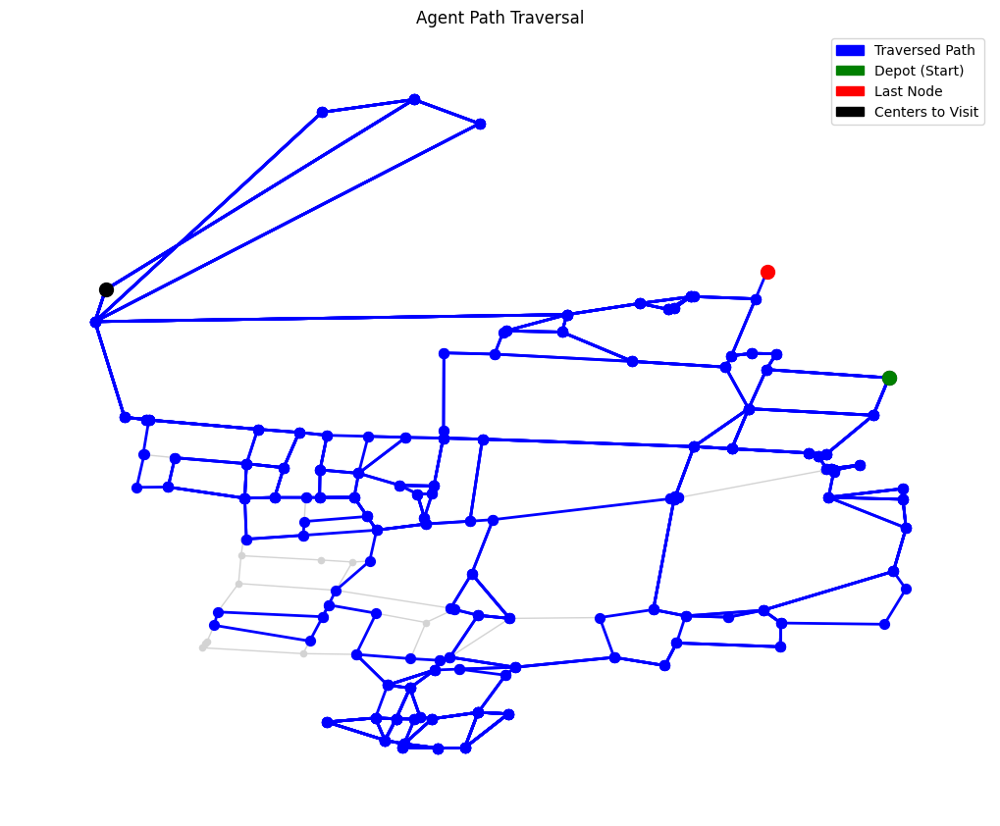

Episode 3, Total reward: -118727456.76


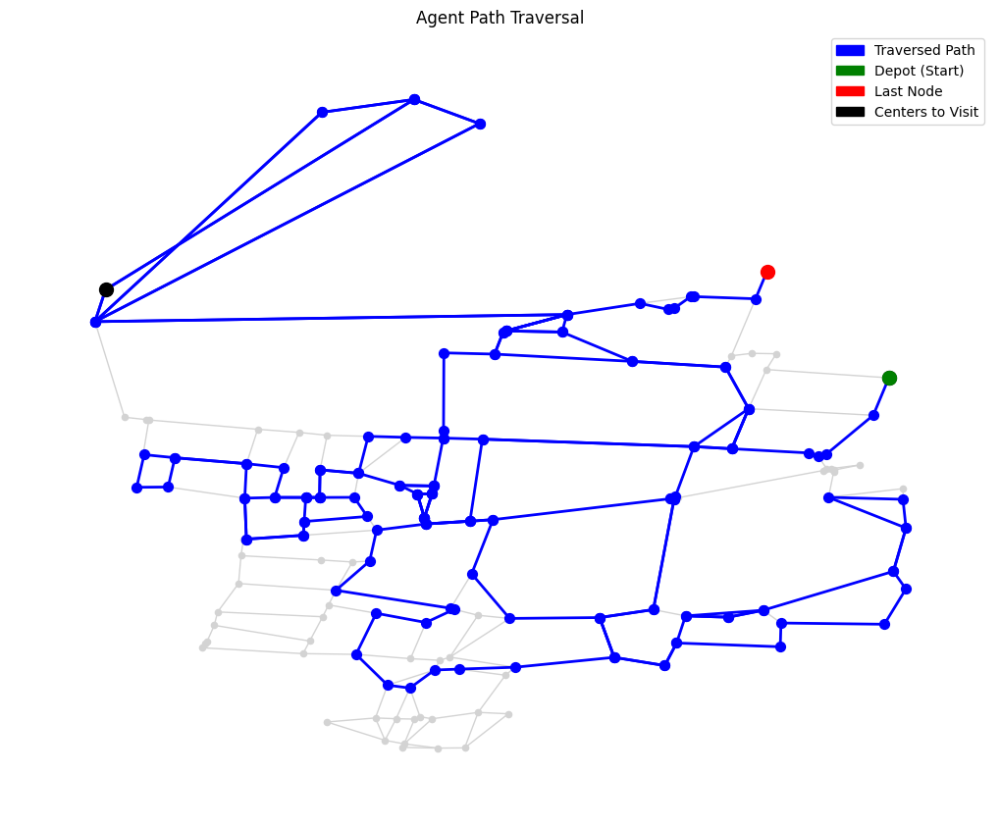

Episode 4, Total reward: -6592597.06


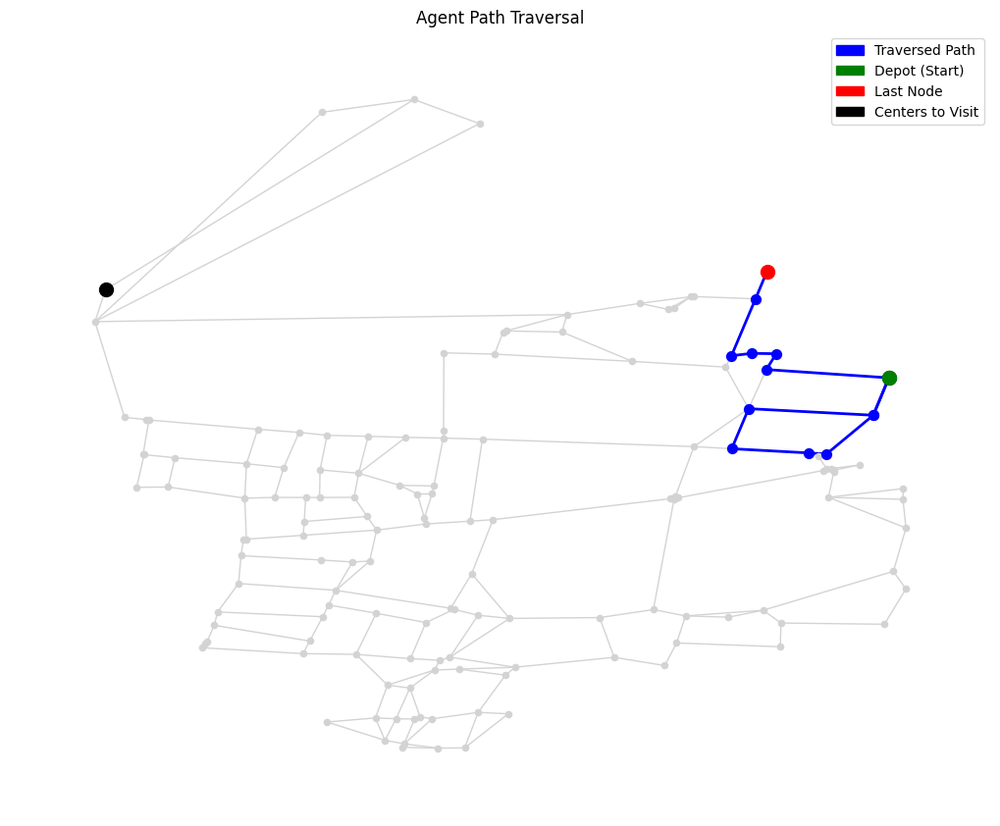

Episode 5, Total reward: -10.00


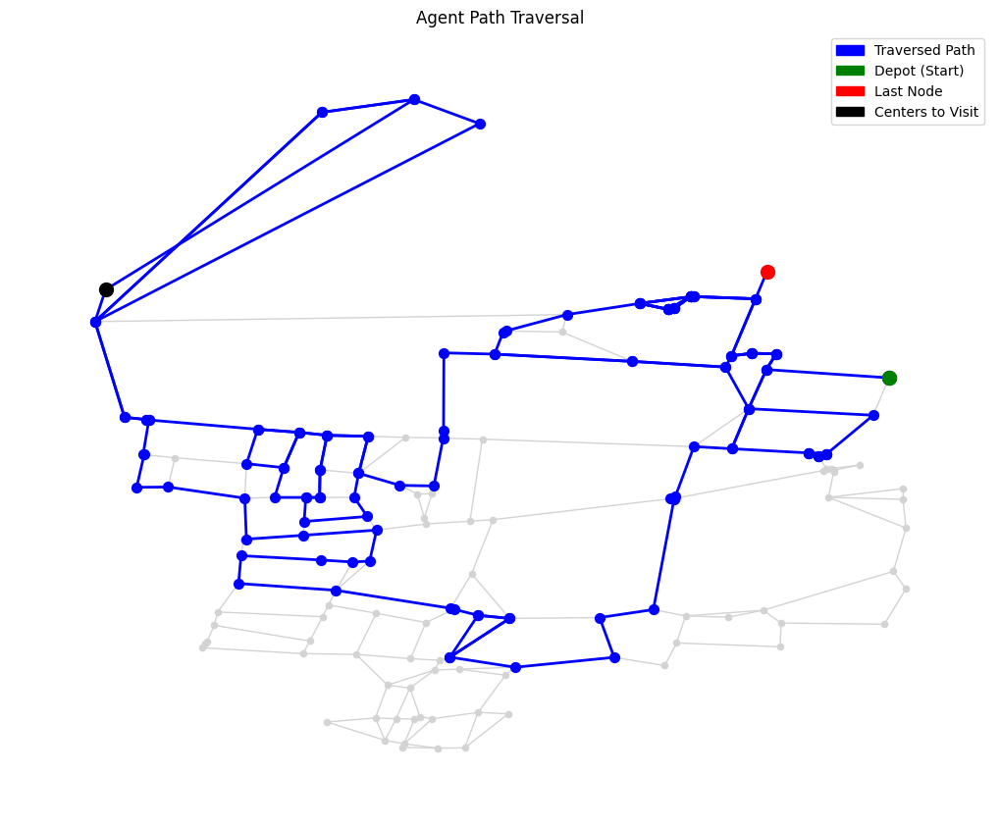

Episode 6, Total reward: -4394193.33


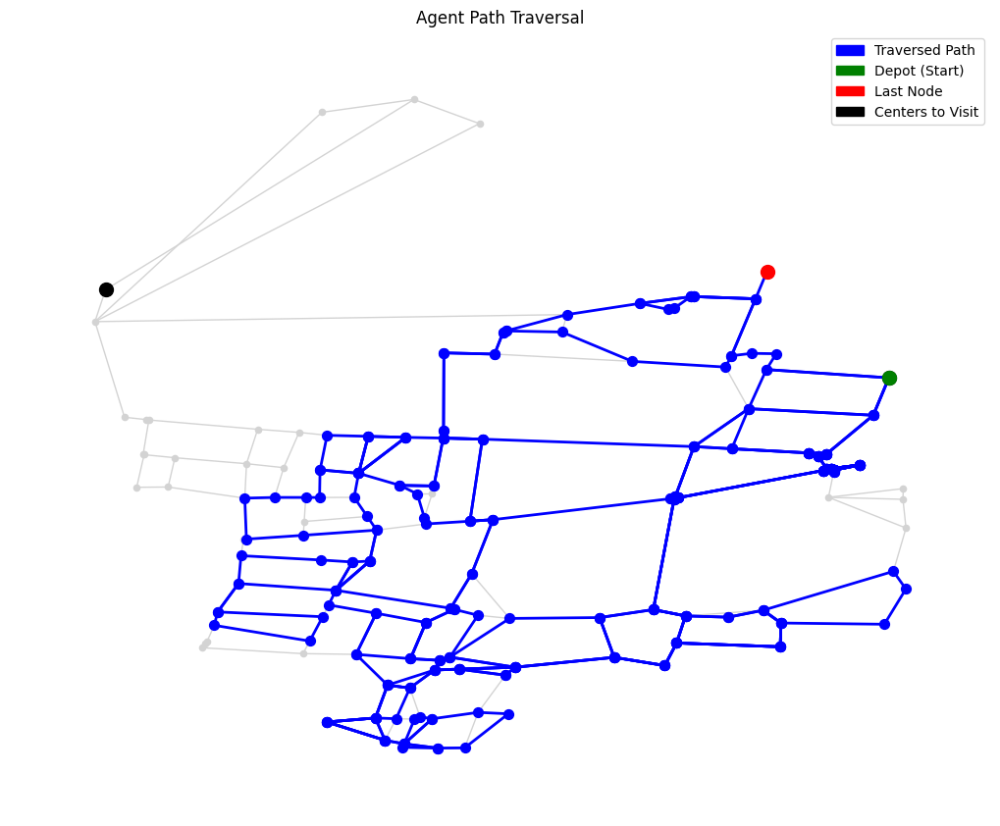

Episode 7, Total reward: -16011664.66


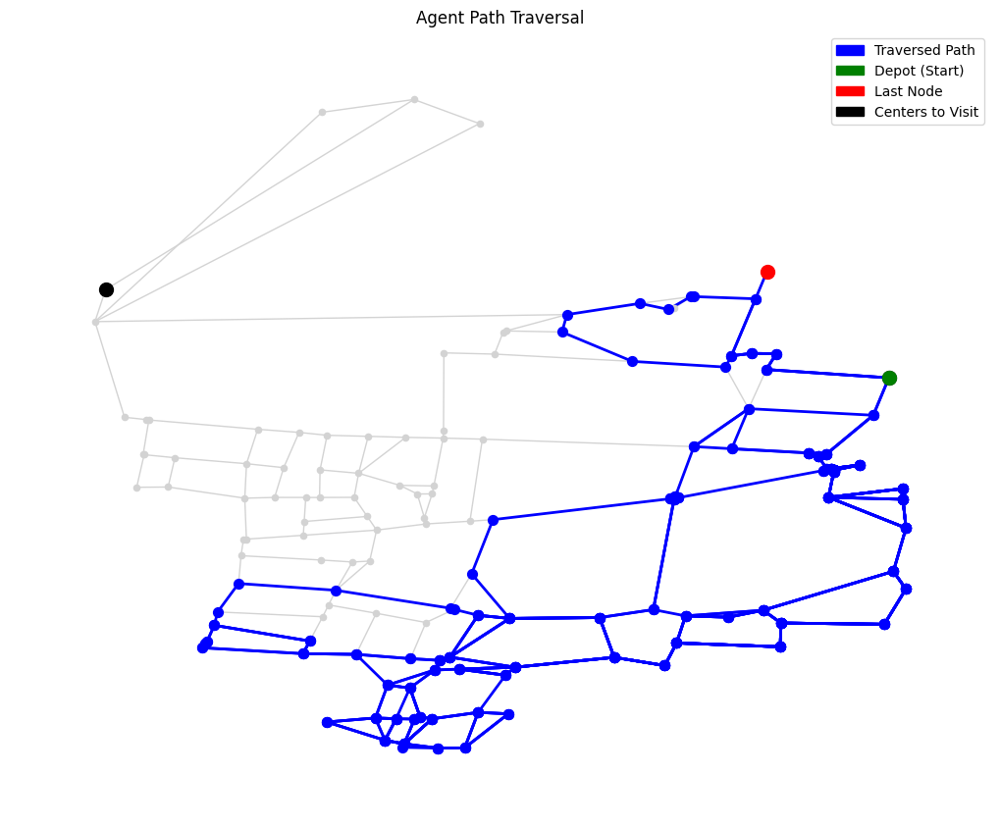

Episode 8, Total reward: -27373841.03


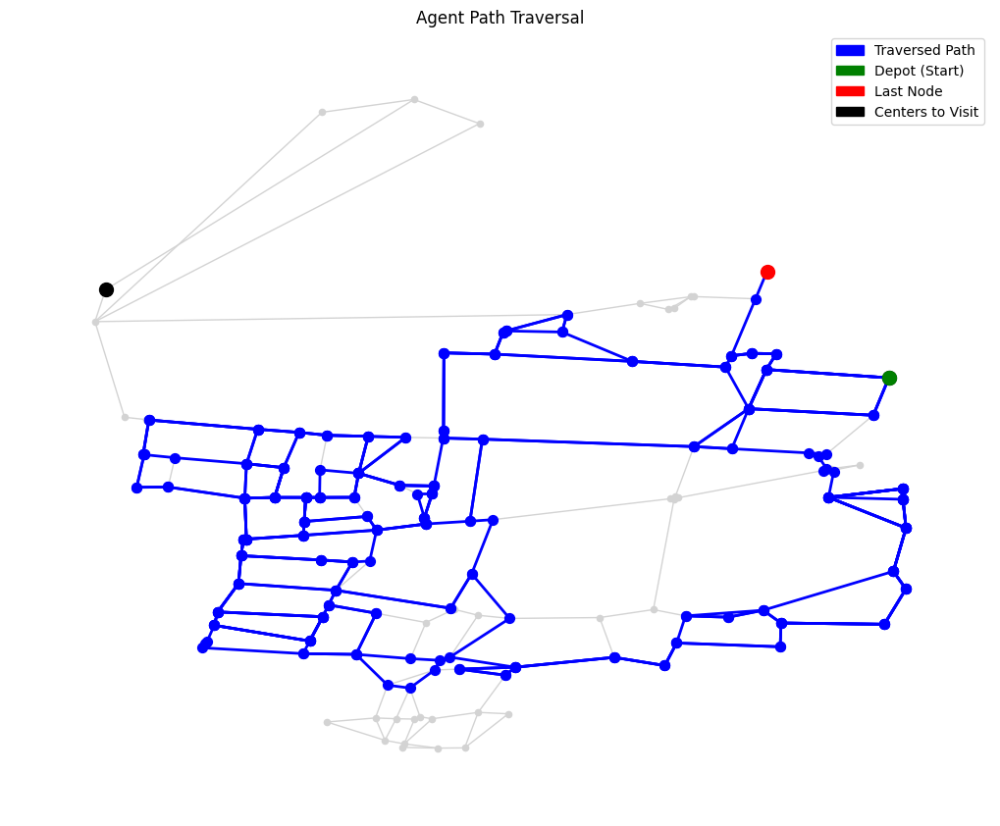

Episode 9, Total reward: -24182749.44


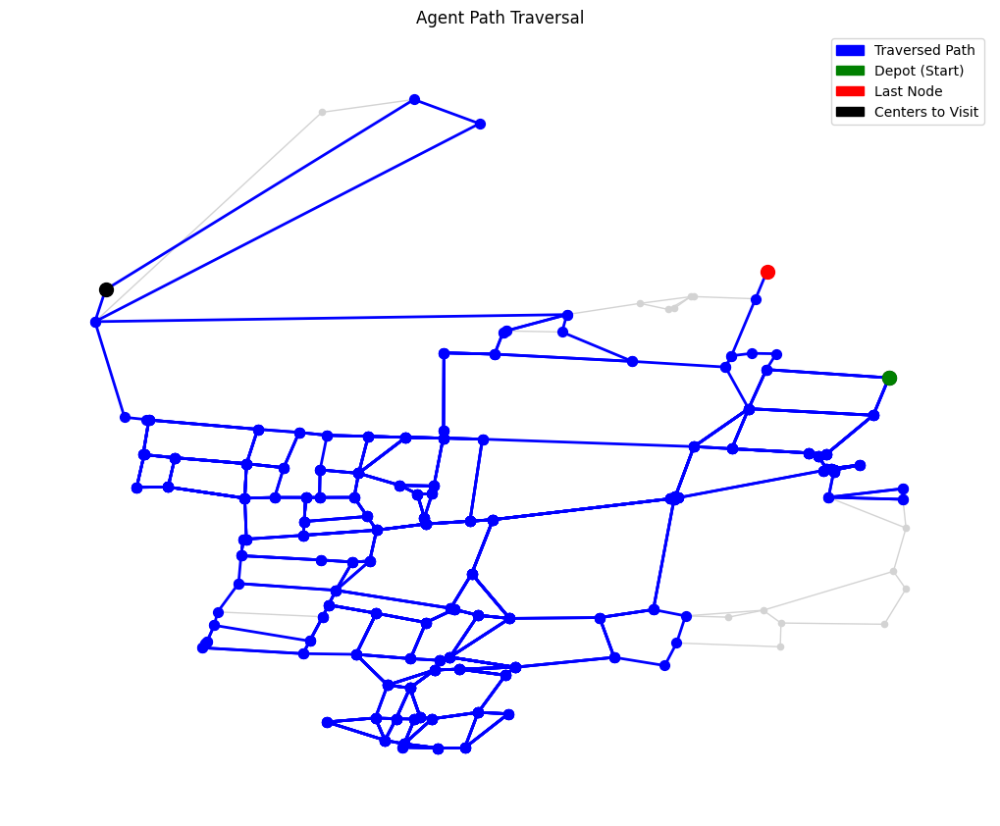

Episode 10, Total reward: -141143012.57


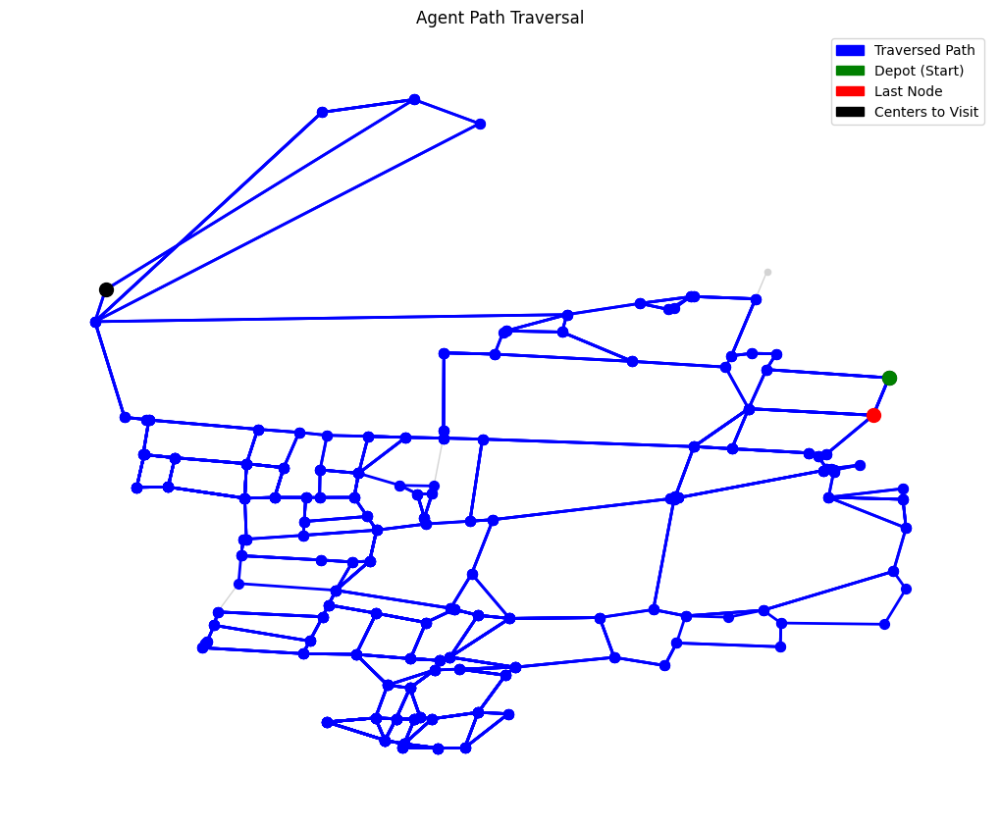

Episode 11, Total reward: -229244918.76


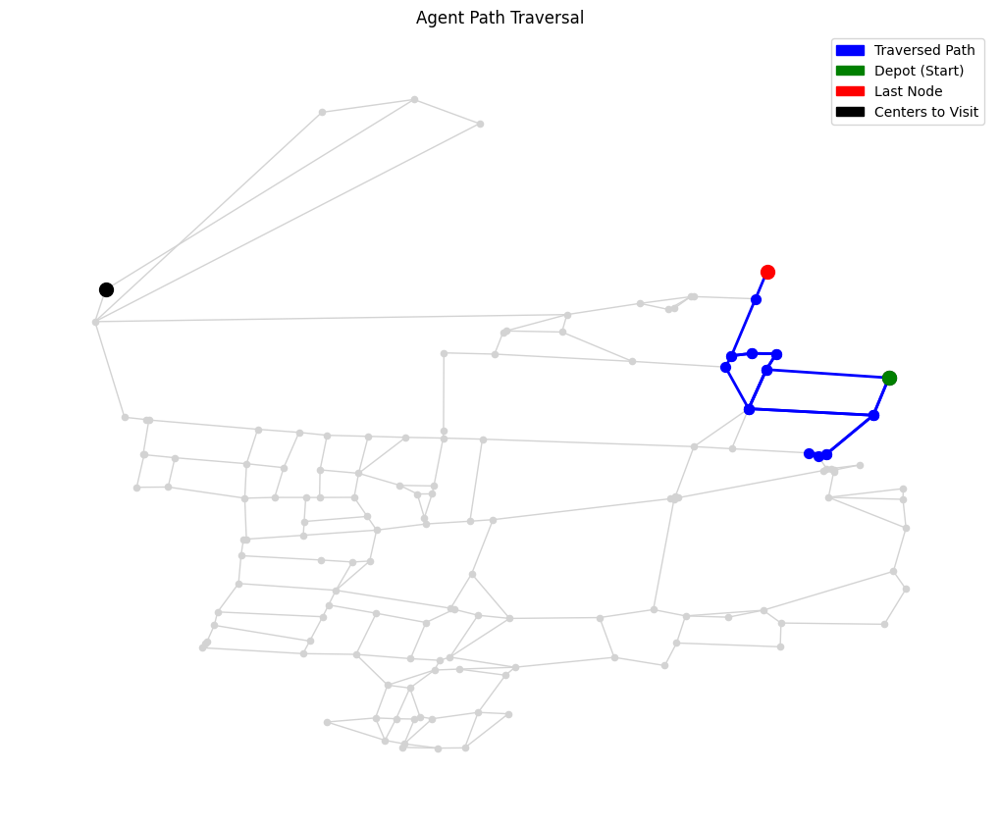

Episode 12, Total reward: -20115.14


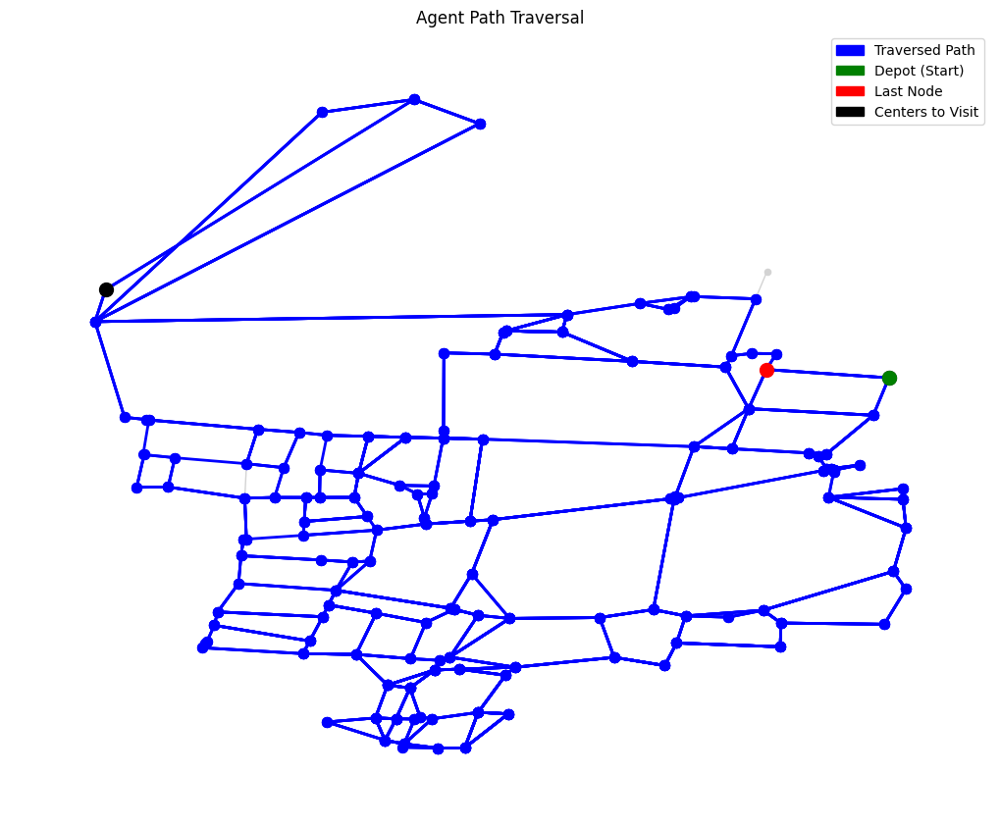

Episode 13, Total reward: -270513940.97


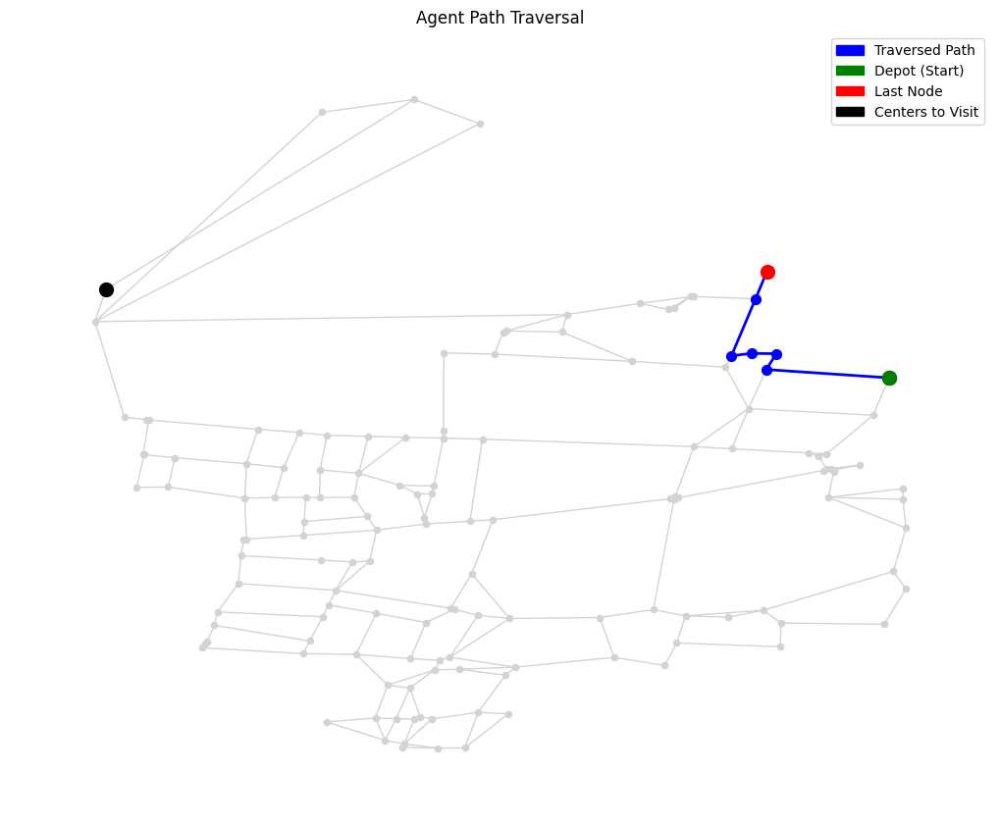

Episode 14, Total reward: 0.00


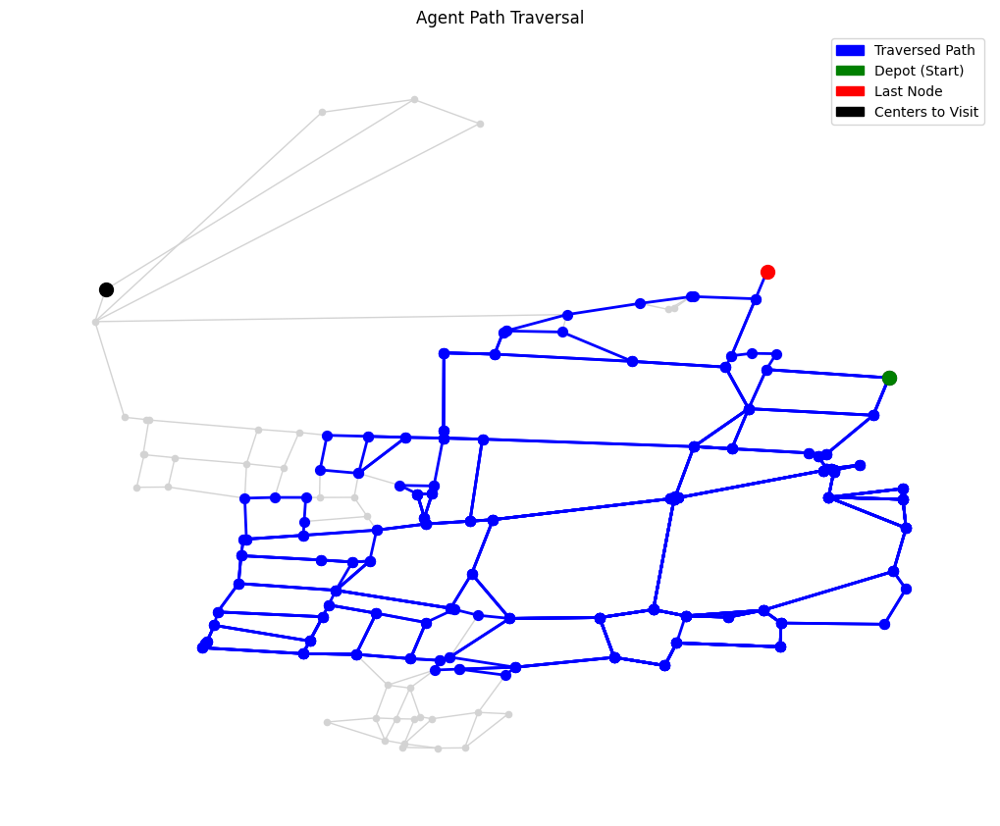

Episode 15, Total reward: -52250257.51


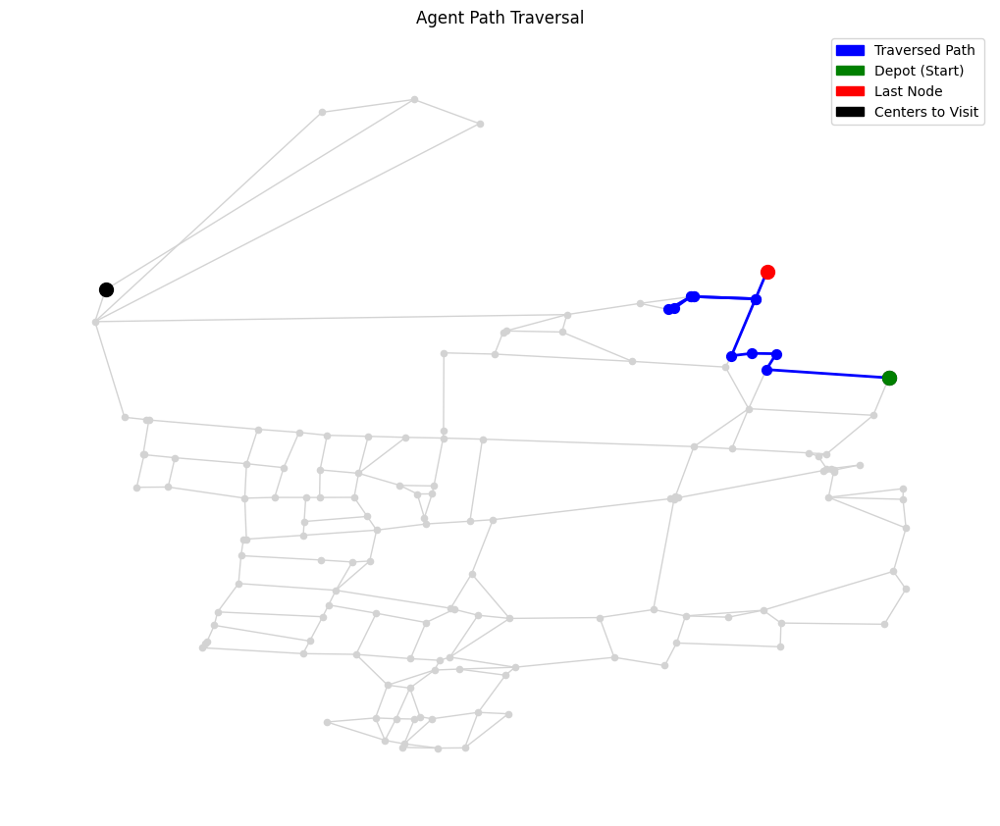

Episode 16, Total reward: -15.00


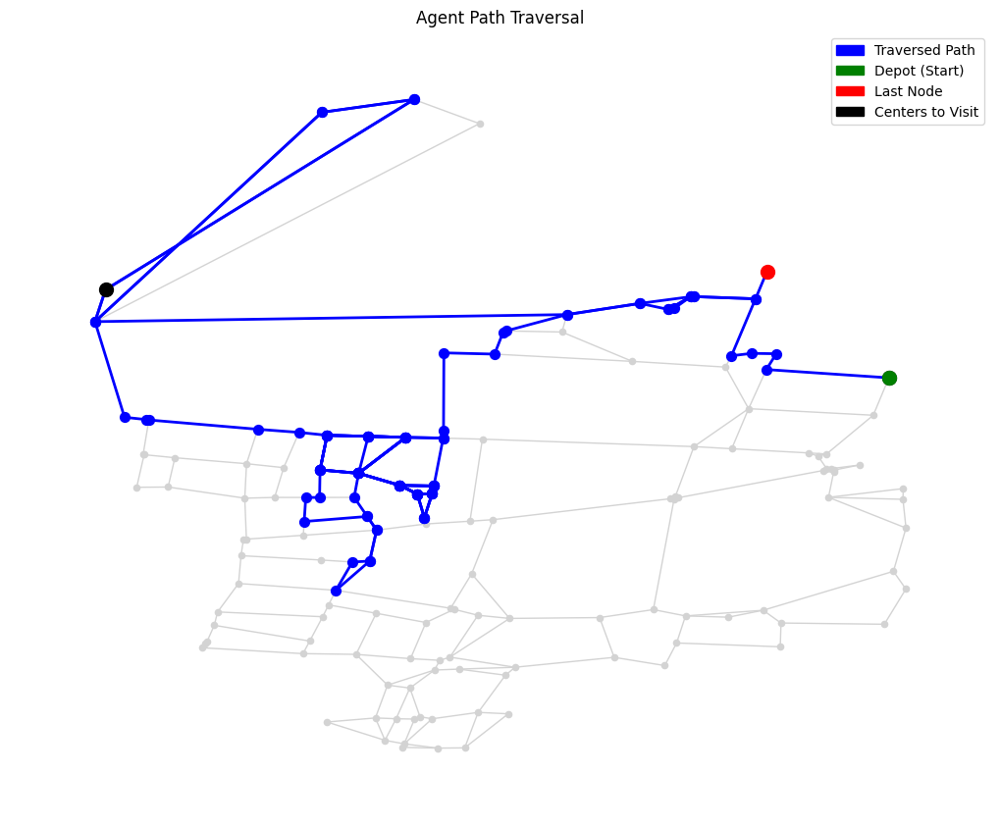

Episode 17, Total reward: -2546388.28


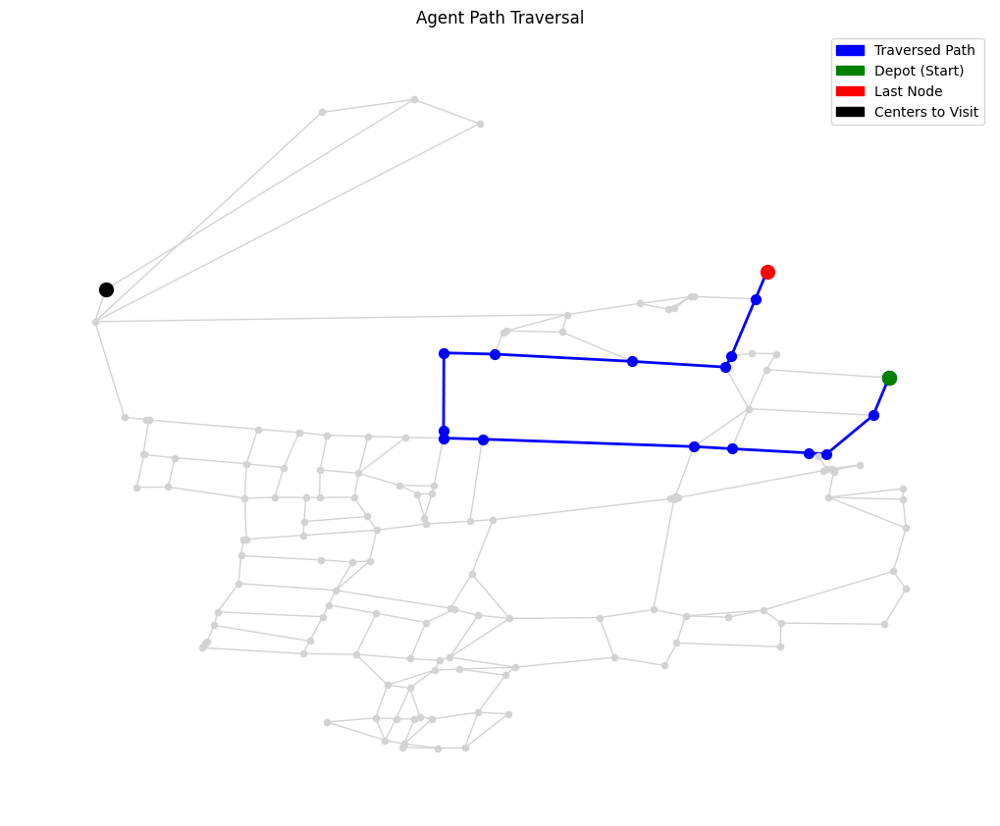

Episode 18, Total reward: -6026.10


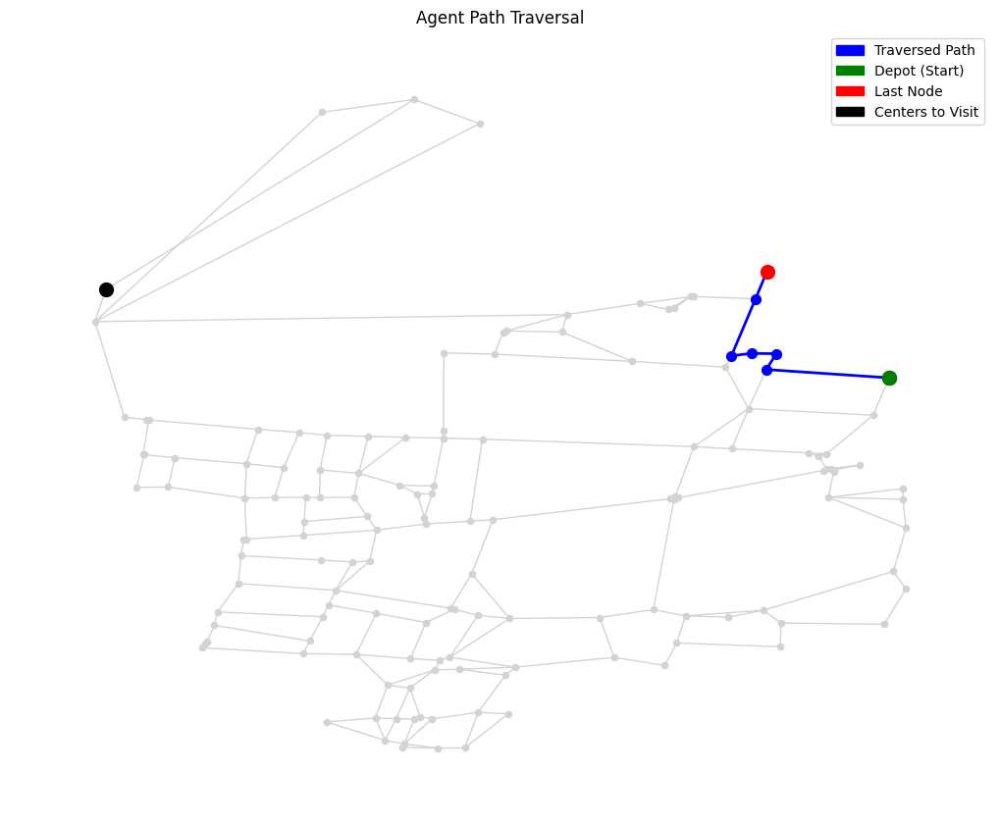

Episode 19, Total reward: 0.00


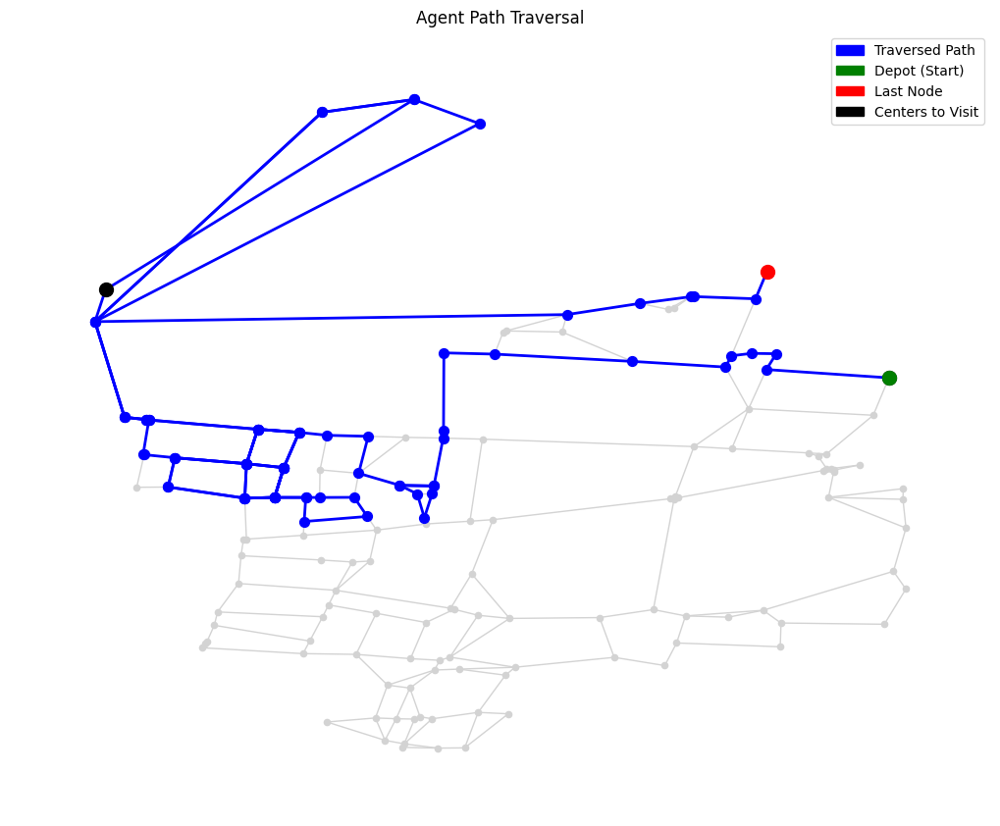

Episode 20, Total reward: -2748862.56


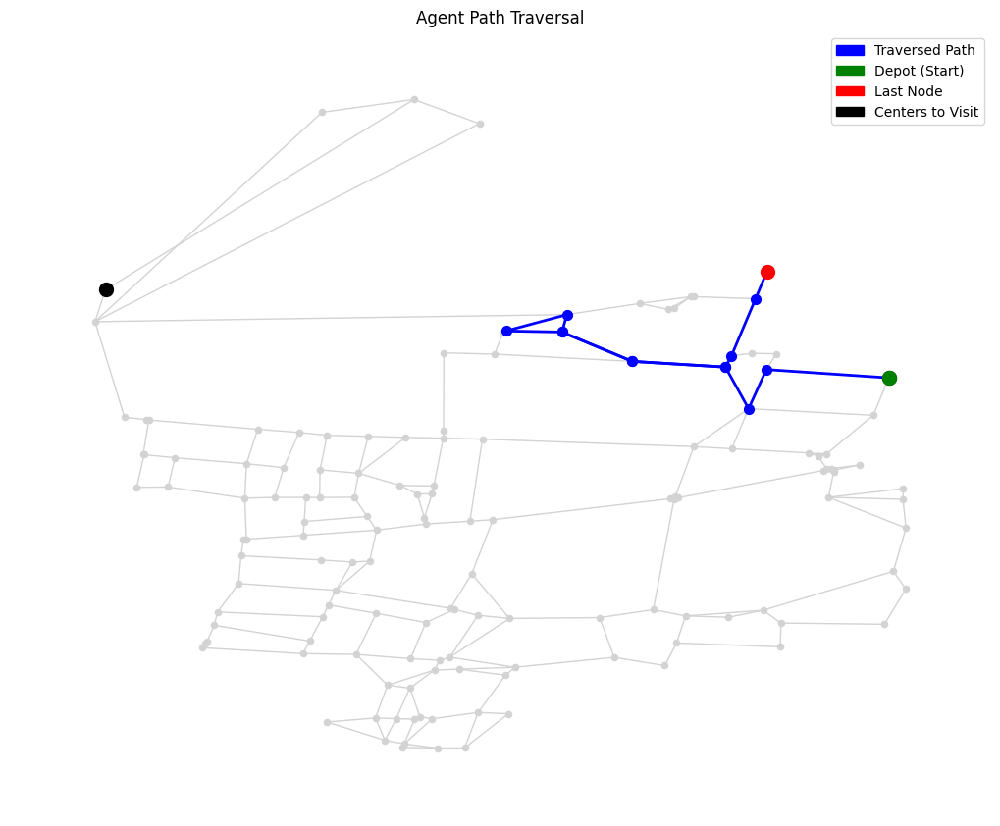

Episode 21, Total reward: -2713.61


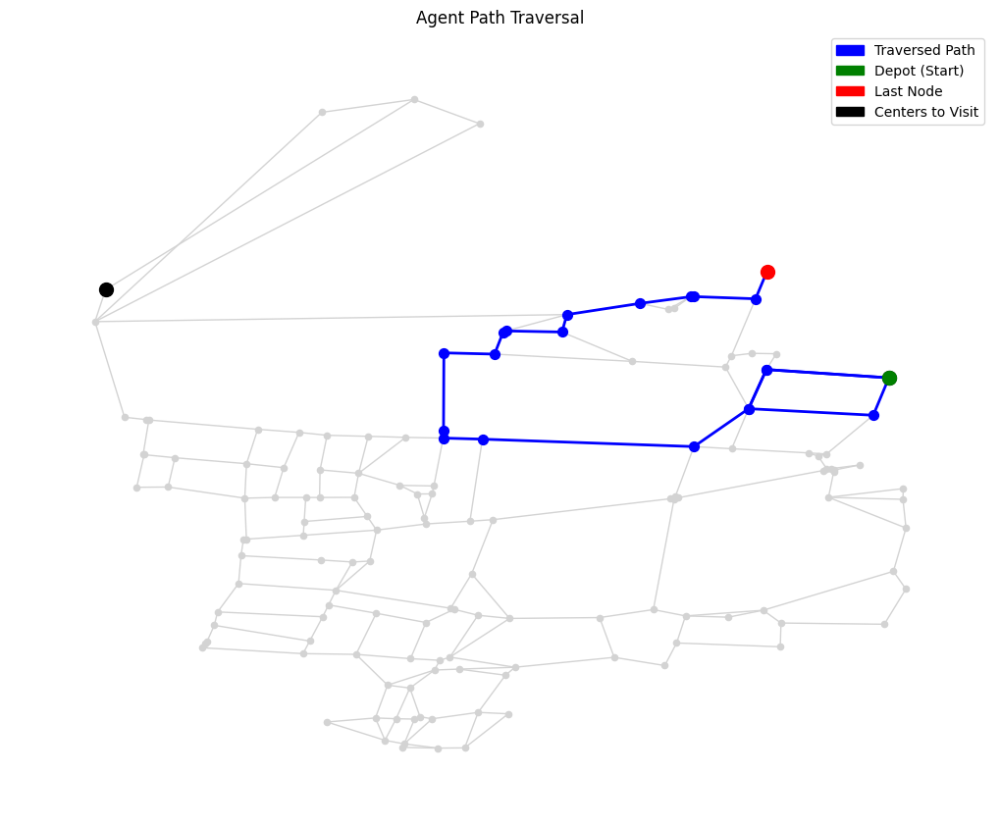

Episode 22, Total reward: -28027.12


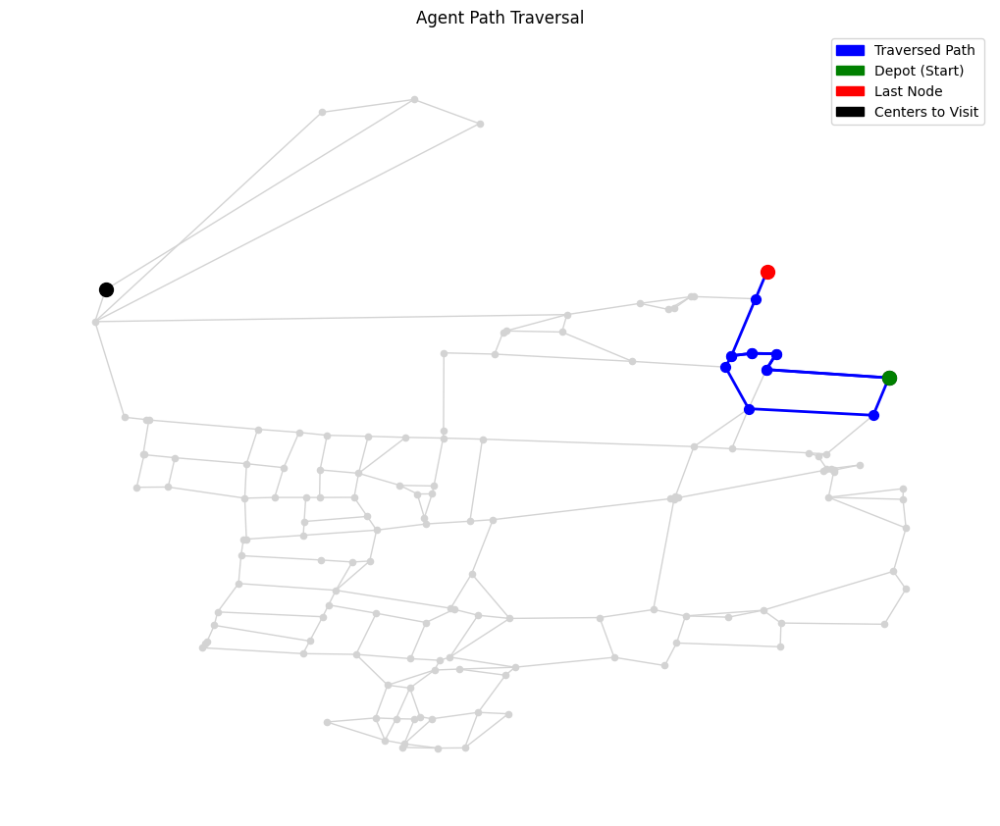

Episode 23, Total reward: -988.67


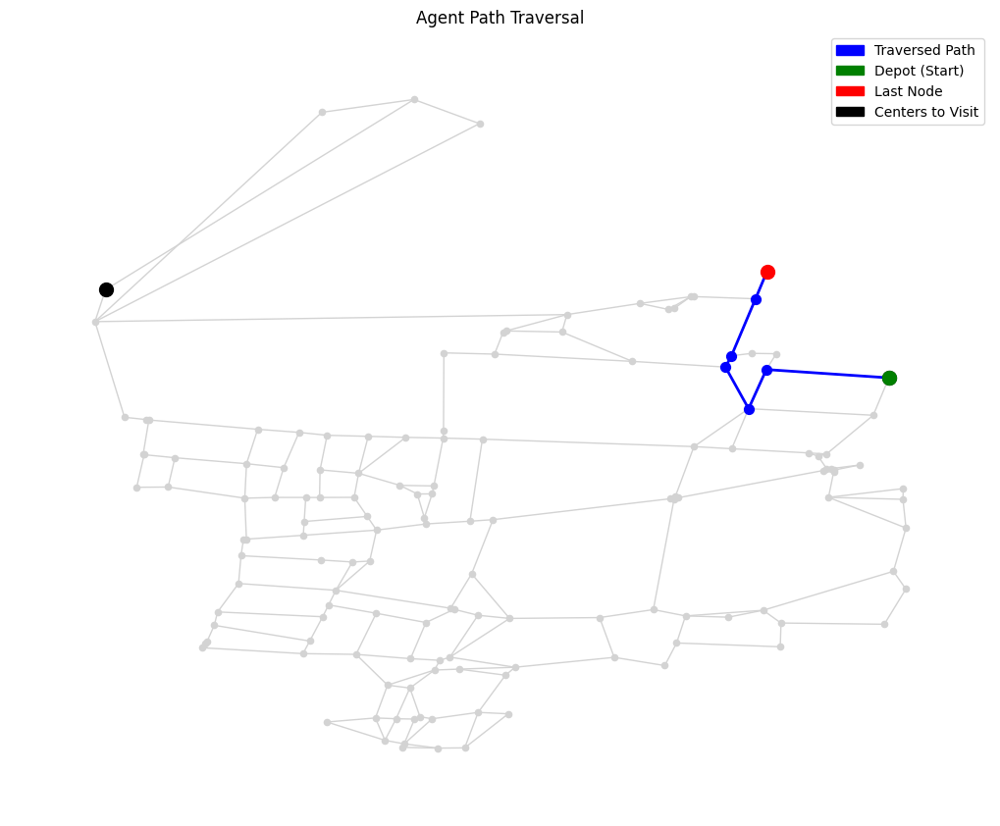

Episode 24, Total reward: 0.00


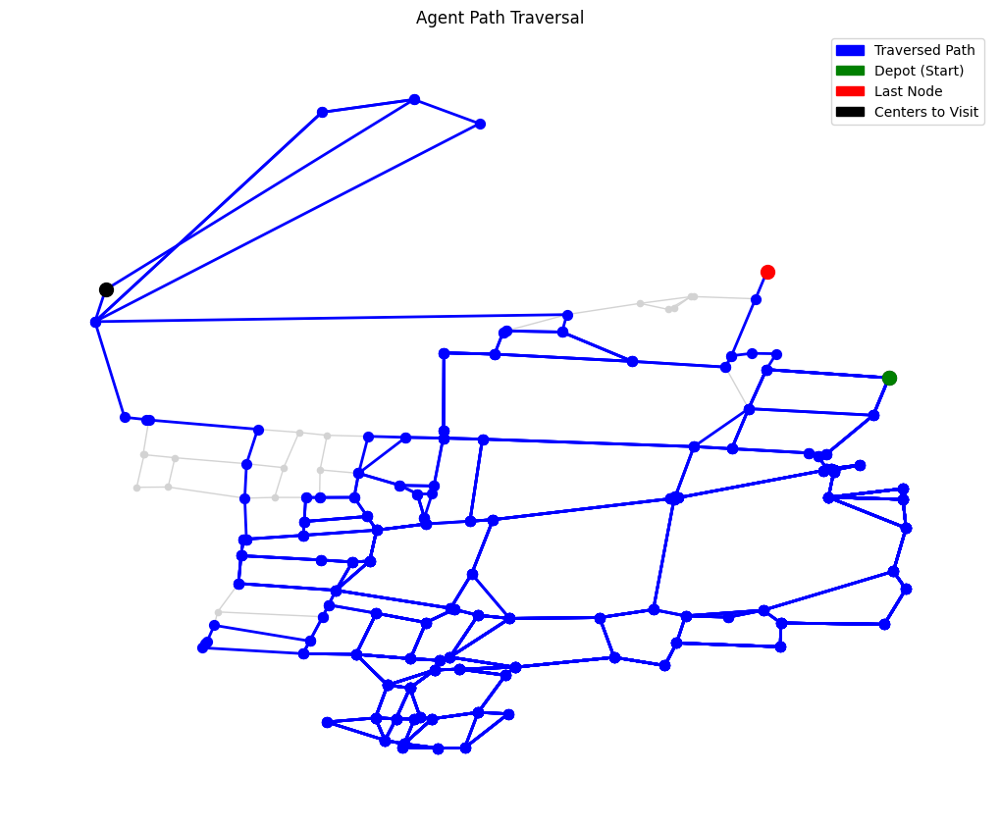

Episode 25, Total reward: -181938644.40


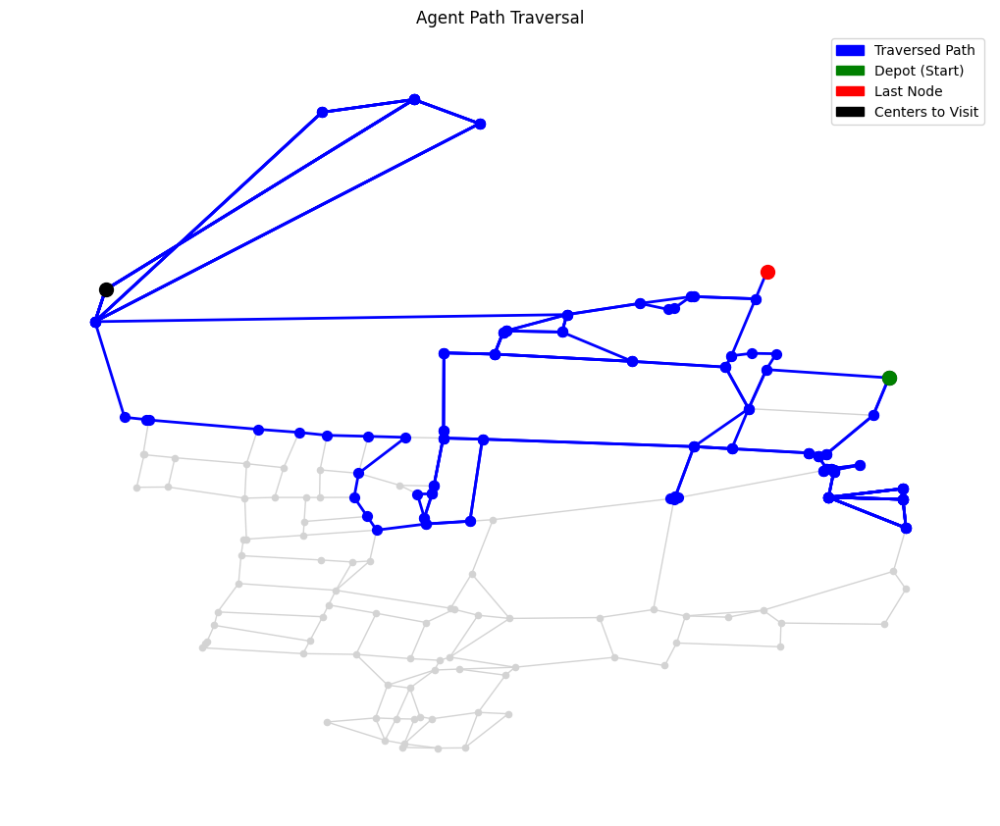

Episode 26, Total reward: -9078538.12


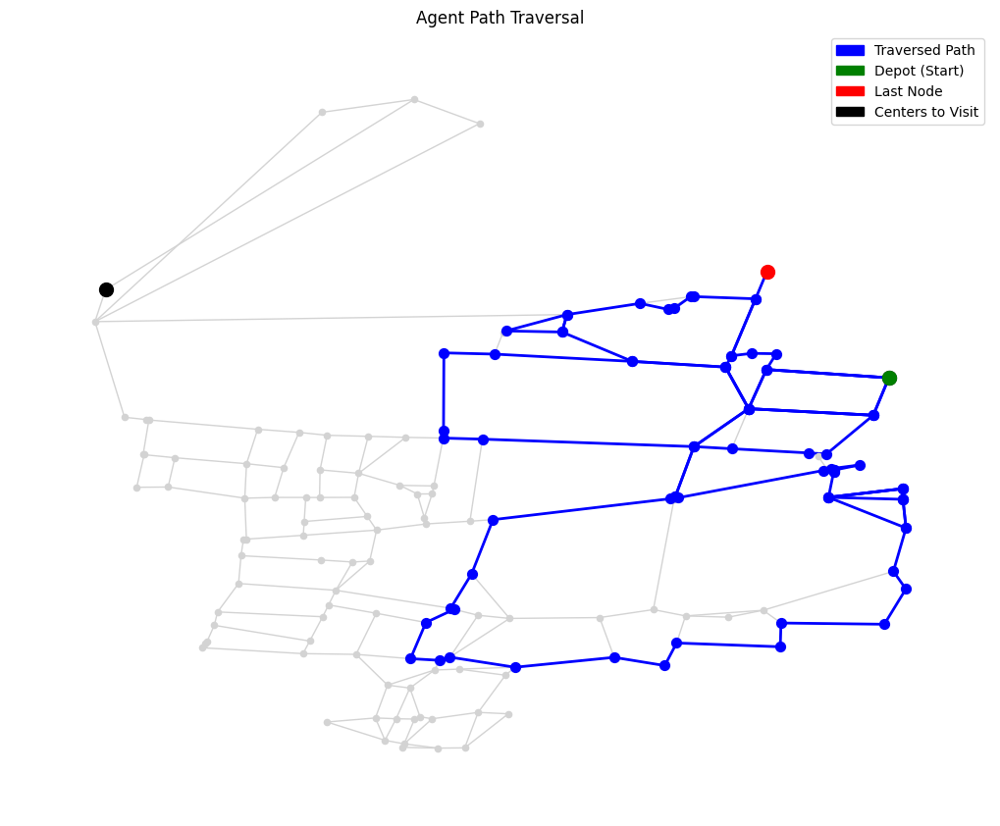

Episode 27, Total reward: -1149421.44


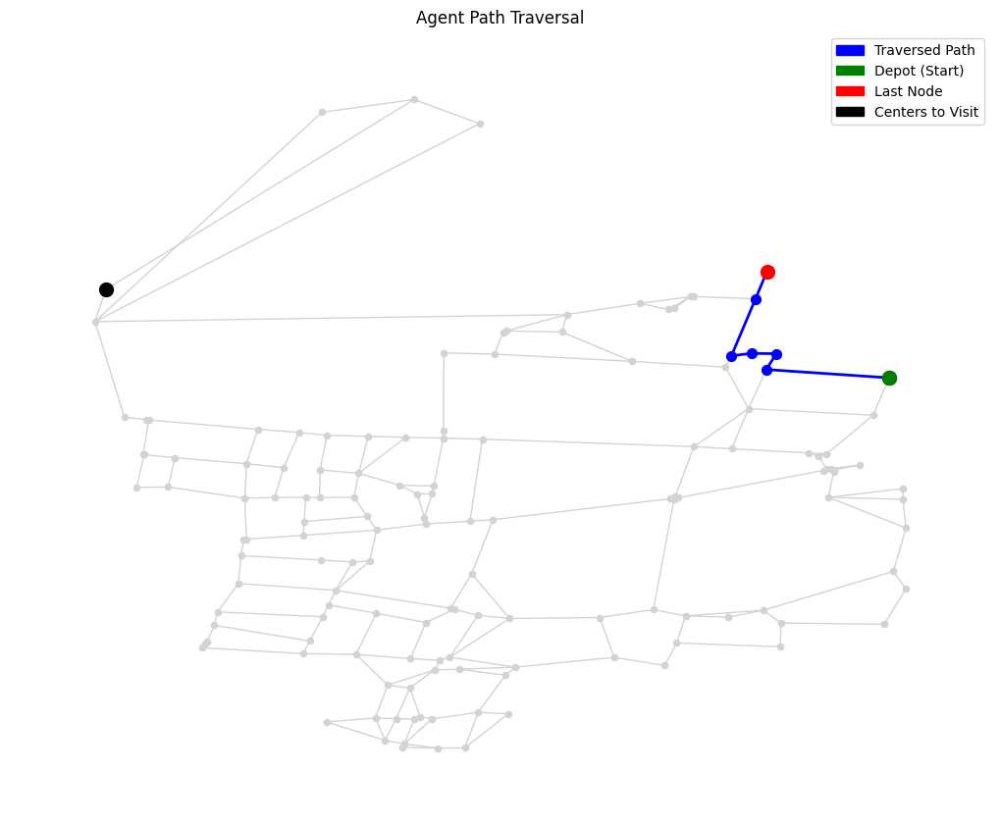

Episode 28, Total reward: 0.00


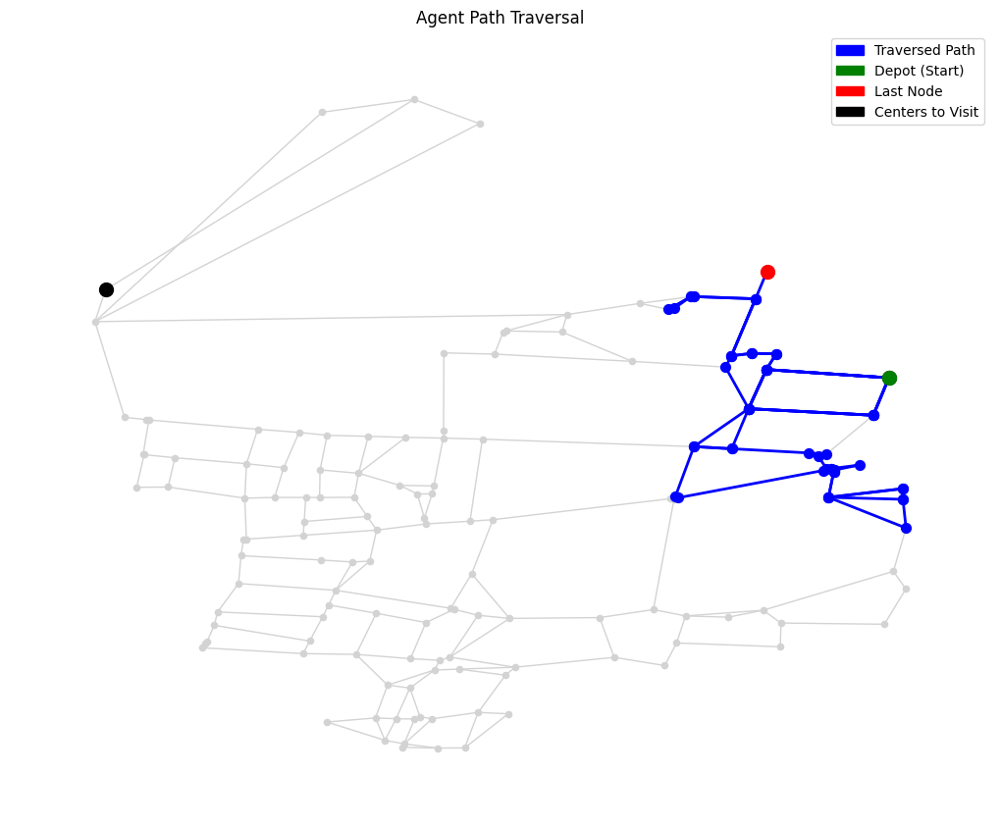

Episode 29, Total reward: -521341.92


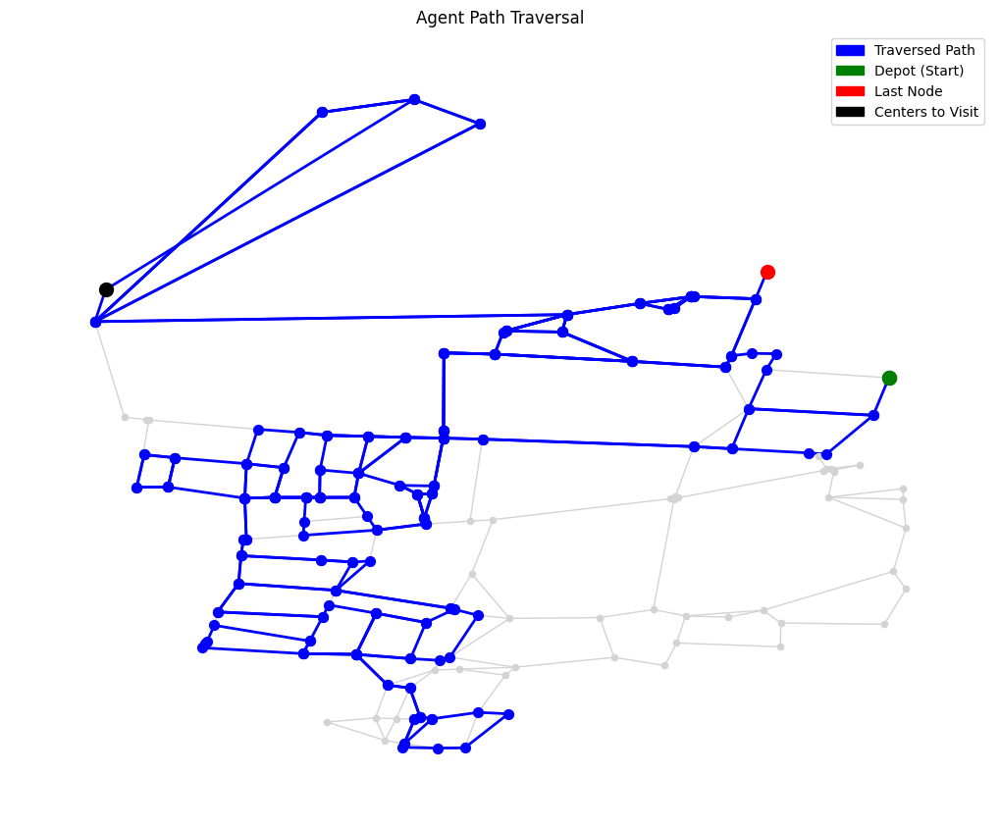

Episode 30, Total reward: -15473325.48


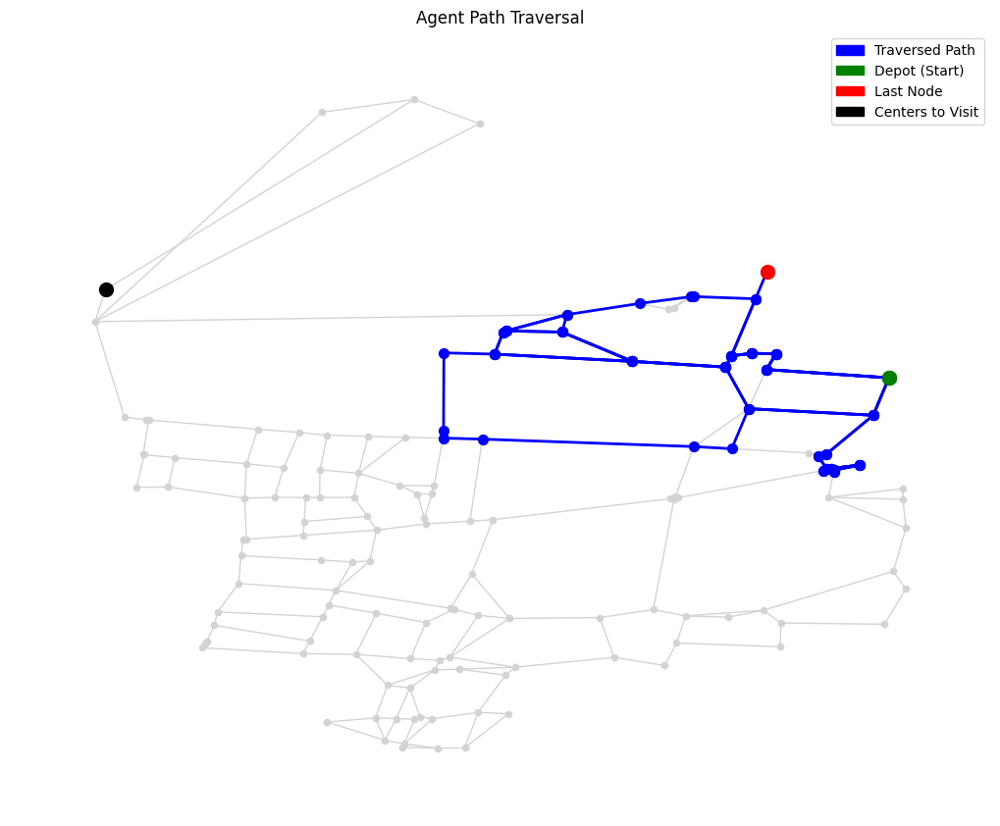

Episode 31, Total reward: -726421.70


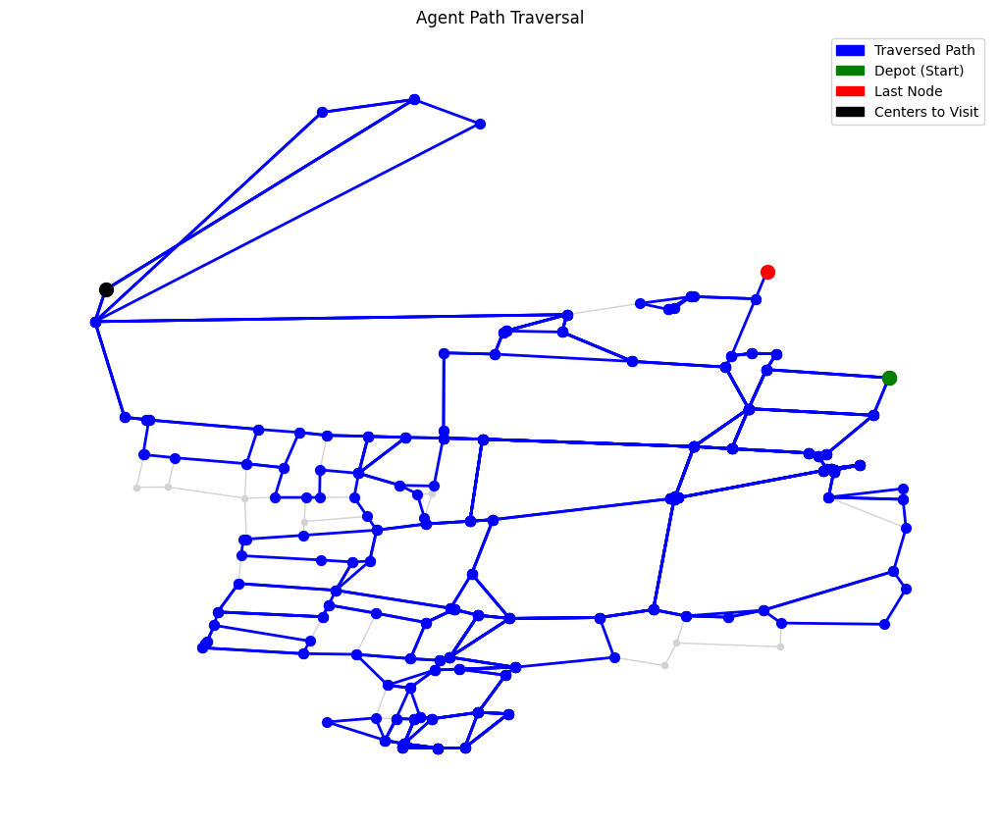

Episode 32, Total reward: -66161212.94


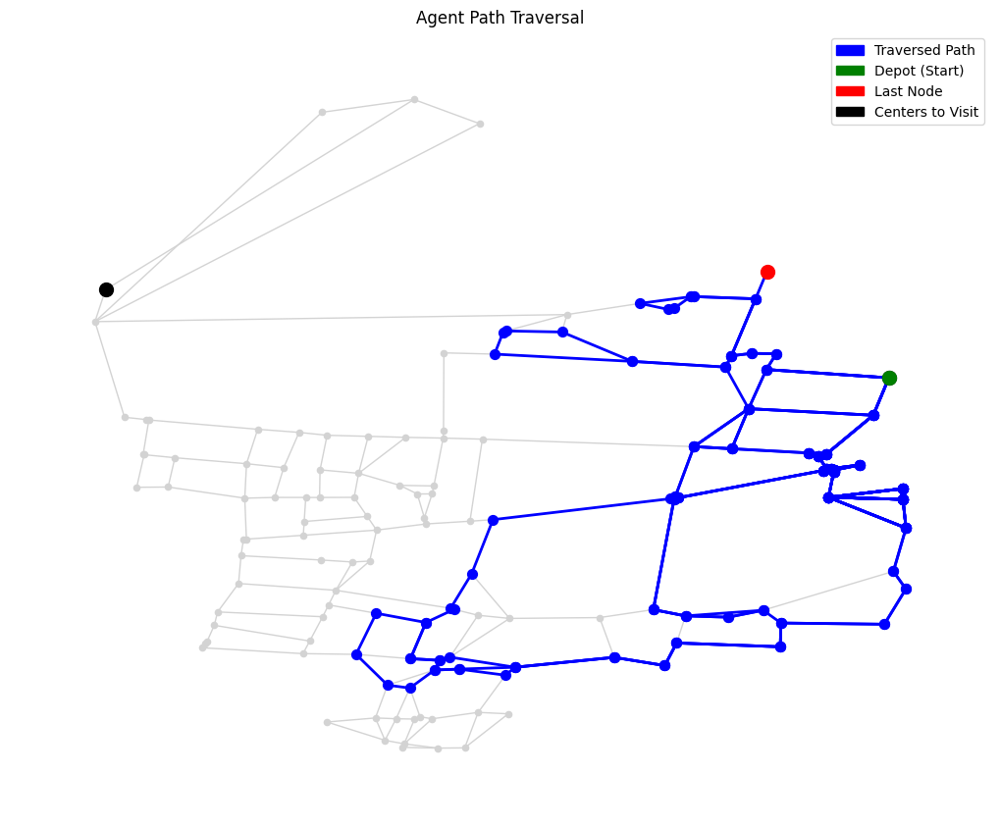

Episode 33, Total reward: -9383556.52


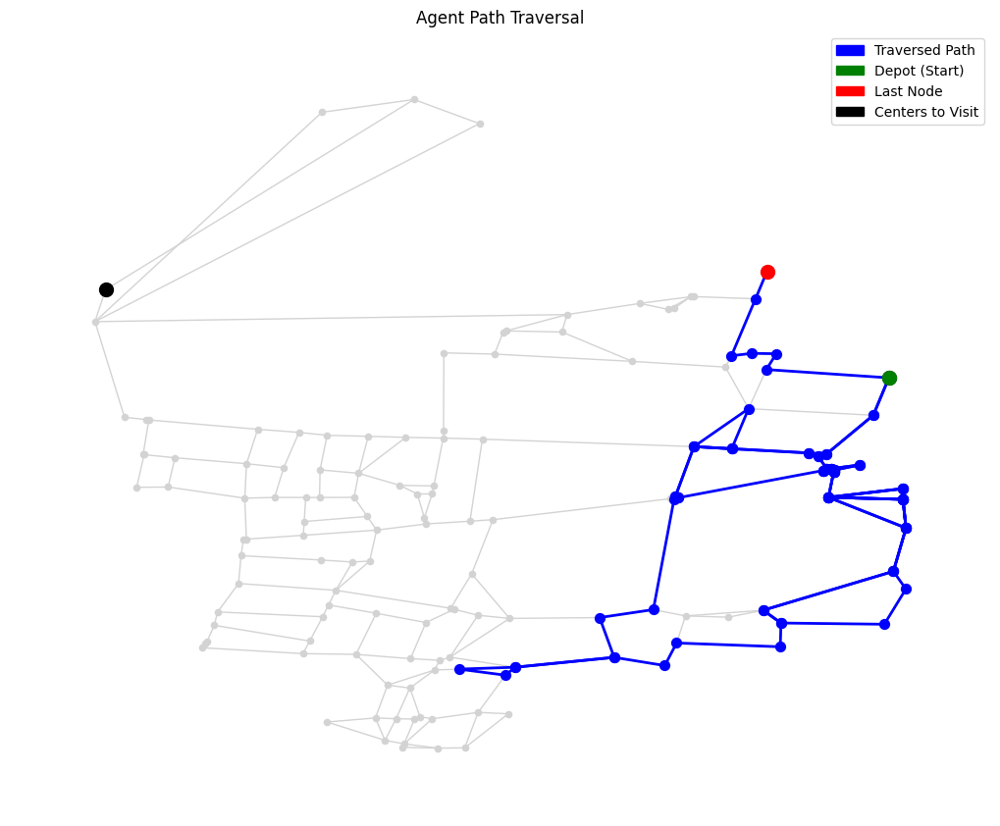

Episode 34, Total reward: -962946.42


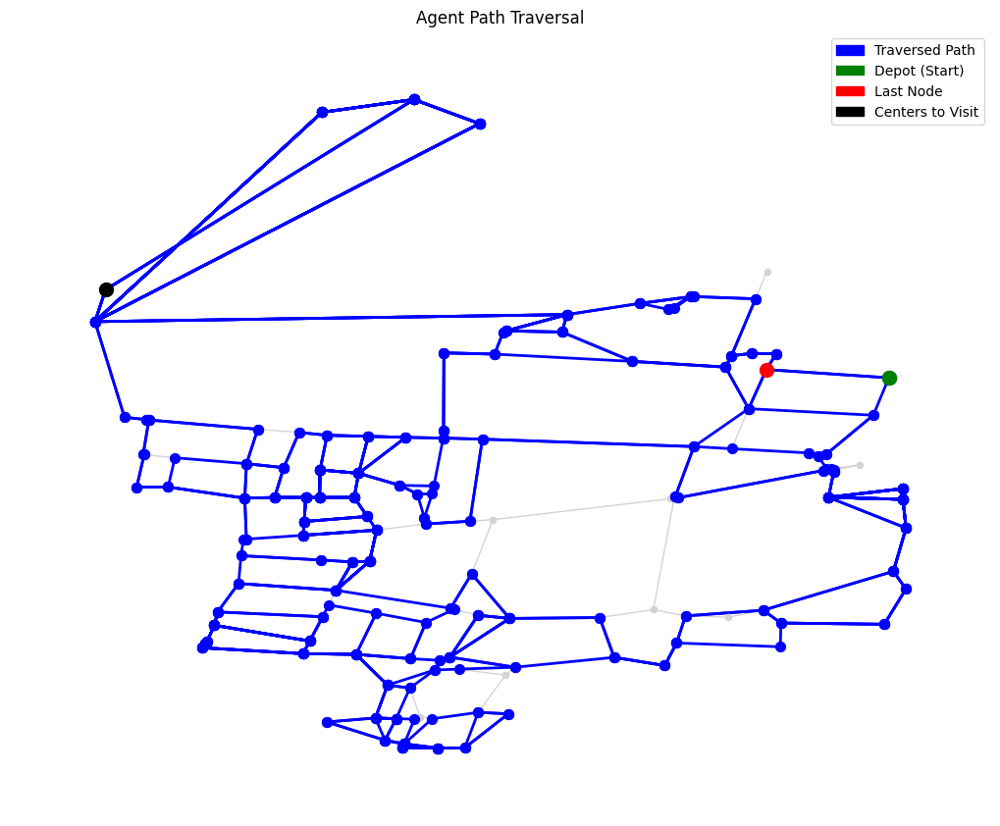

Episode 35, Total reward: -76578890.97


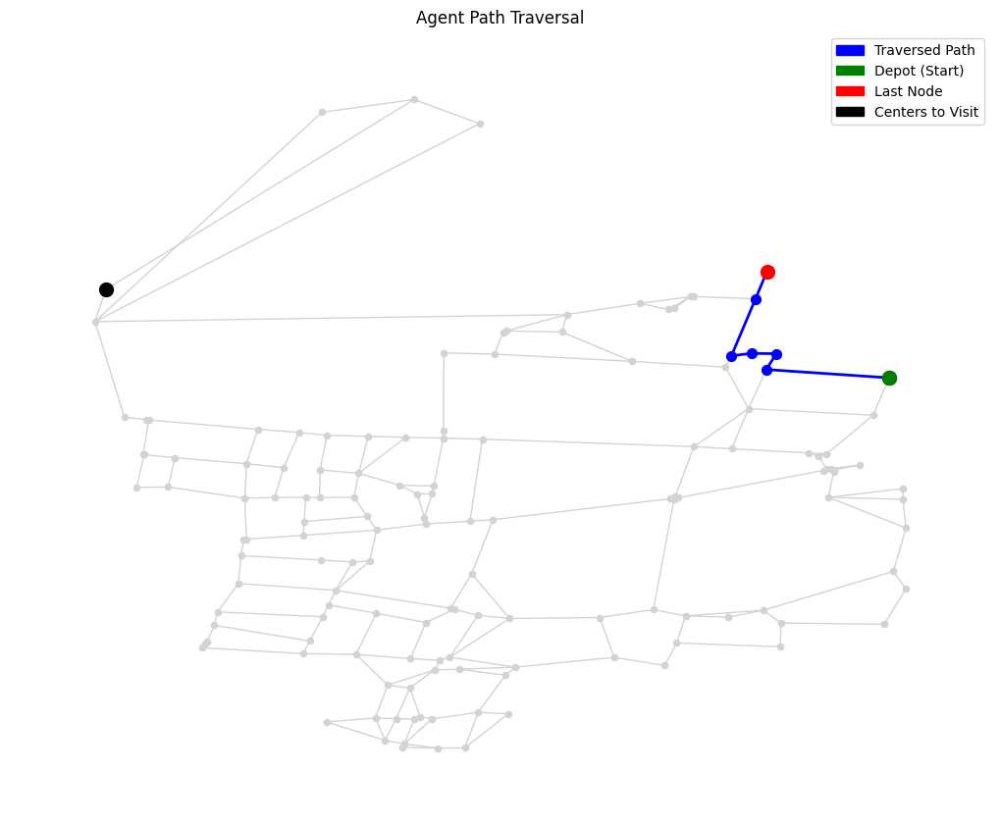

Episode 36, Total reward: 0.00


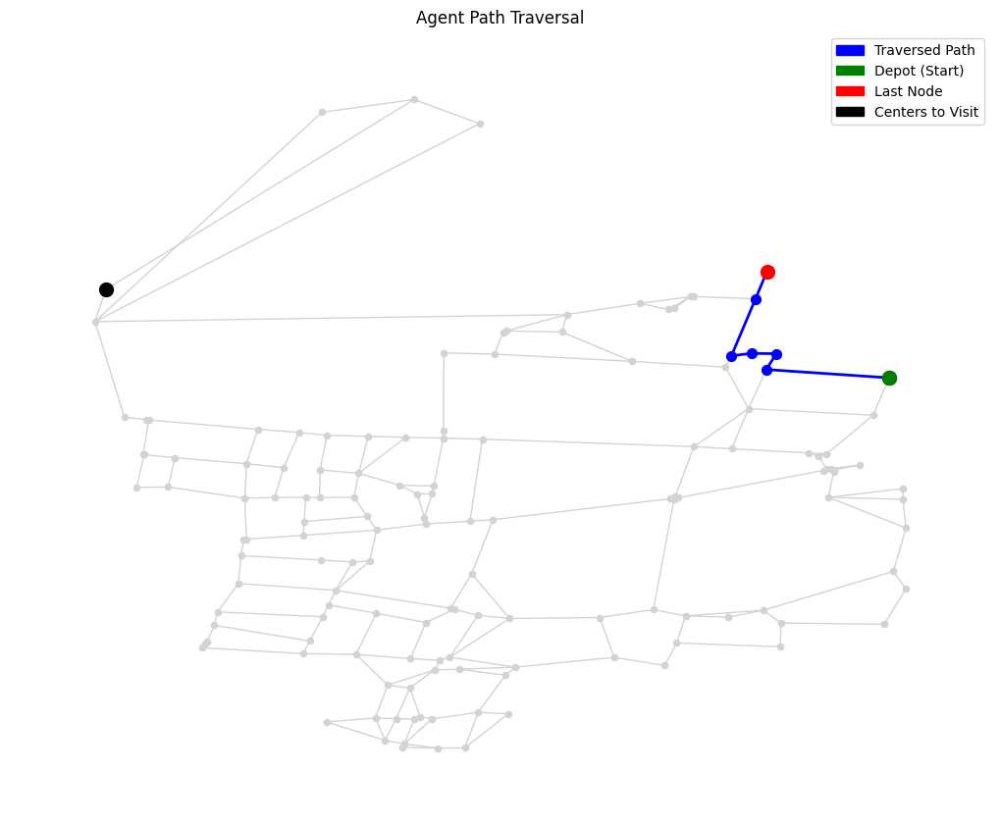

Episode 37, Total reward: 0.00


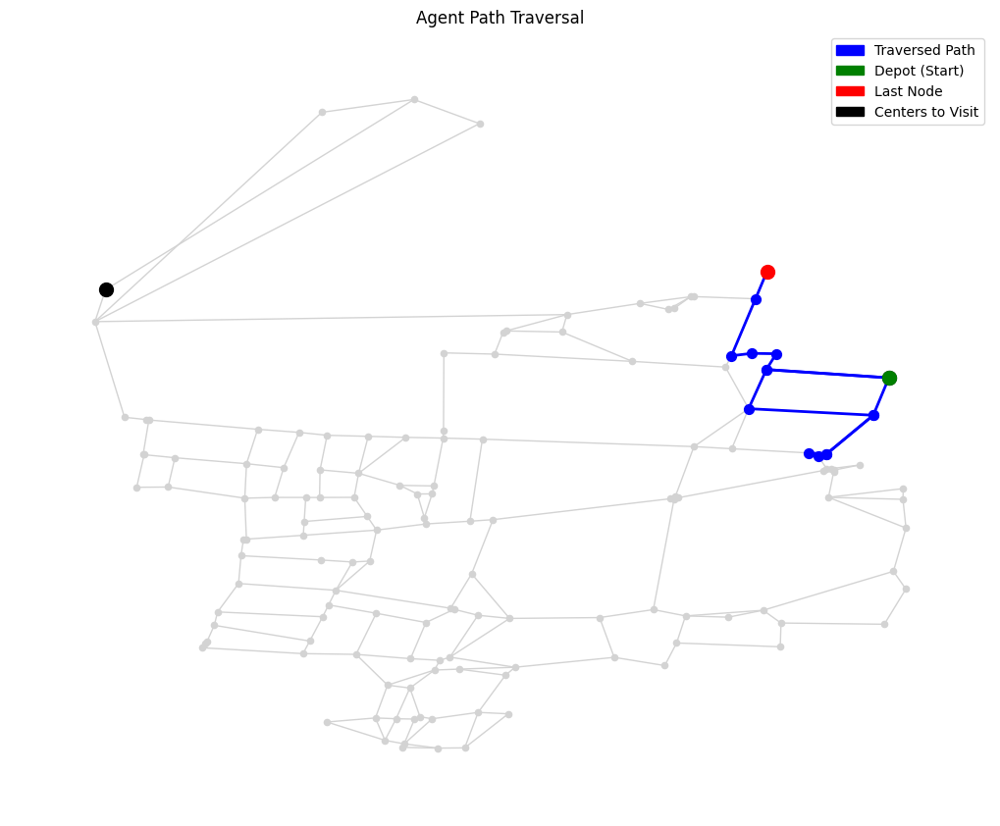

Episode 38, Total reward: -383.82


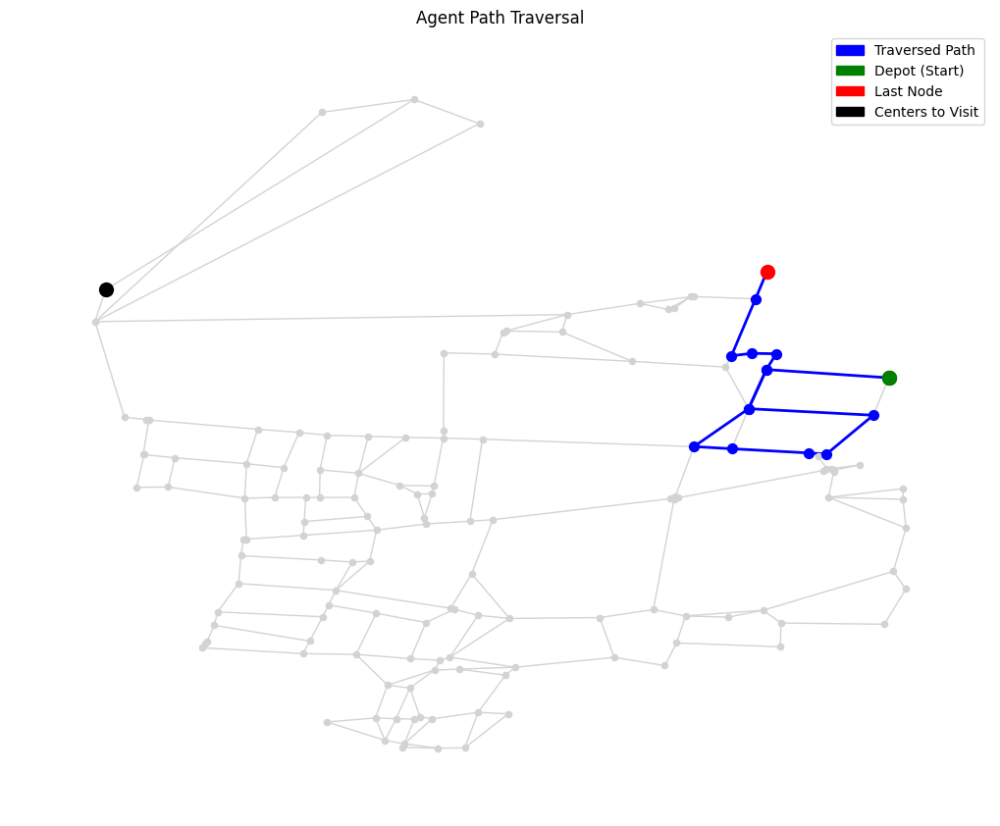

Episode 39, Total reward: -496.97


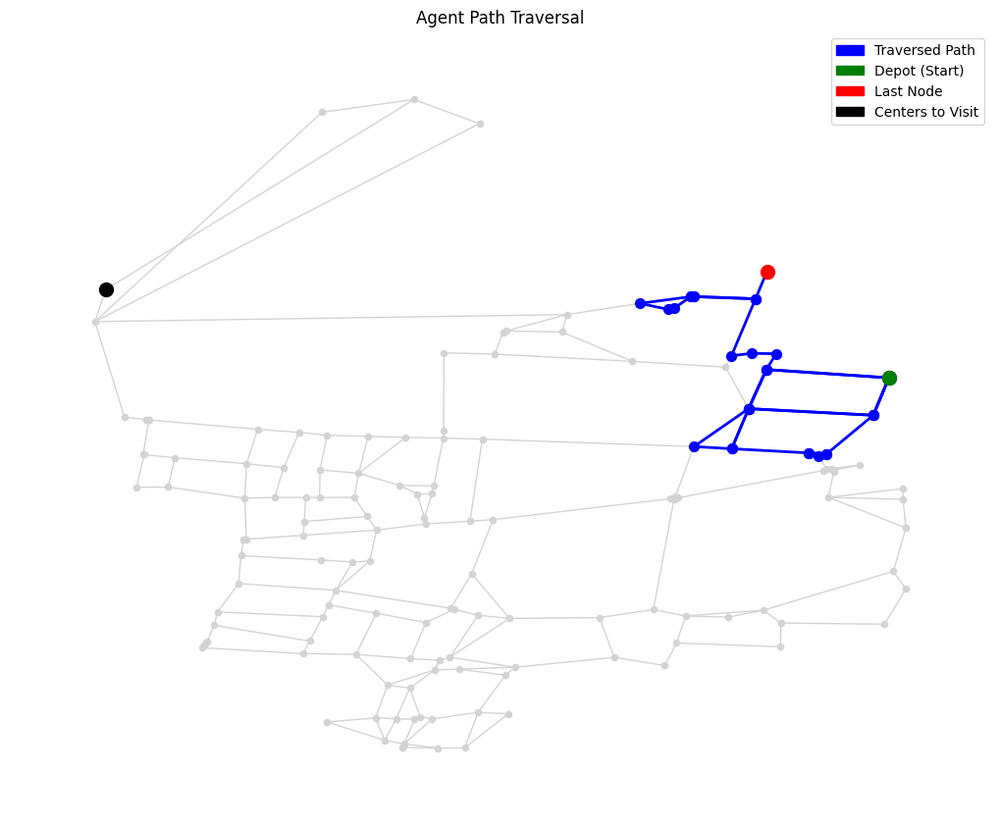

Episode 40, Total reward: -69103.71


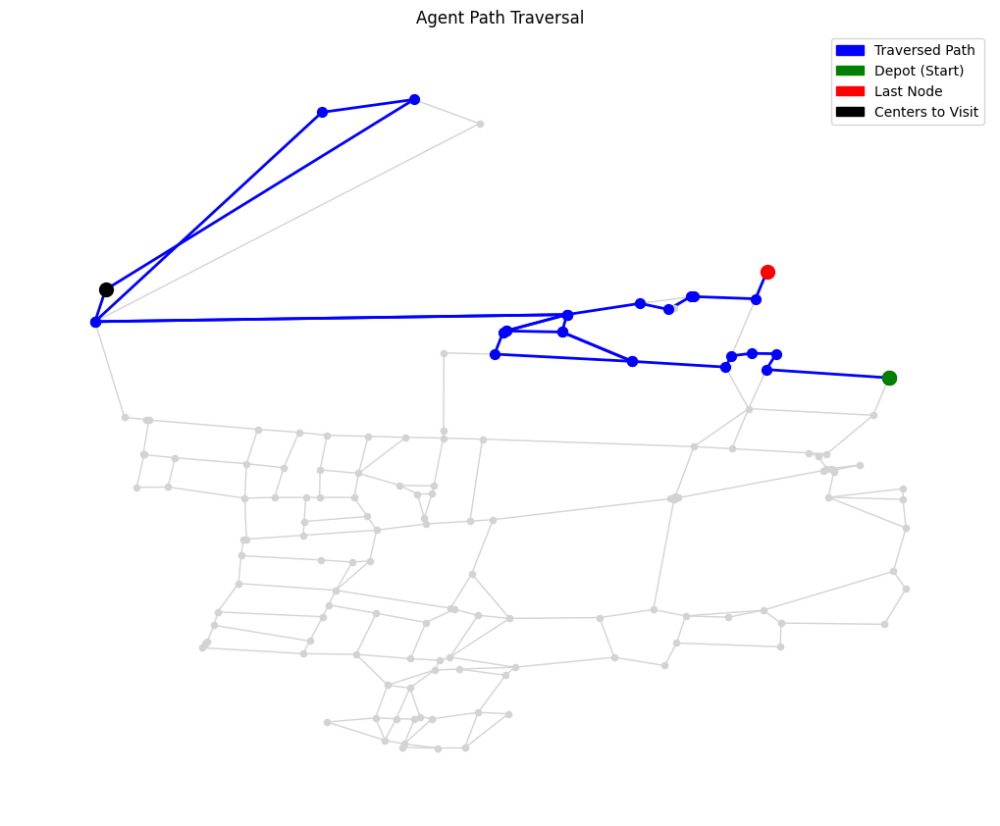

Episode 41, Total reward: -4757.16


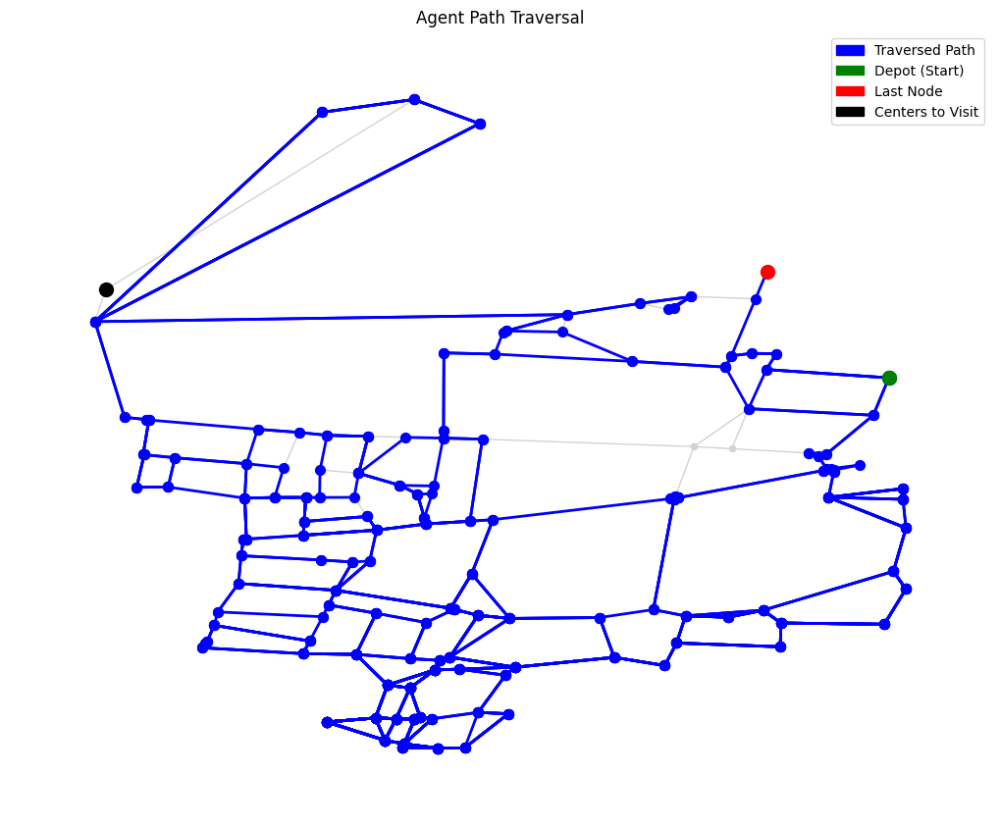

Episode 42, Total reward: -129496342.10


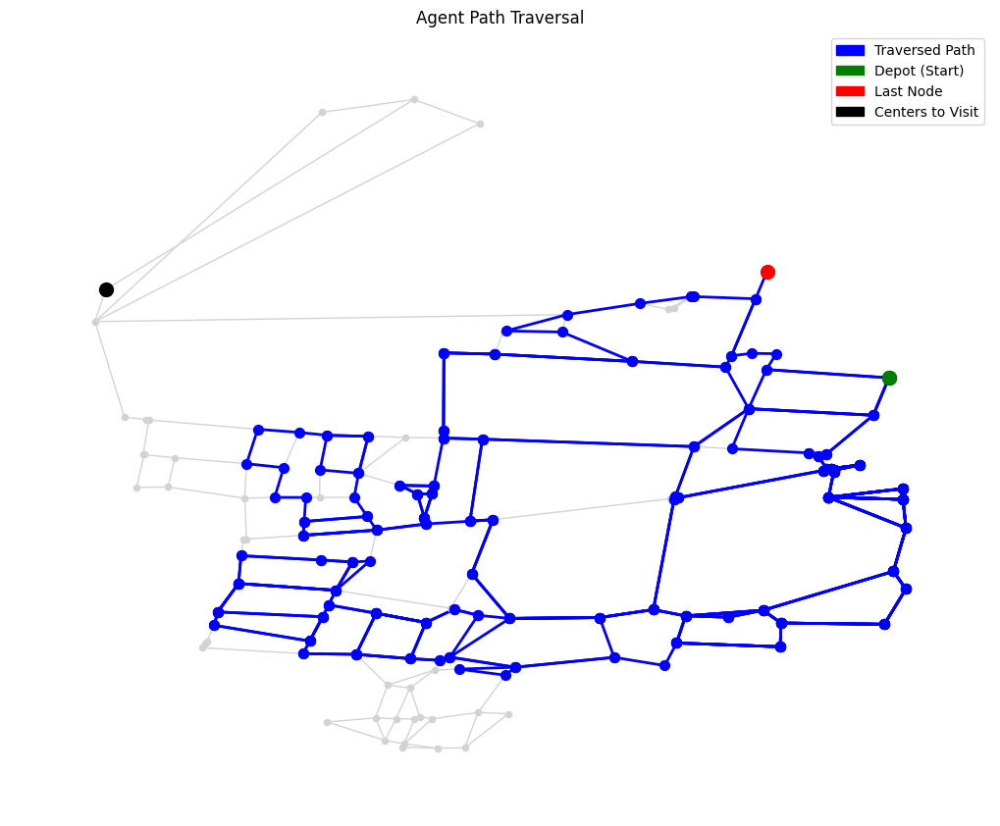

Episode 43, Total reward: -26487333.61


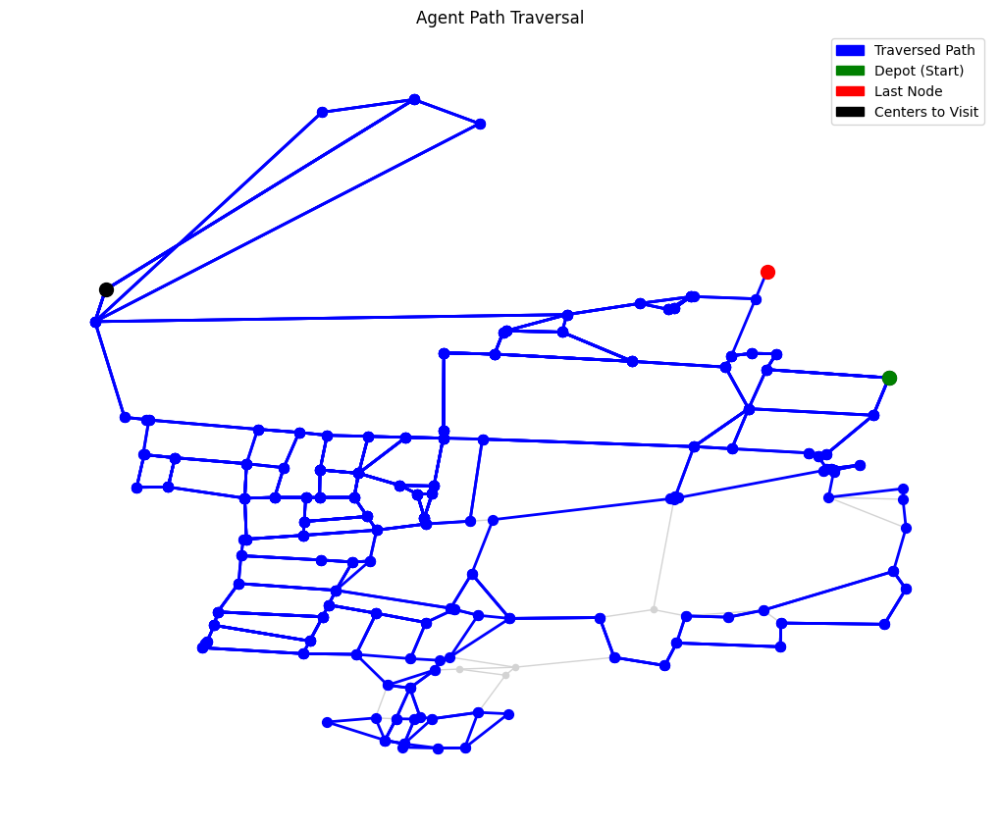

Episode 44, Total reward: -111390477.99


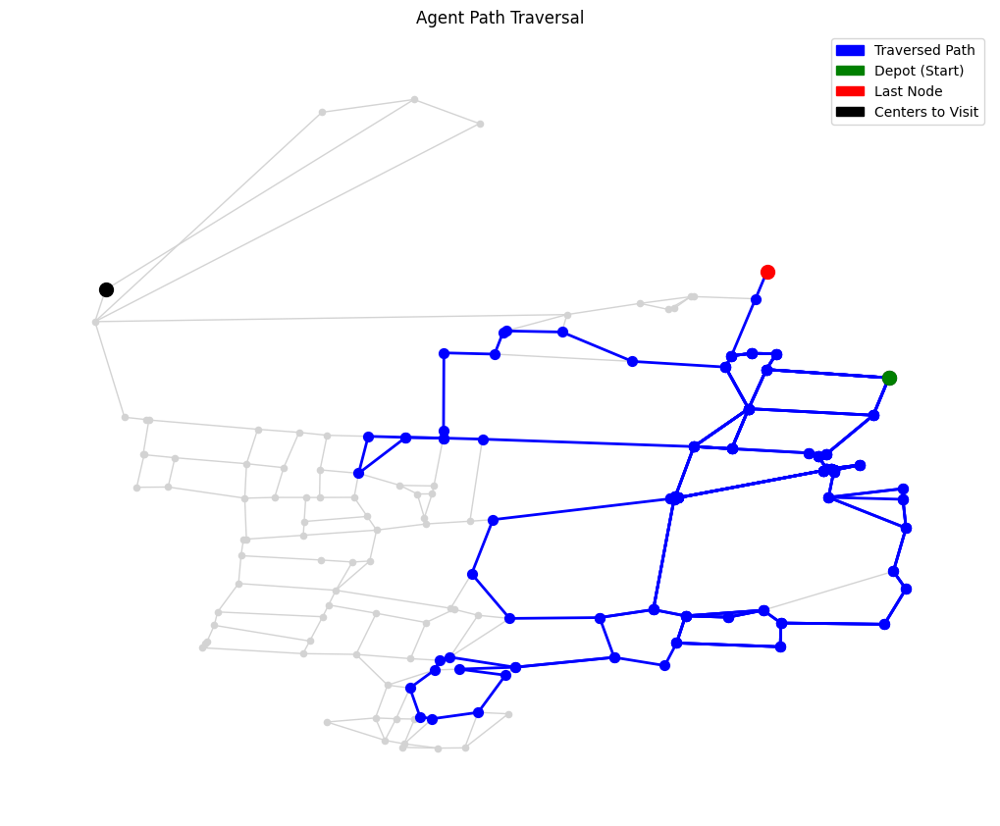

Episode 45, Total reward: -10463863.54


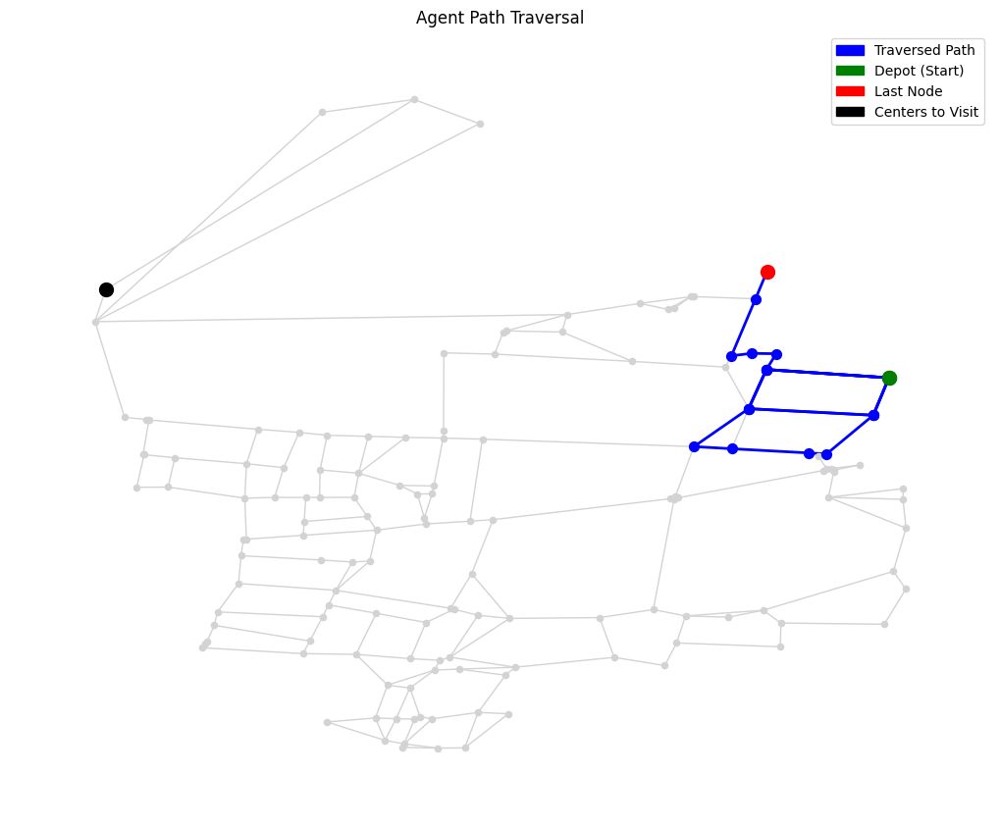

Episode 46, Total reward: -24987.05


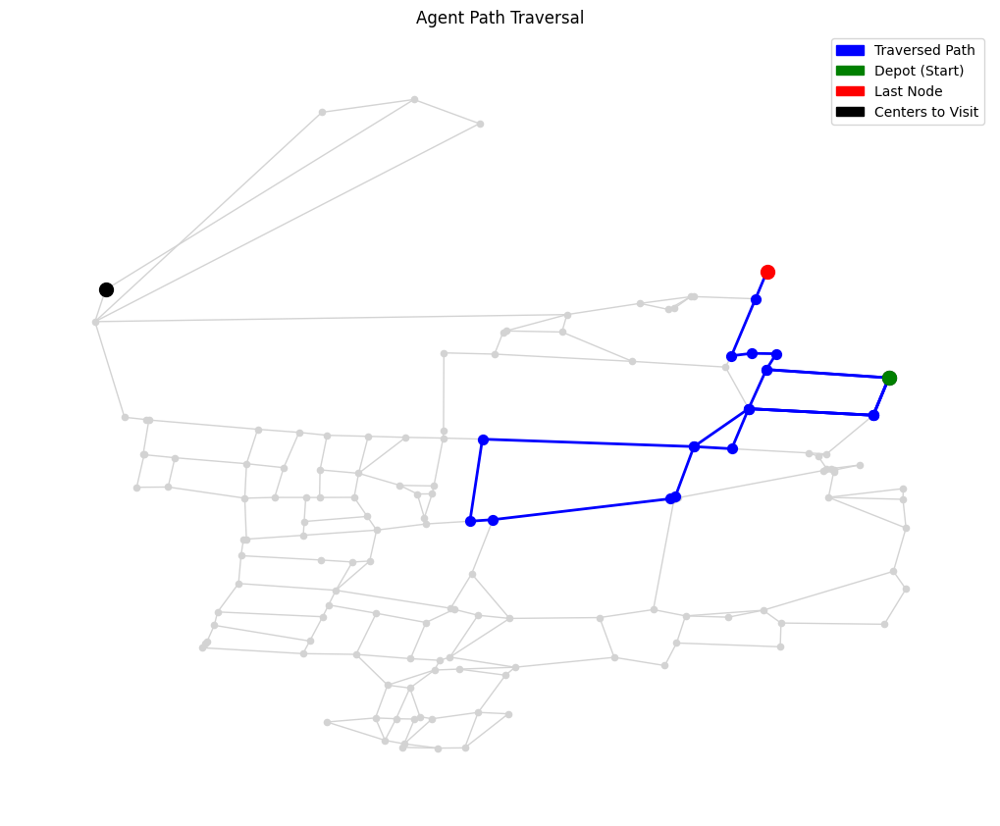

Episode 47, Total reward: -51331.83


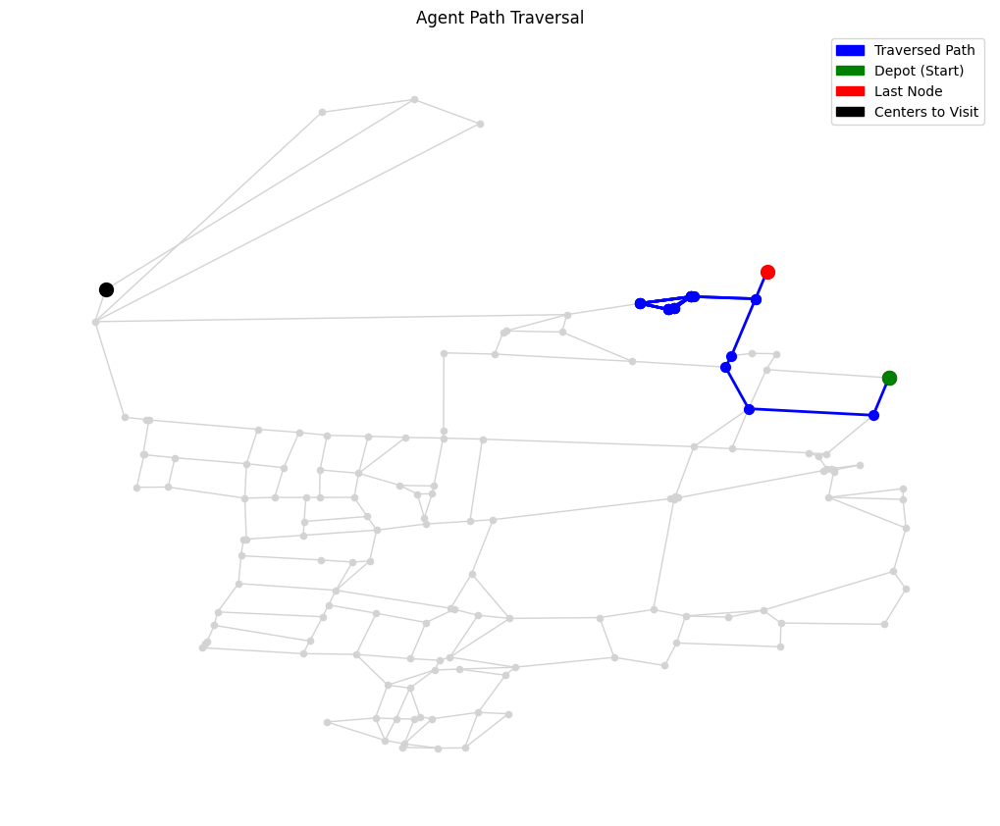

Episode 48, Total reward: -1229.69


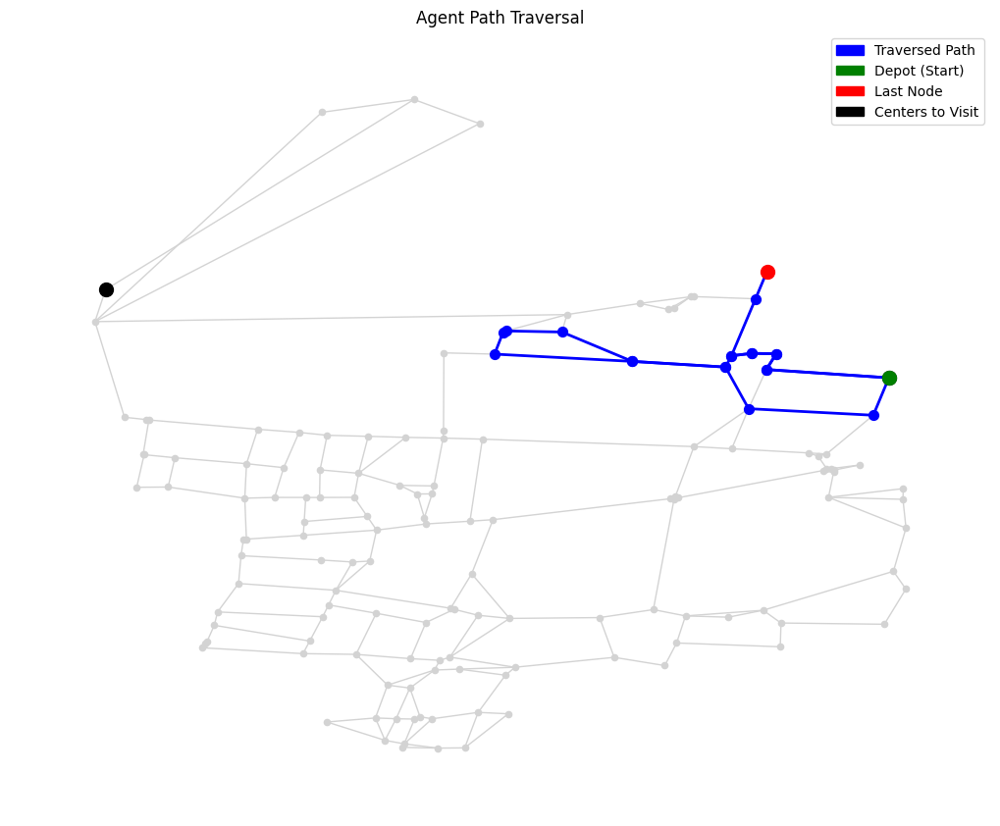

Episode 49, Total reward: -7317.19


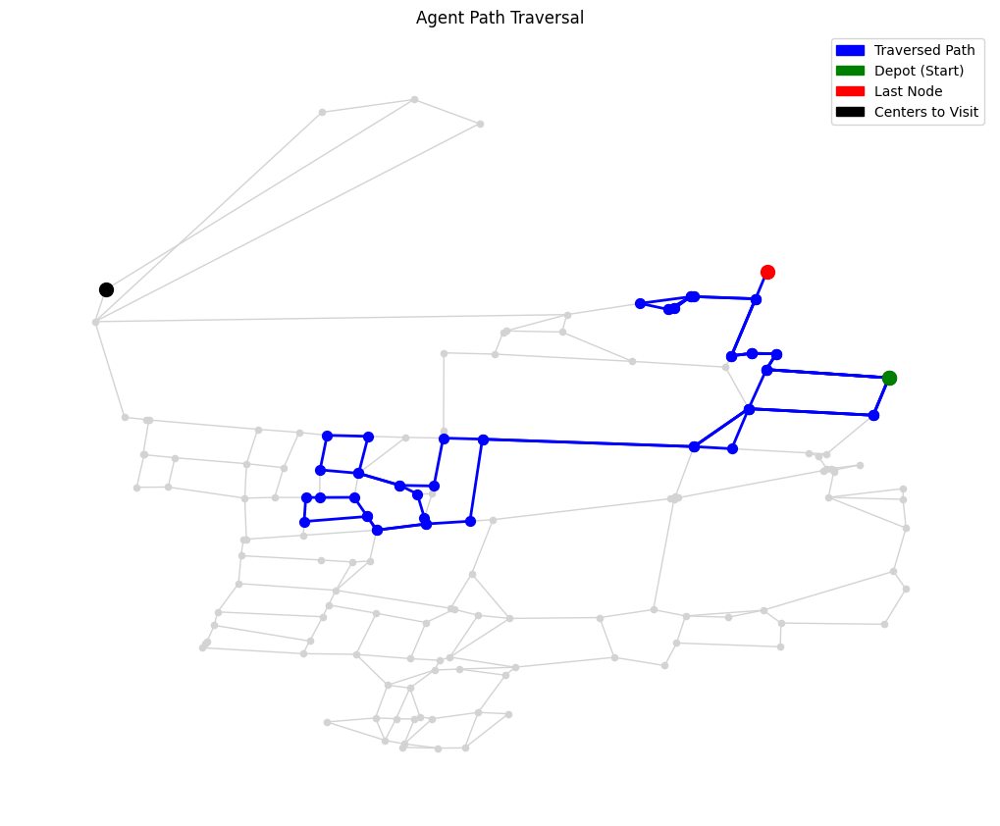

Episode 50, Total reward: -562255.20


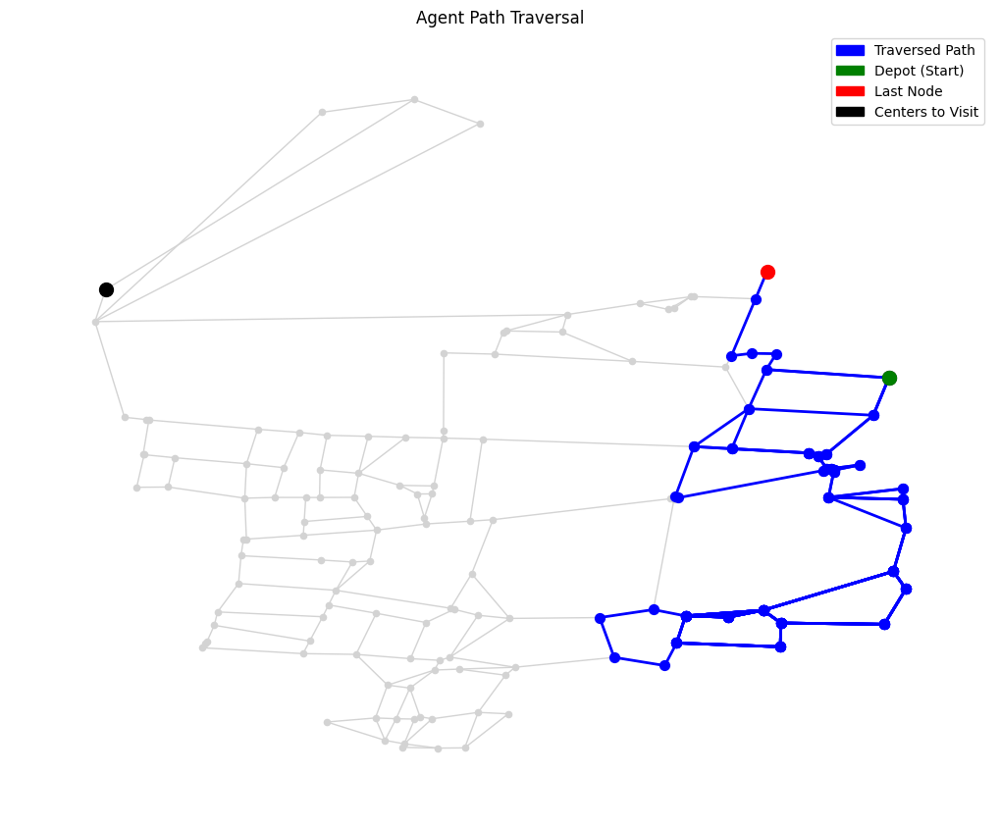

Episode 51, Total reward: -4337733.97


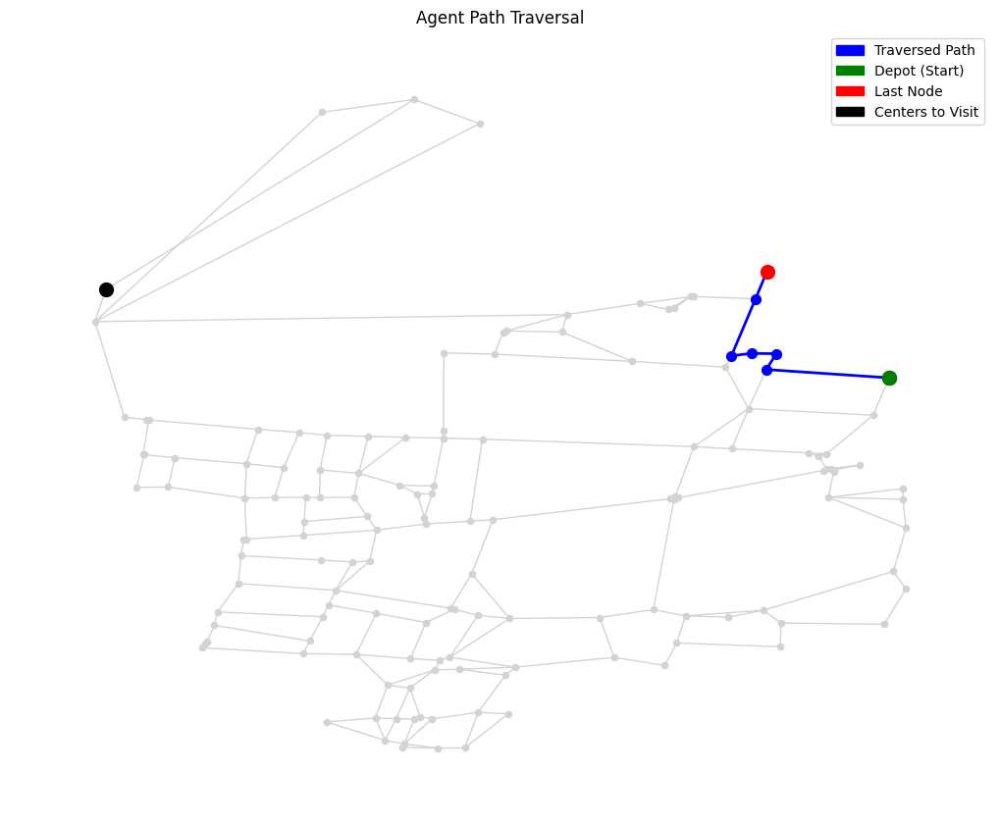

Episode 52, Total reward: 0.00


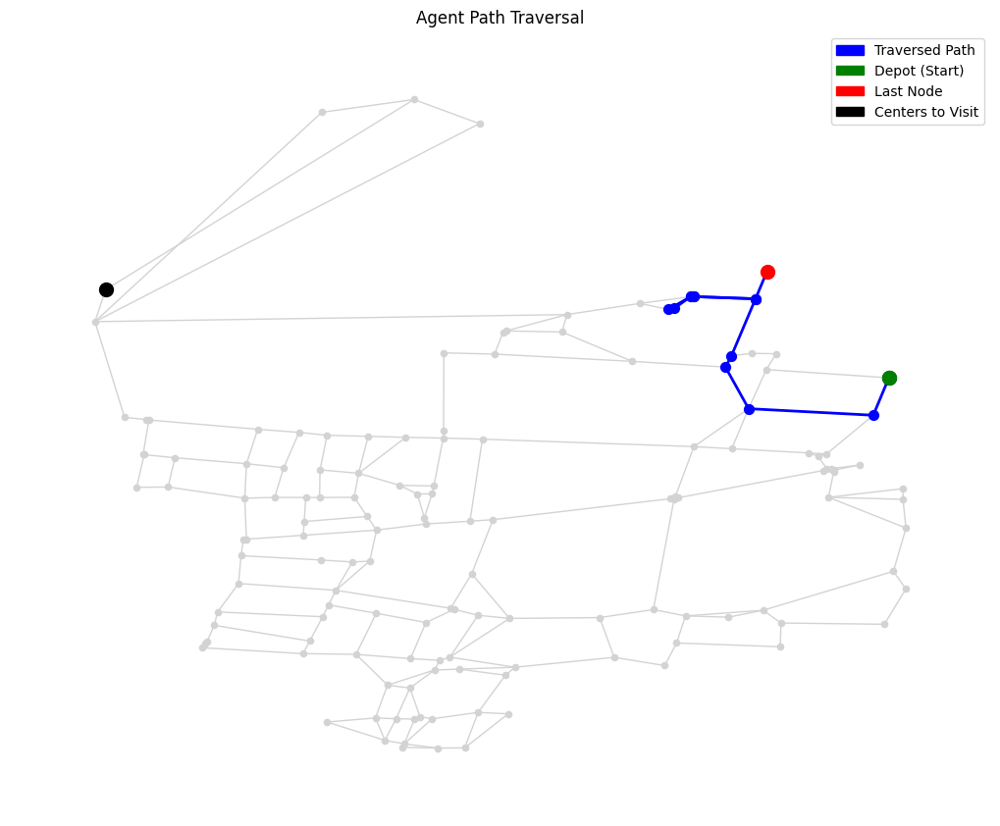

Episode 53, Total reward: -15.00


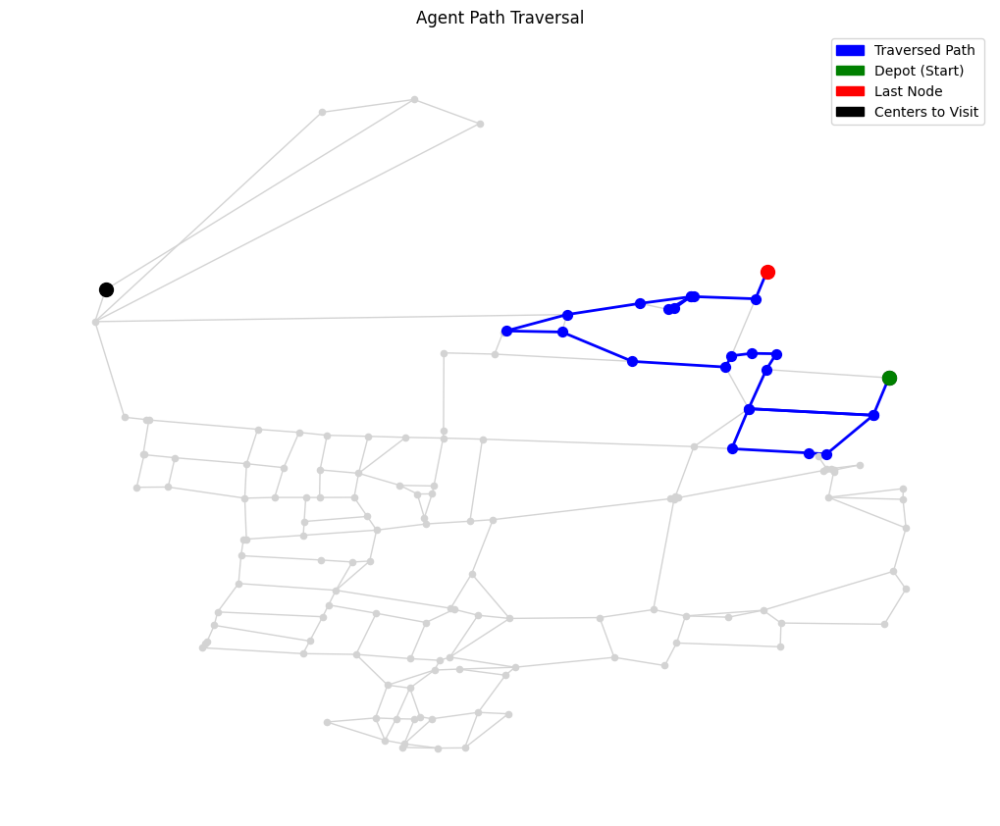

Episode 54, Total reward: -5967.95


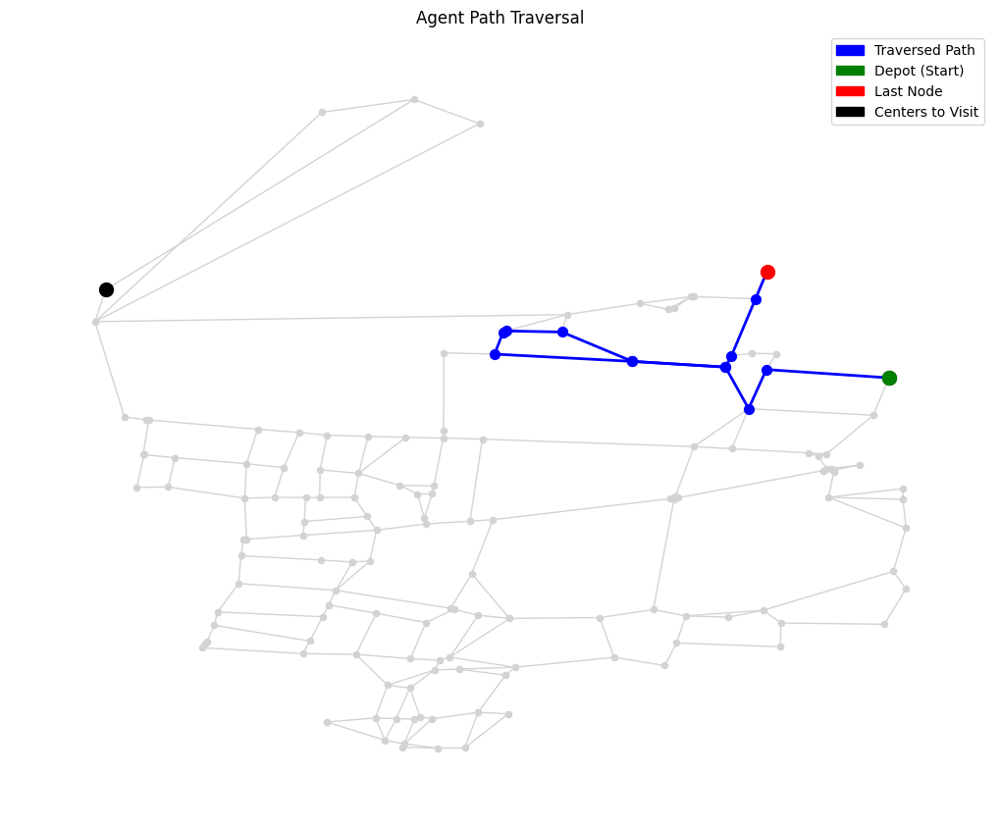

Episode 55, Total reward: -1570.17


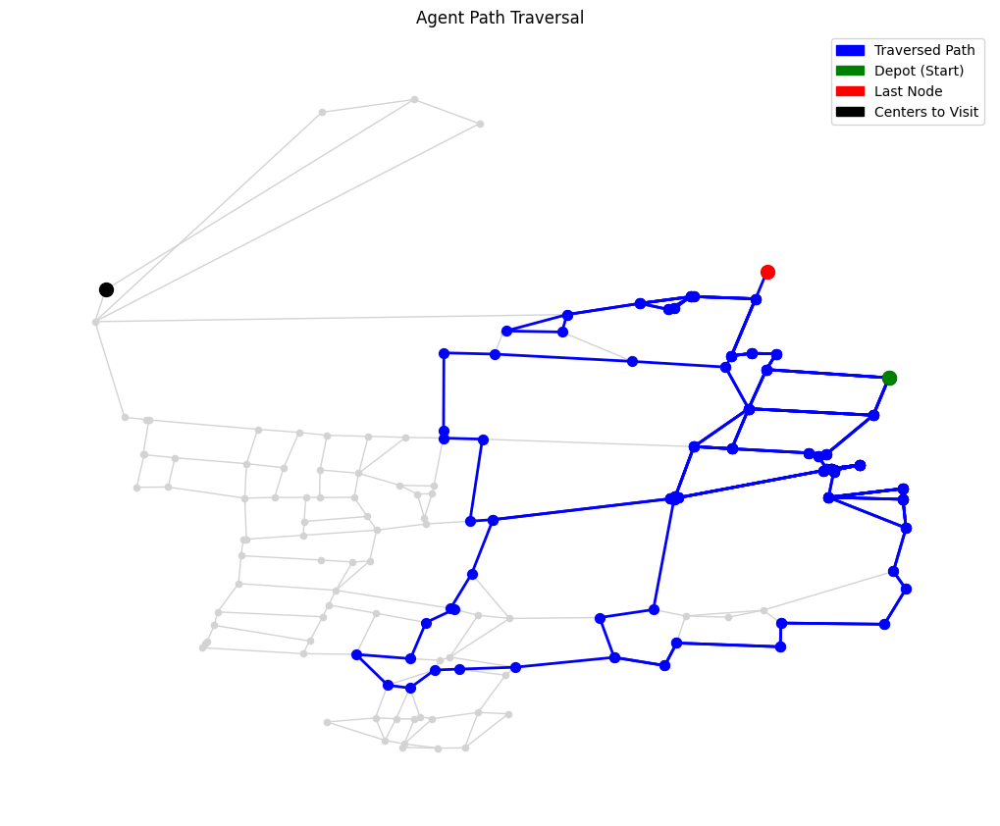

Episode 56, Total reward: -7744942.29


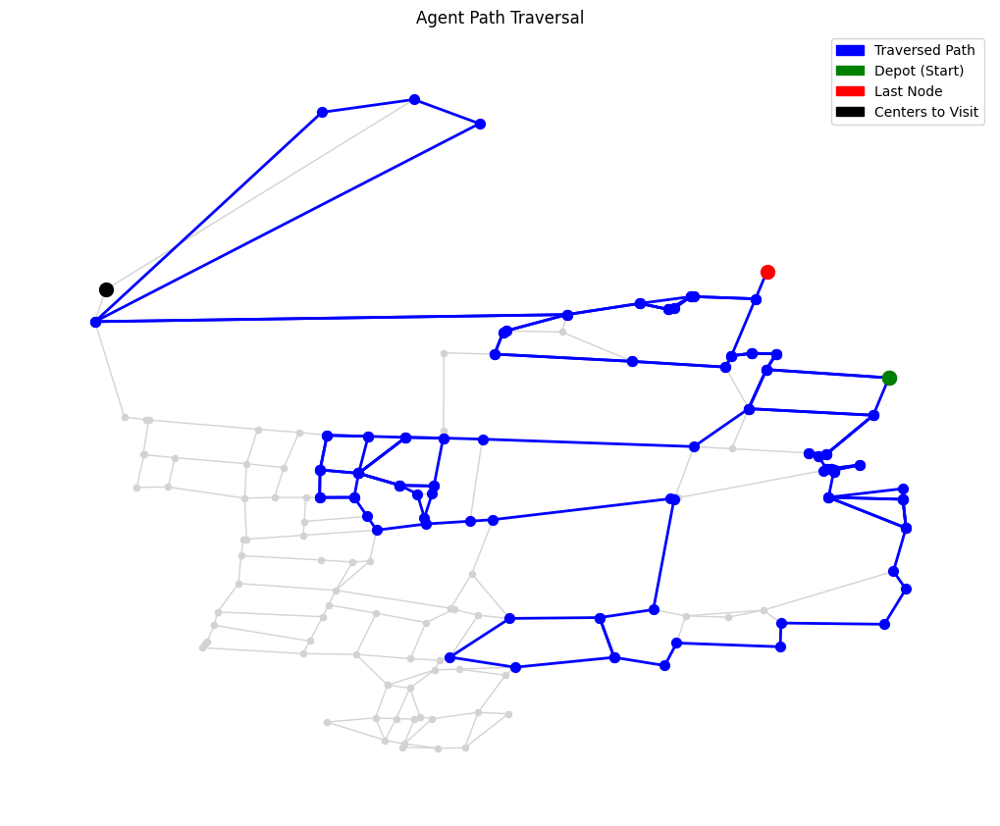

Episode 57, Total reward: -4027738.83


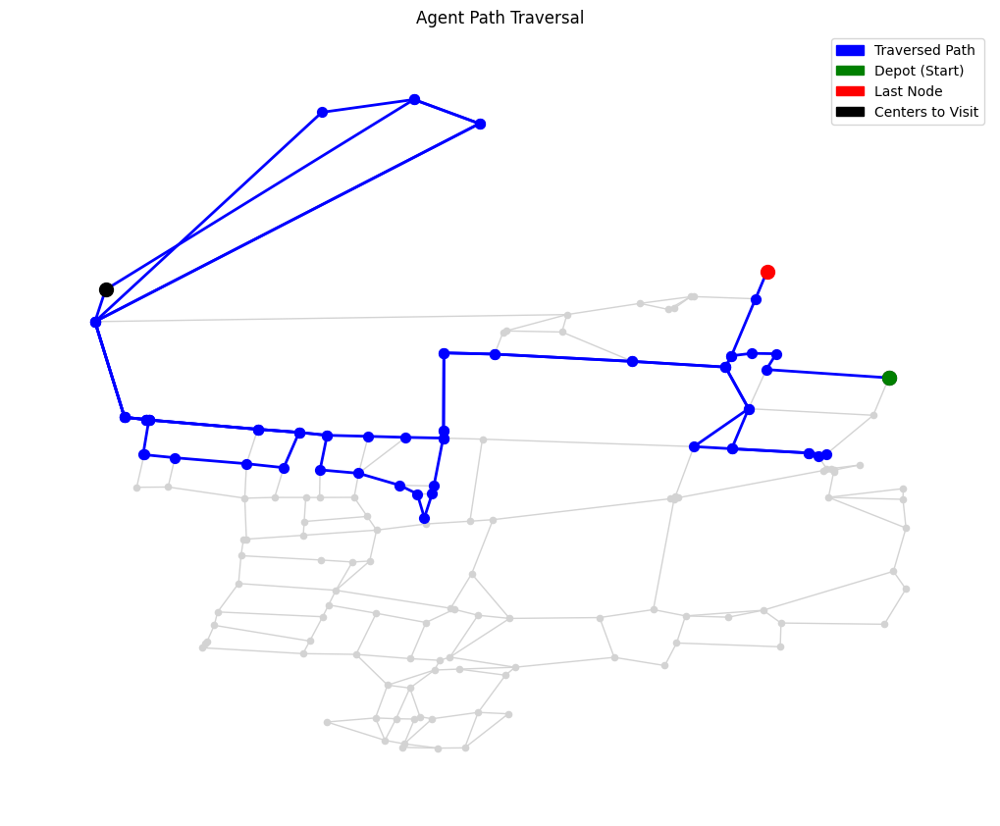

Episode 58, Total reward: -3140102.11


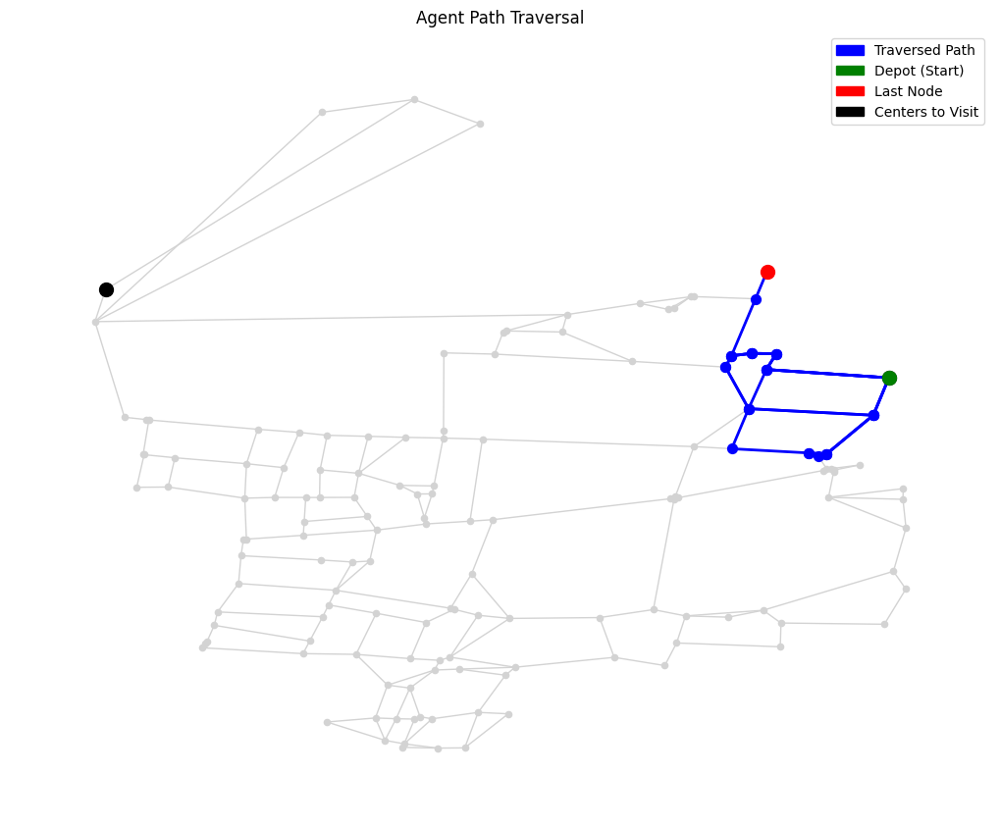

Episode 59, Total reward: -115056.22


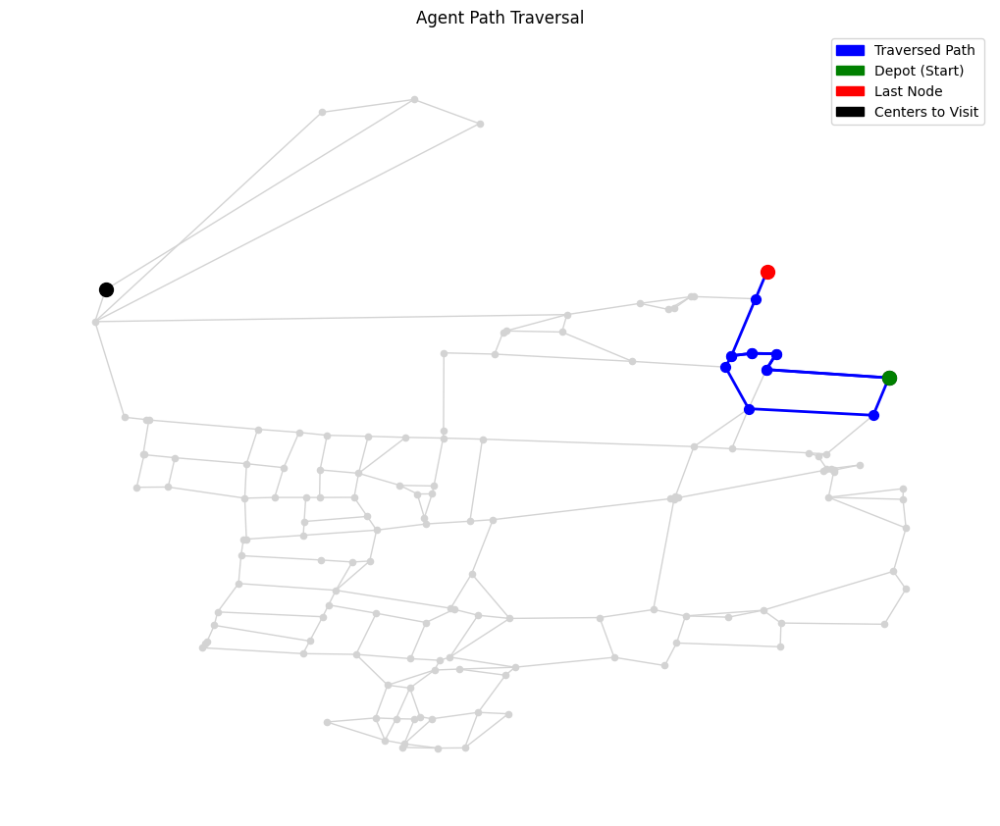

Episode 60, Total reward: -988.67


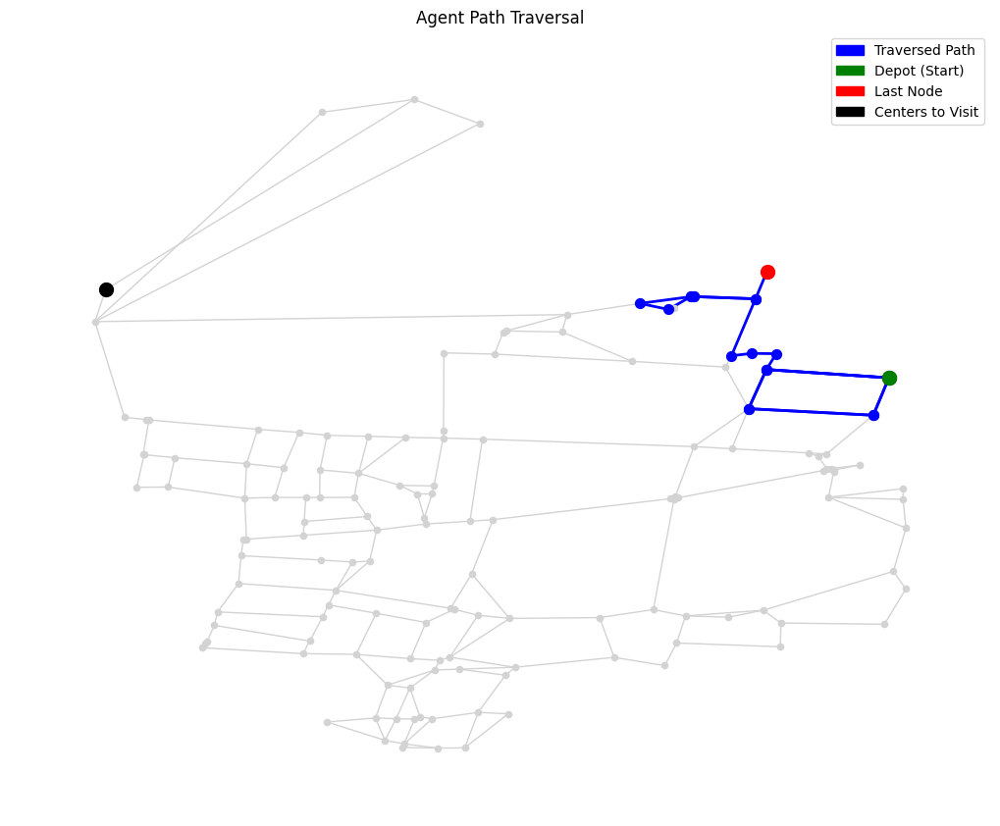

Episode 61, Total reward: -3596.80


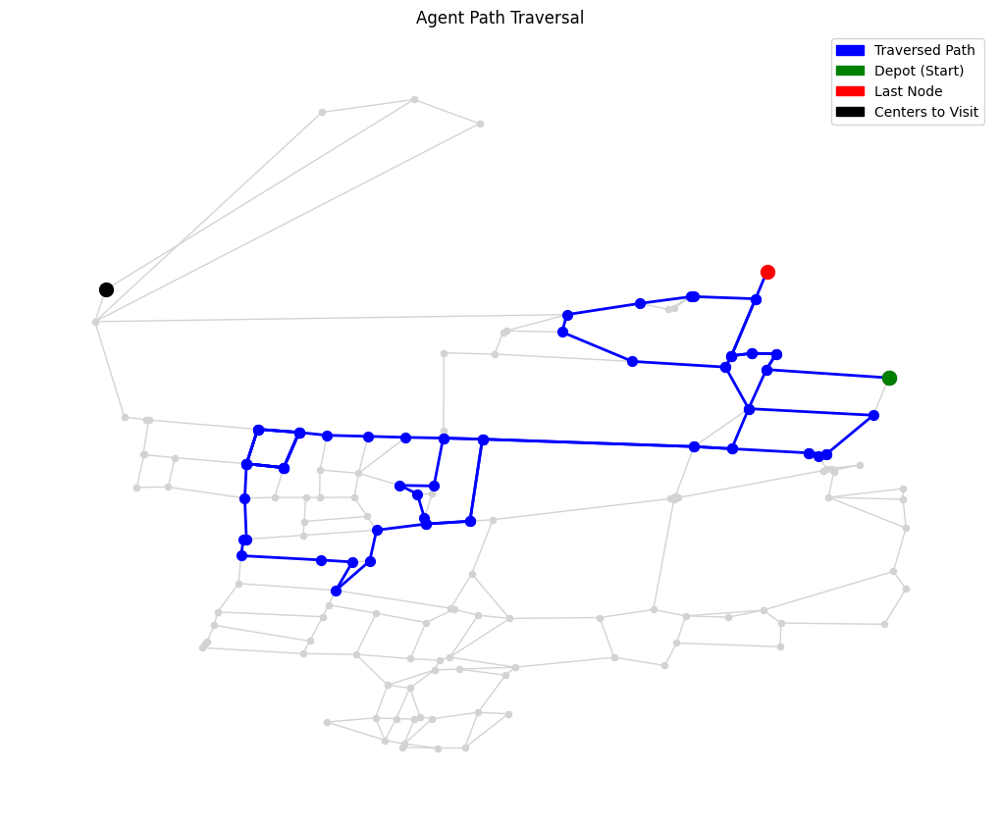

Episode 62, Total reward: -1264868.33


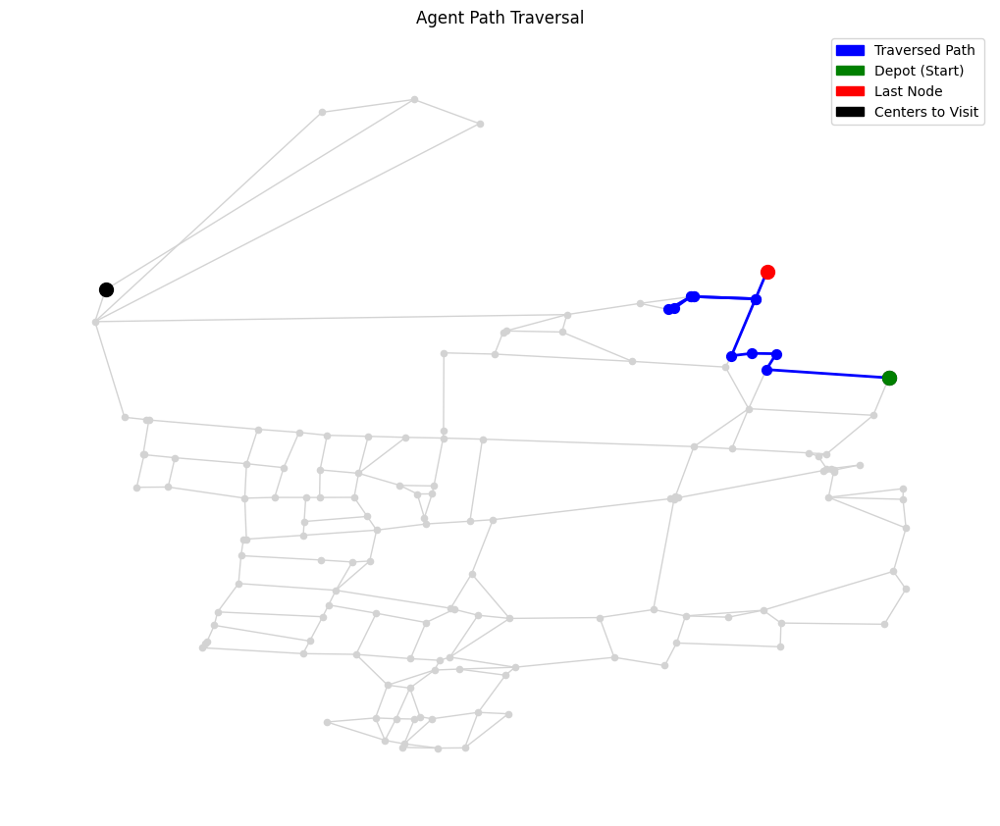

Episode 63, Total reward: -15.00


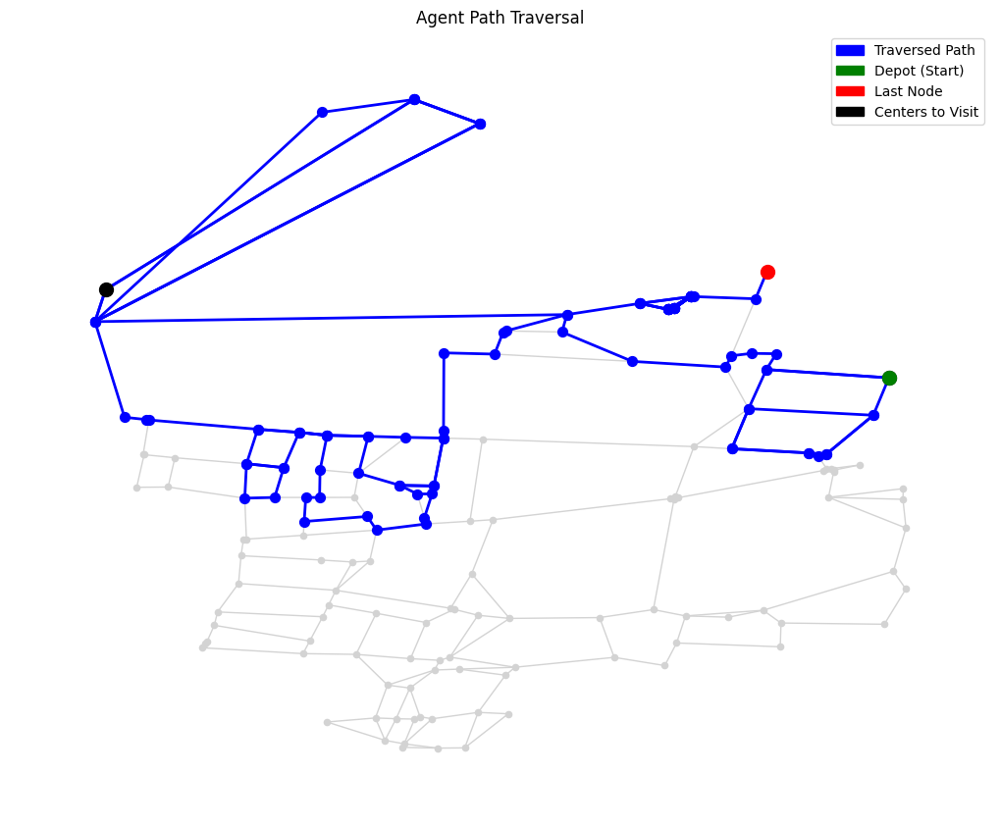

Episode 64, Total reward: -3830744.22


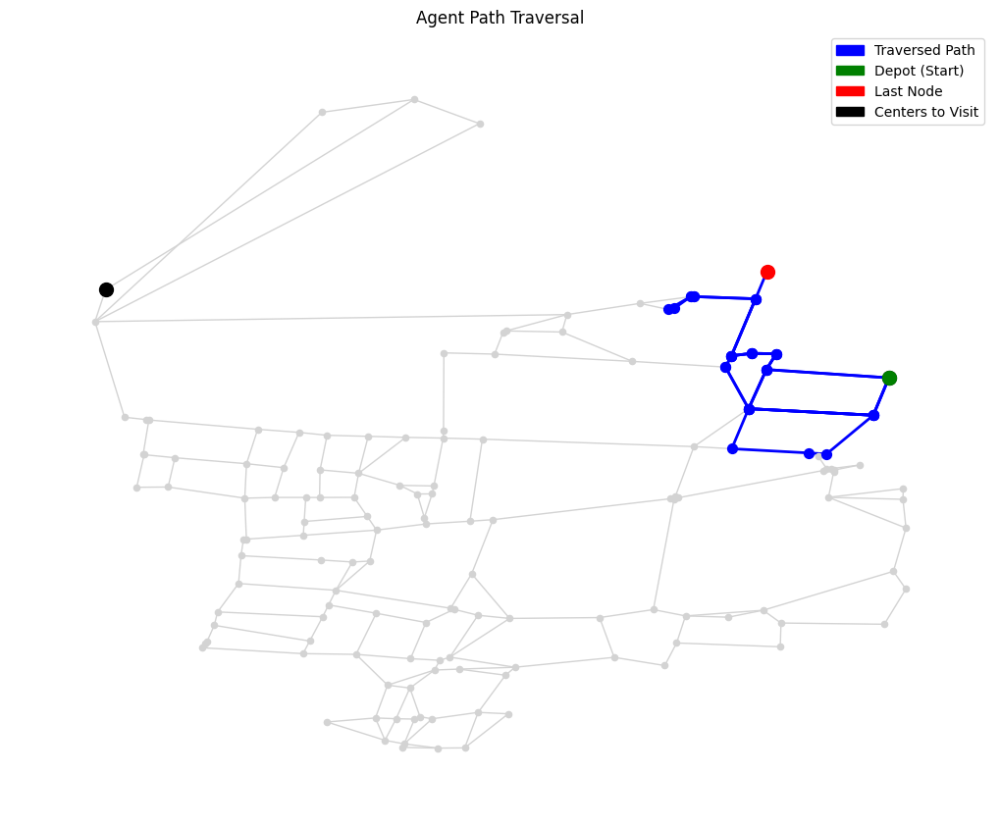

Episode 65, Total reward: -152518.39


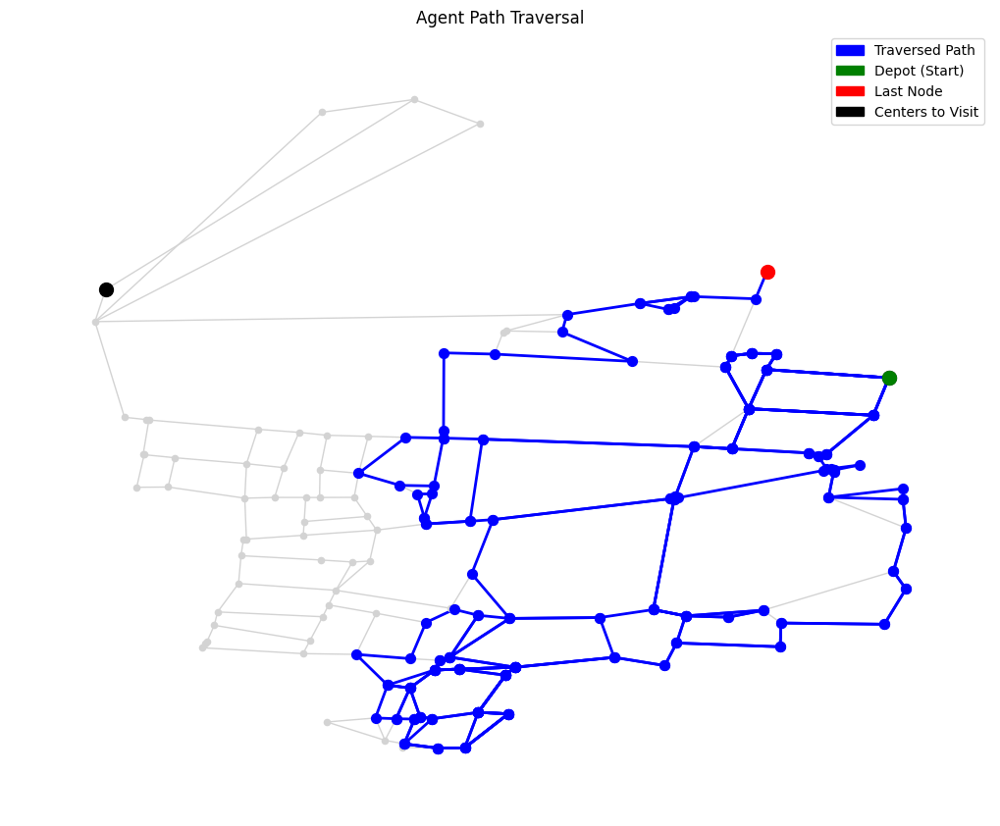

Episode 66, Total reward: -12001468.64


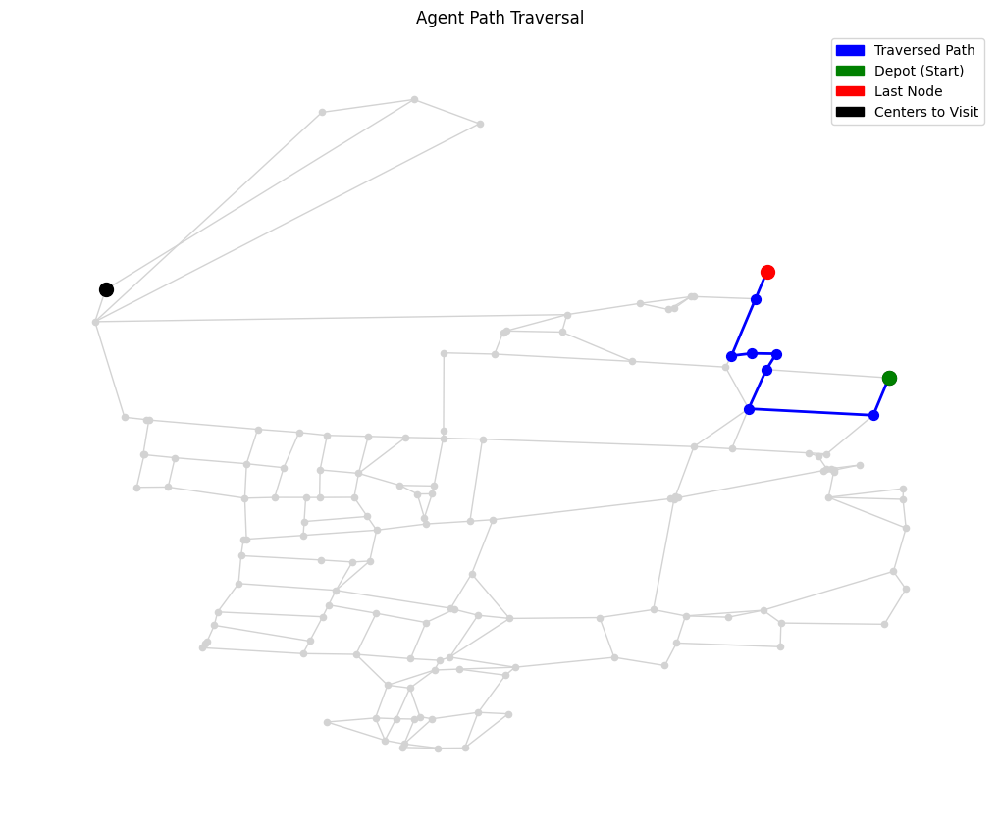

Episode 67, Total reward: 0.00


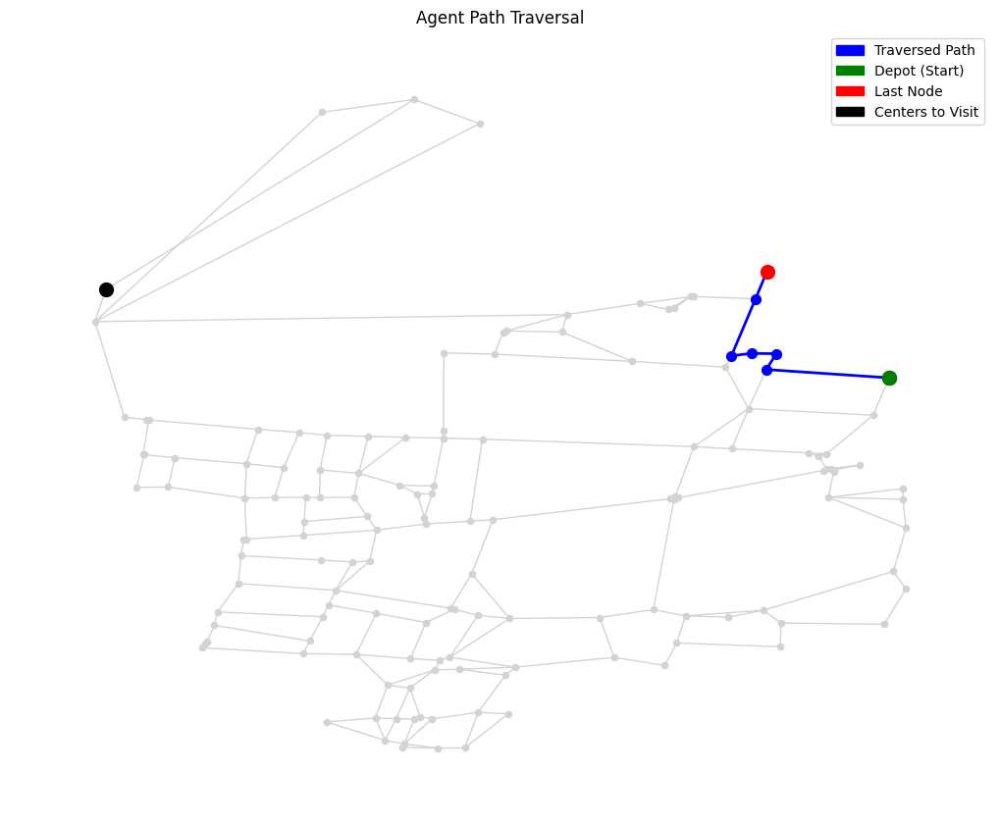

Episode 68, Total reward: 0.00


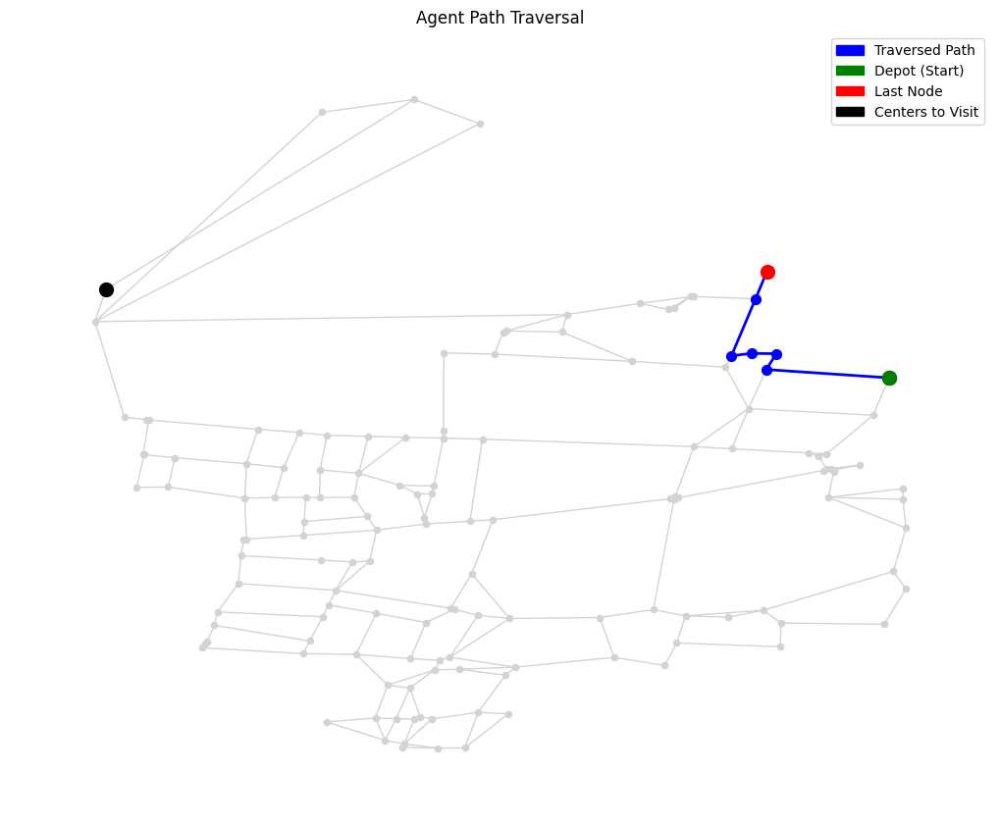

Episode 69, Total reward: 0.00


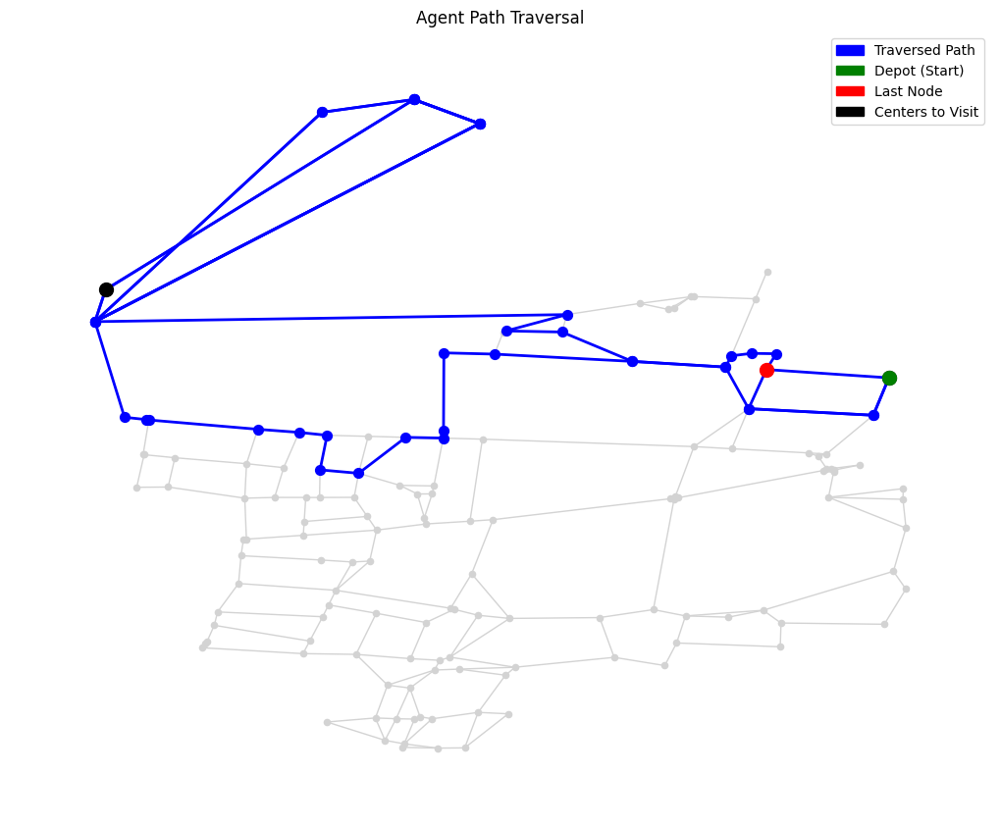

Episode 70, Total reward: -1092999.46


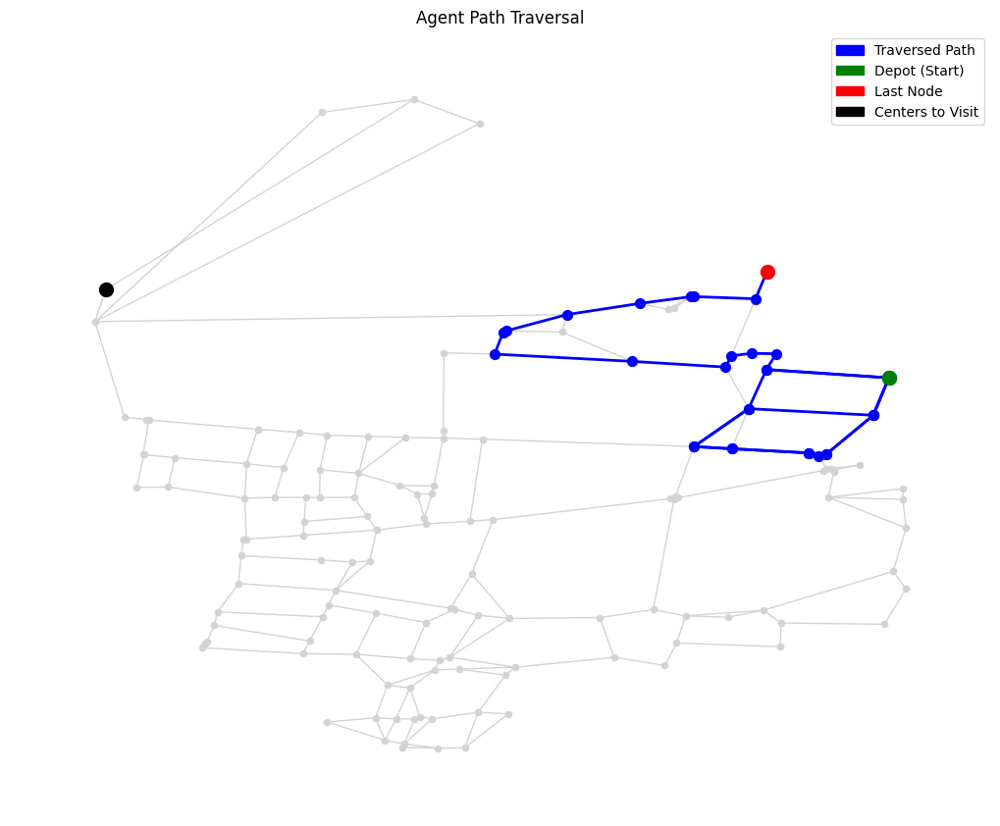

Episode 71, Total reward: -72235.34


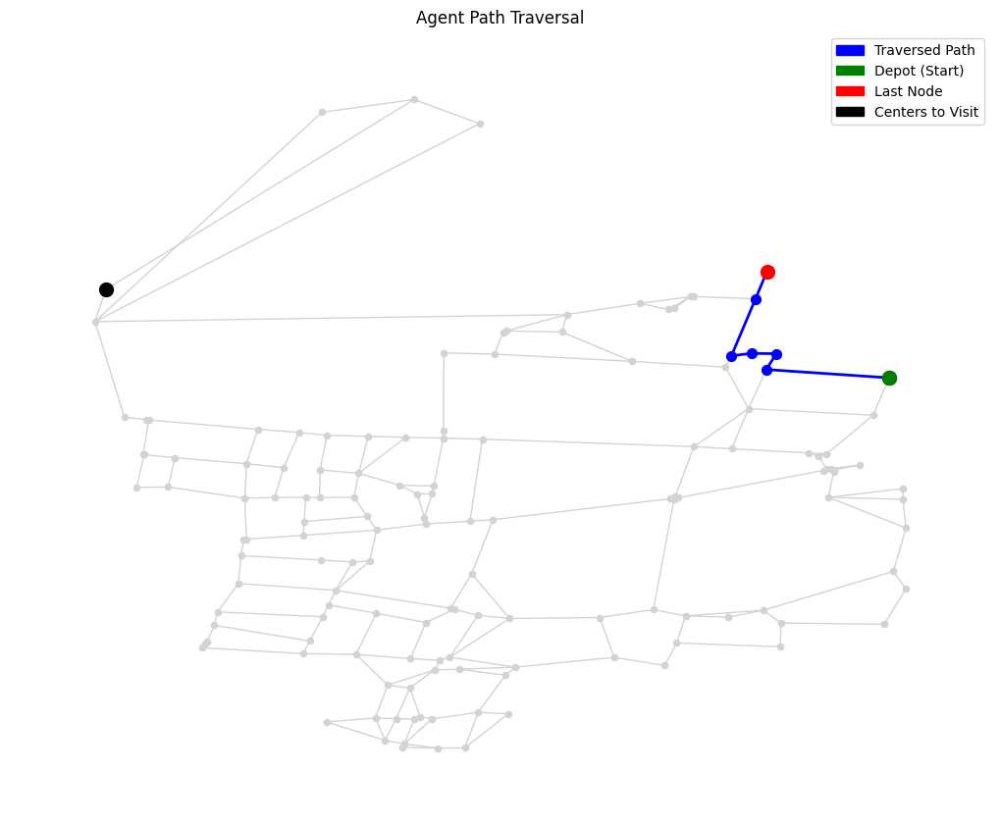

Episode 72, Total reward: 0.00


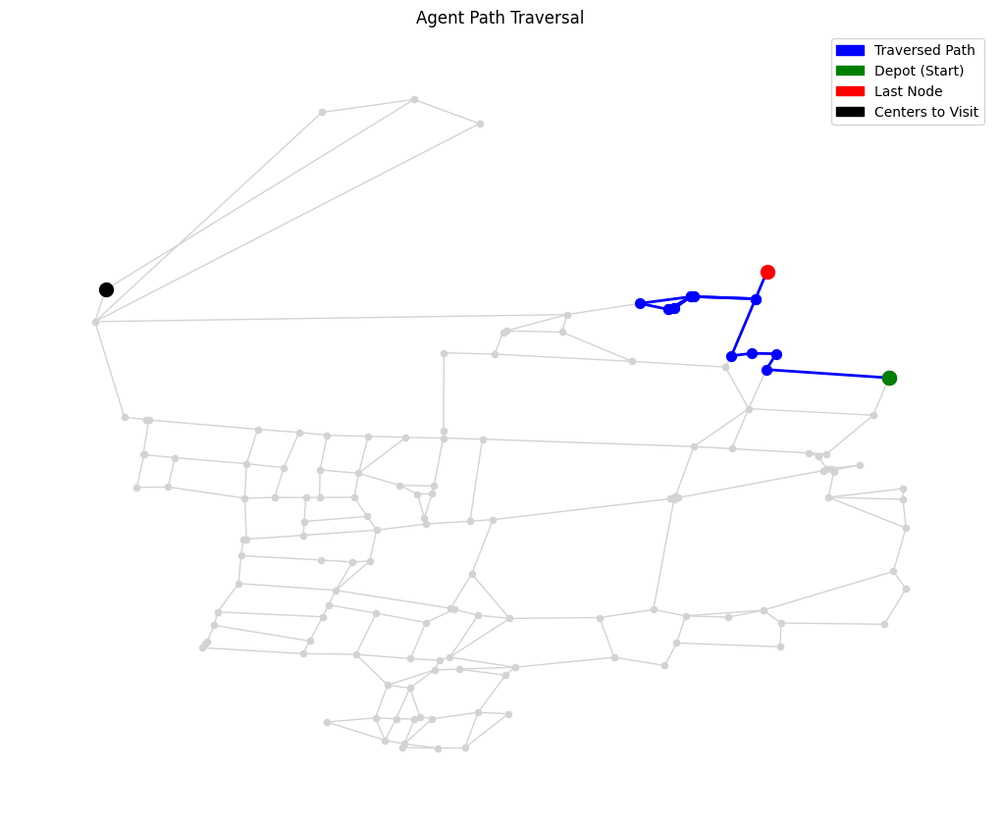

Episode 73, Total reward: -30.00


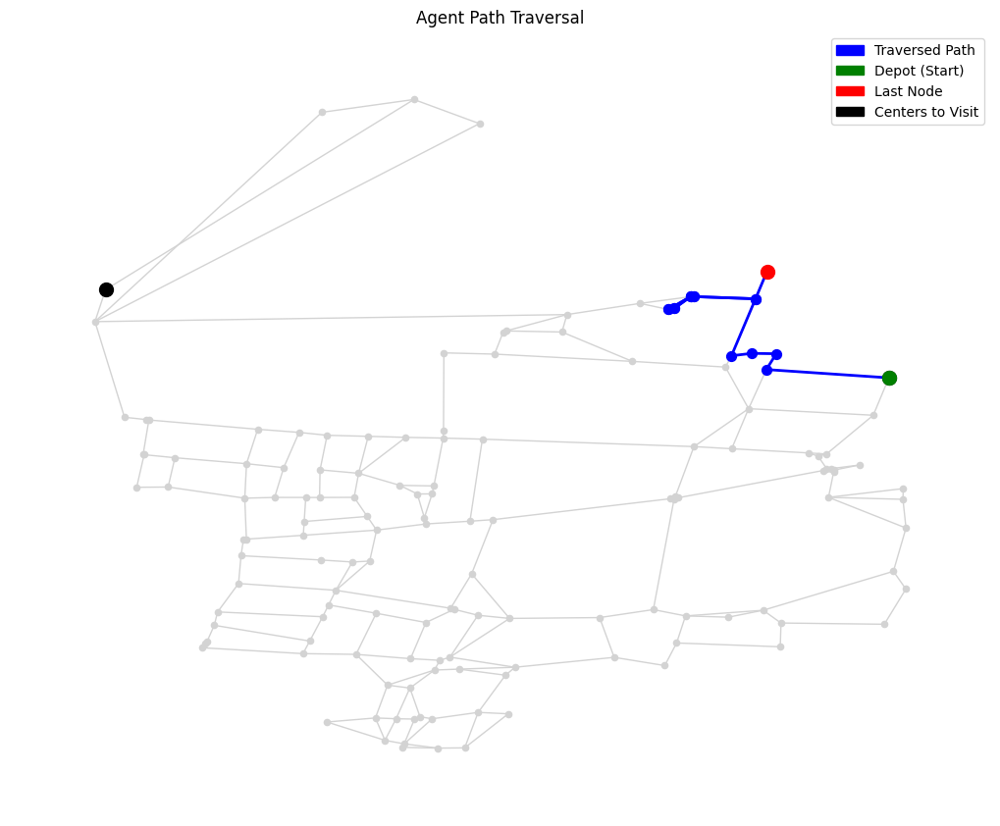

Episode 74, Total reward: -30.00


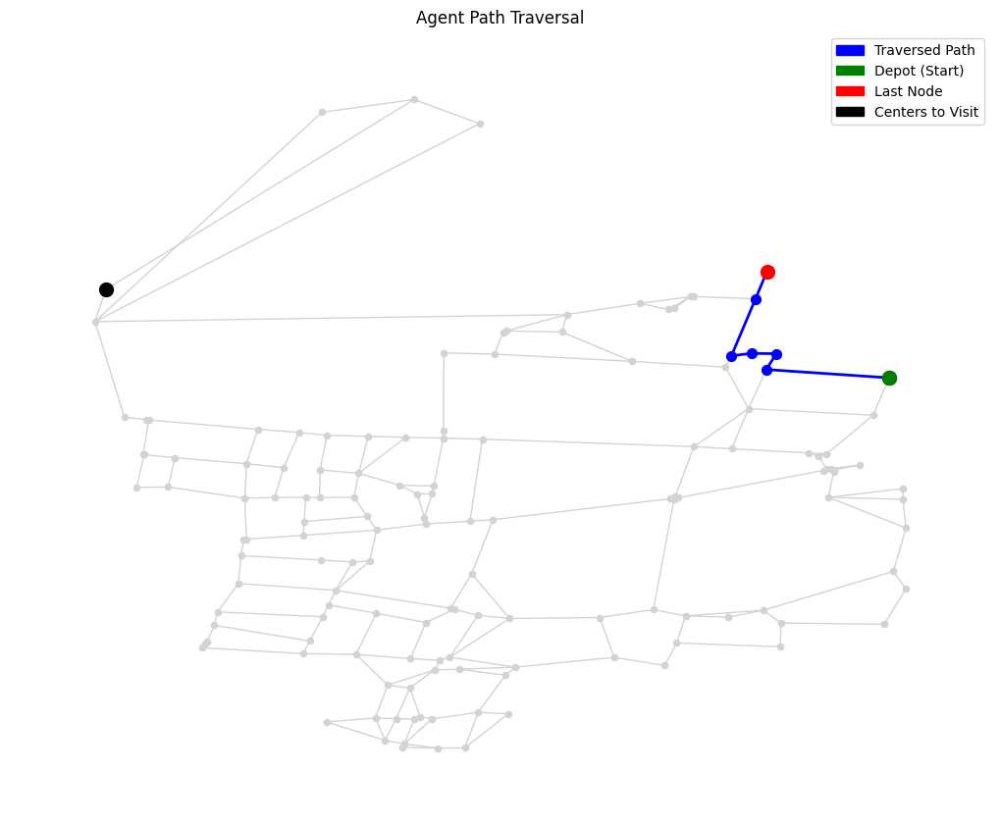

Episode 75, Total reward: 0.00


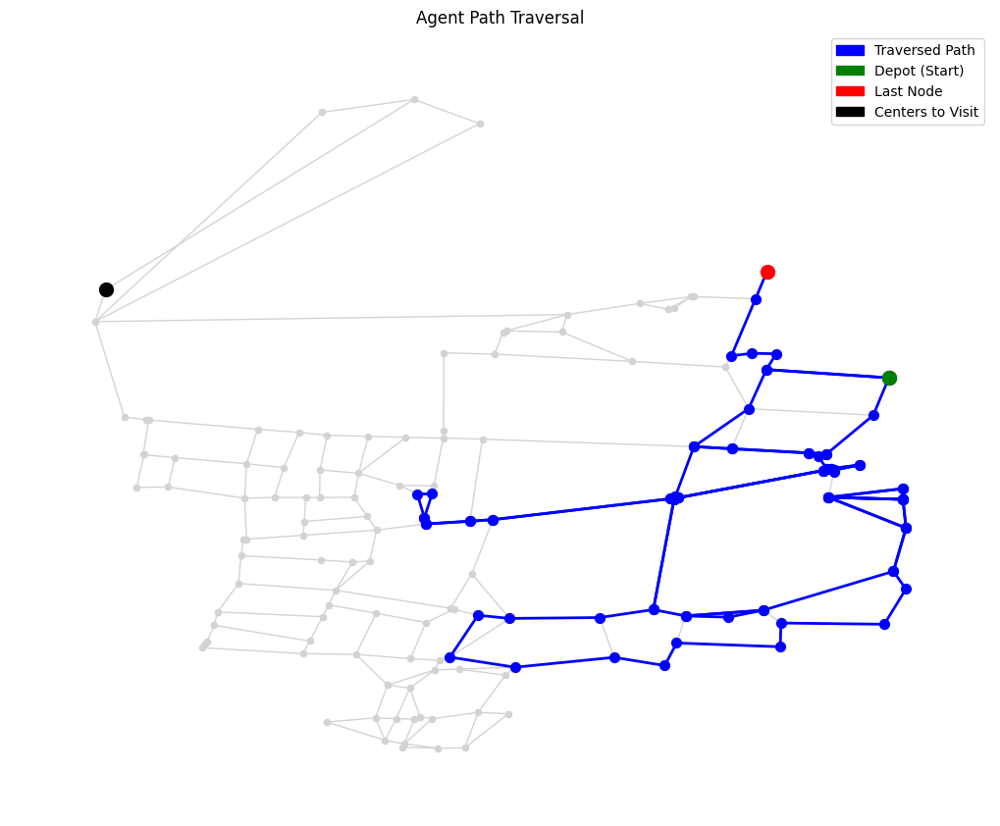

Episode 76, Total reward: -1252265.47


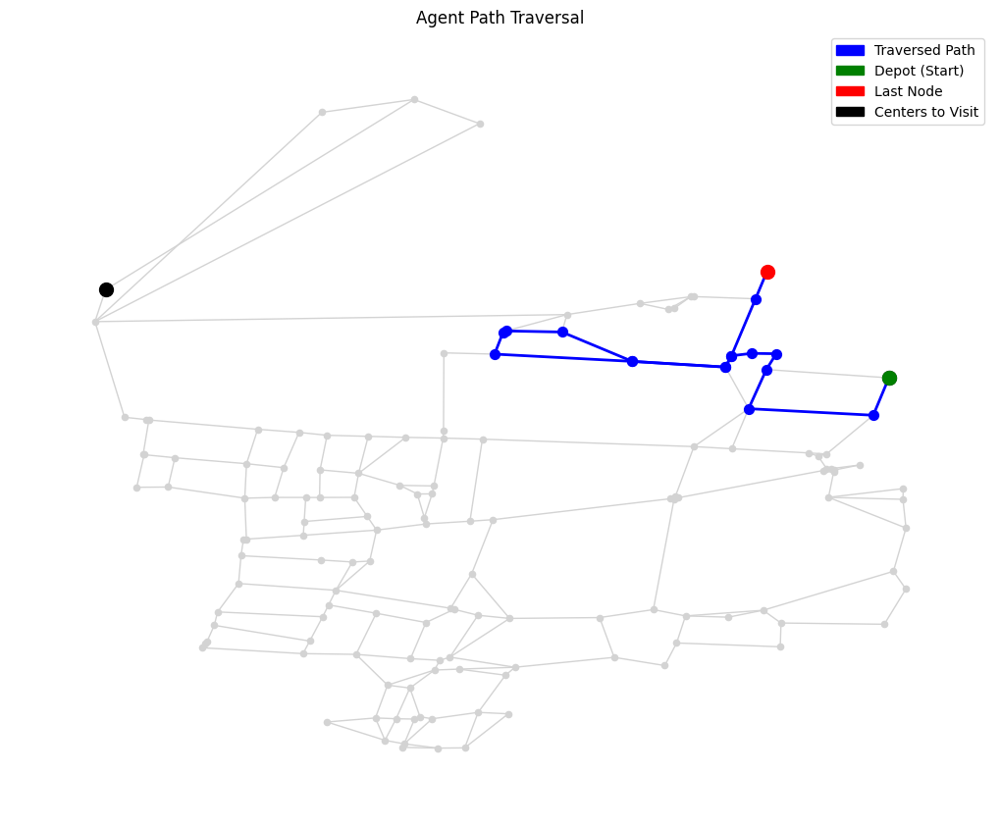

Episode 77, Total reward: -2970.87


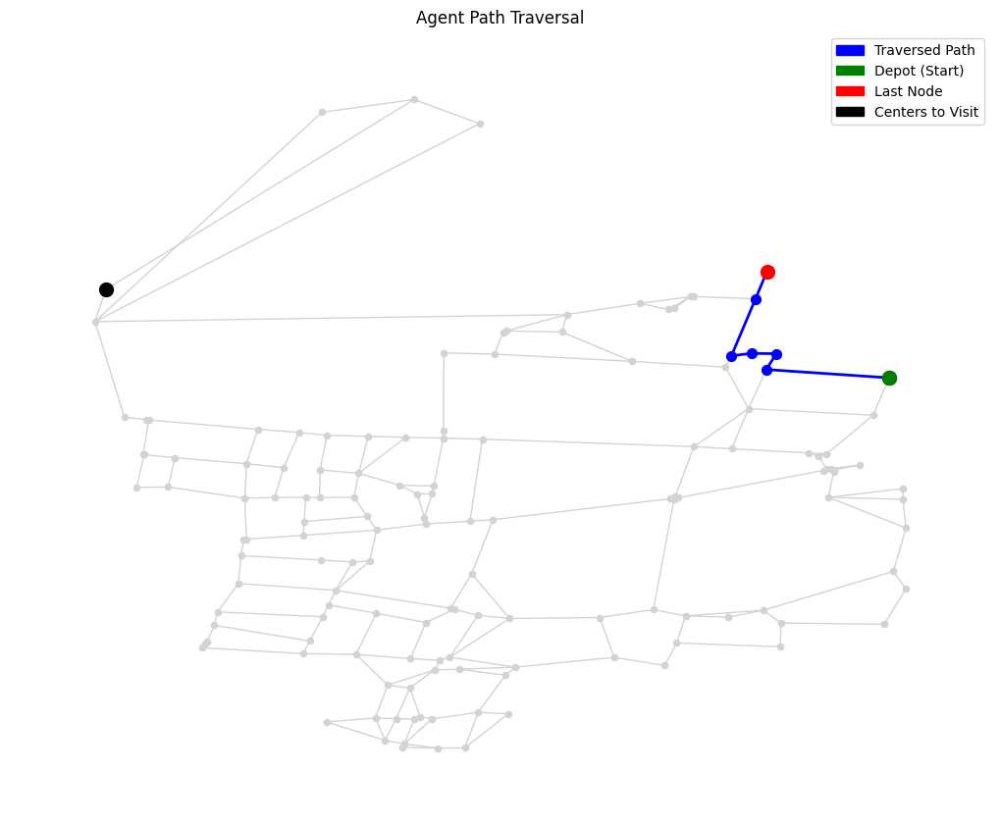

Episode 78, Total reward: 0.00


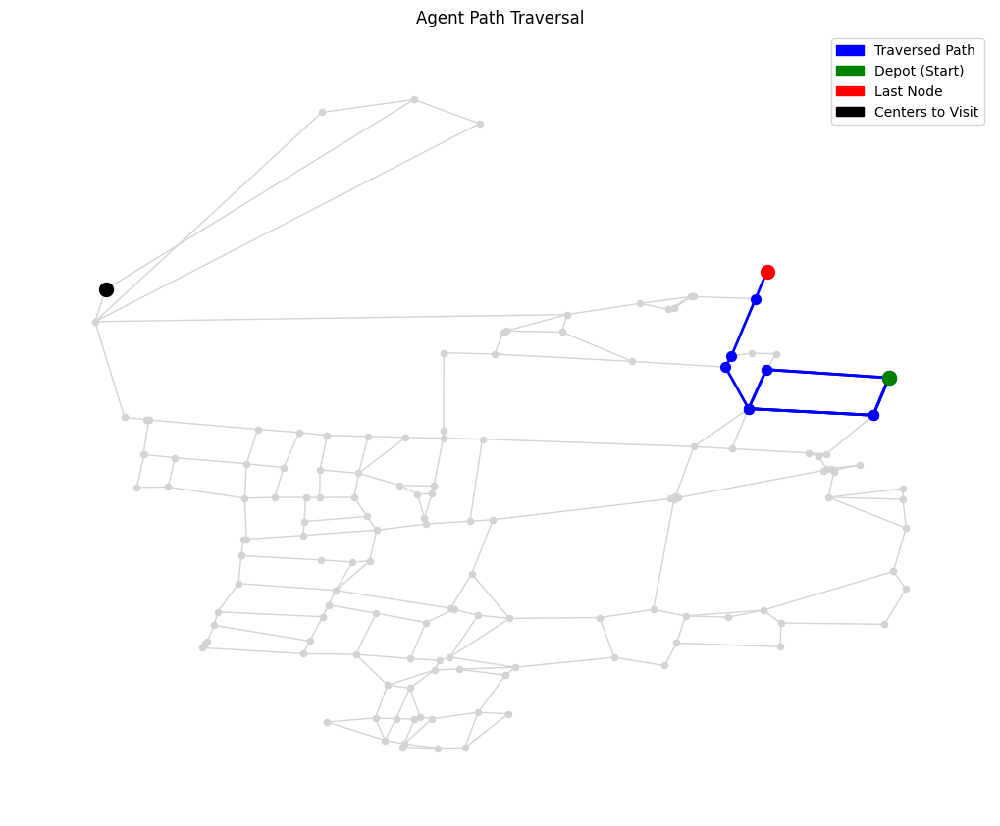

Episode 79, Total reward: -6023.96


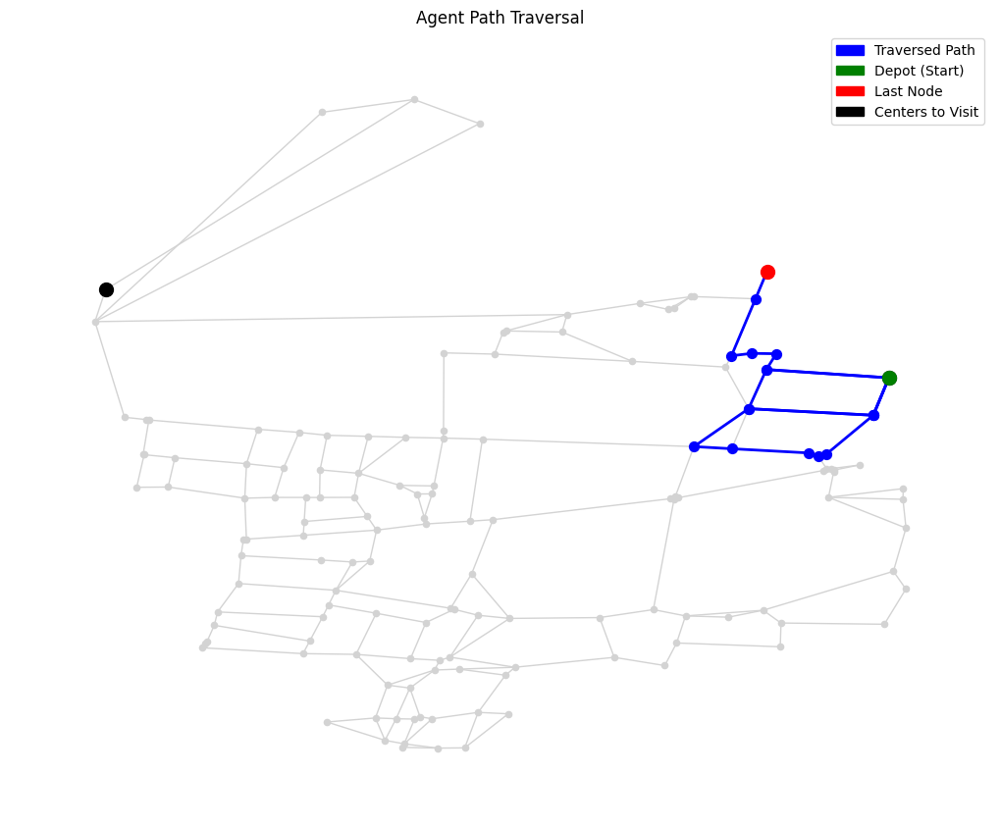

Episode 80, Total reward: -5177.42


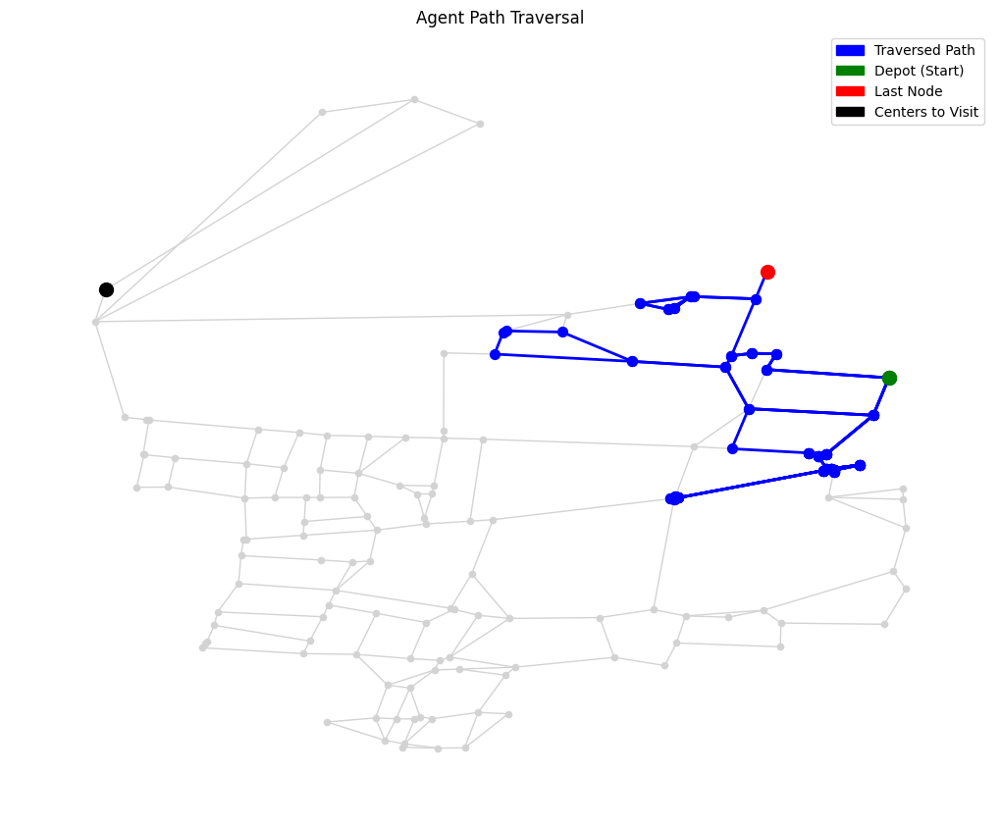

Episode 81, Total reward: -959637.43


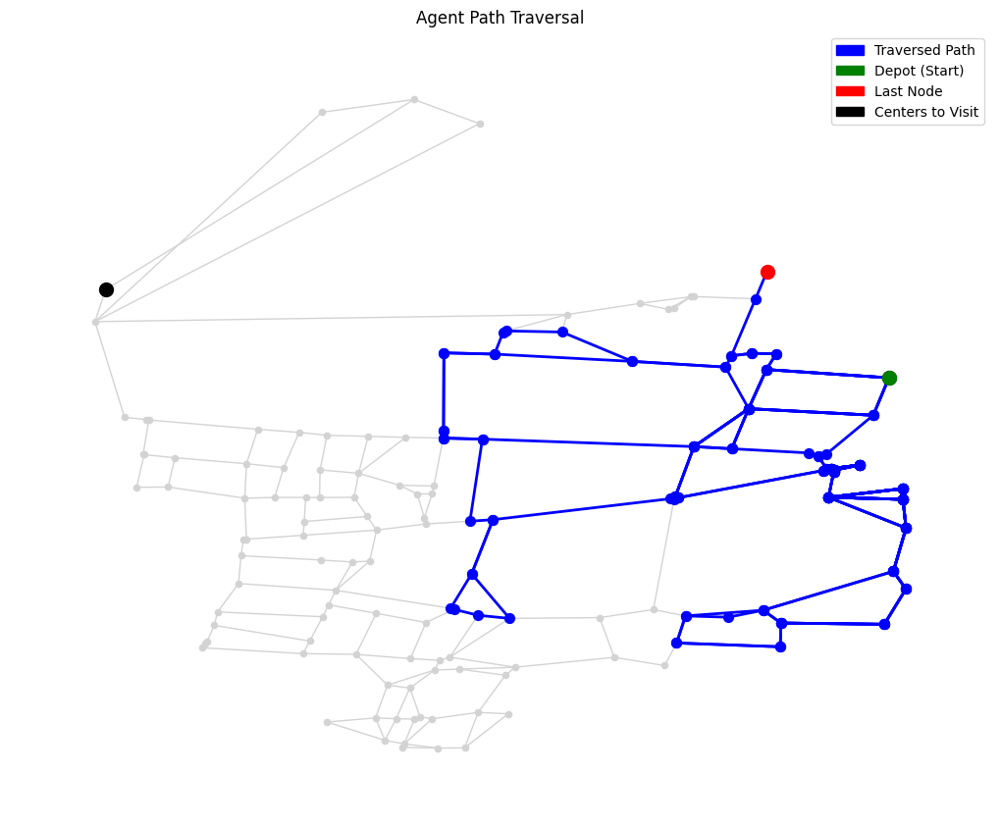

Episode 82, Total reward: -5843525.92


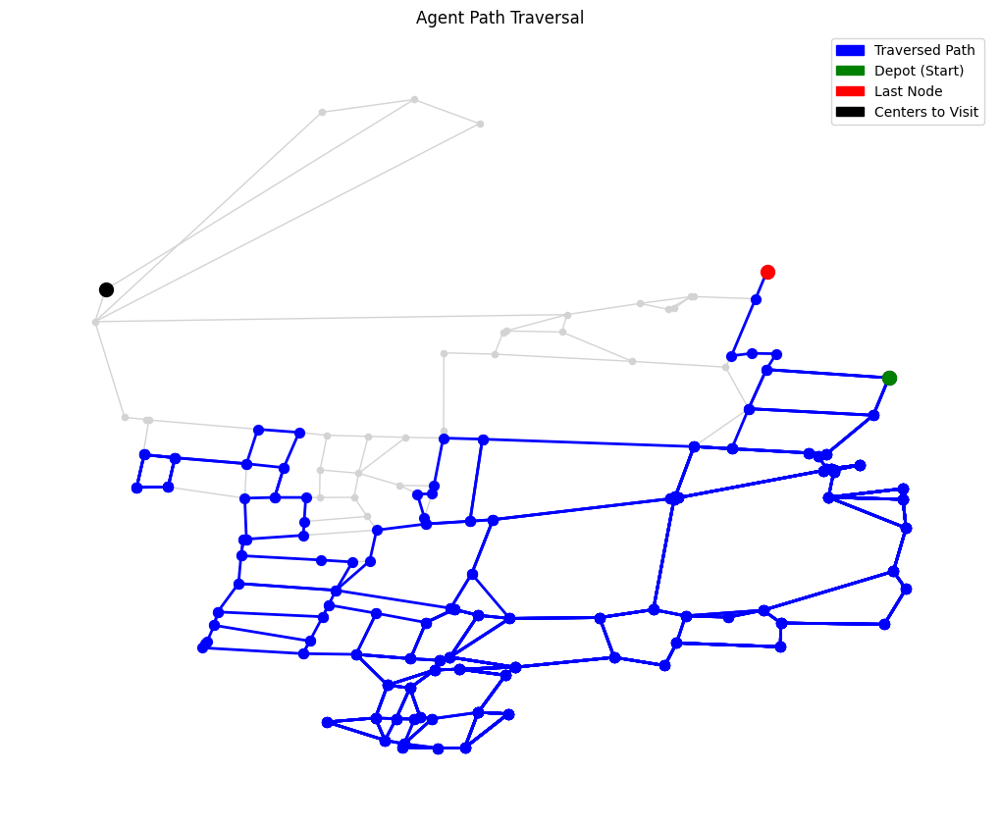

Episode 83, Total reward: -102378663.54


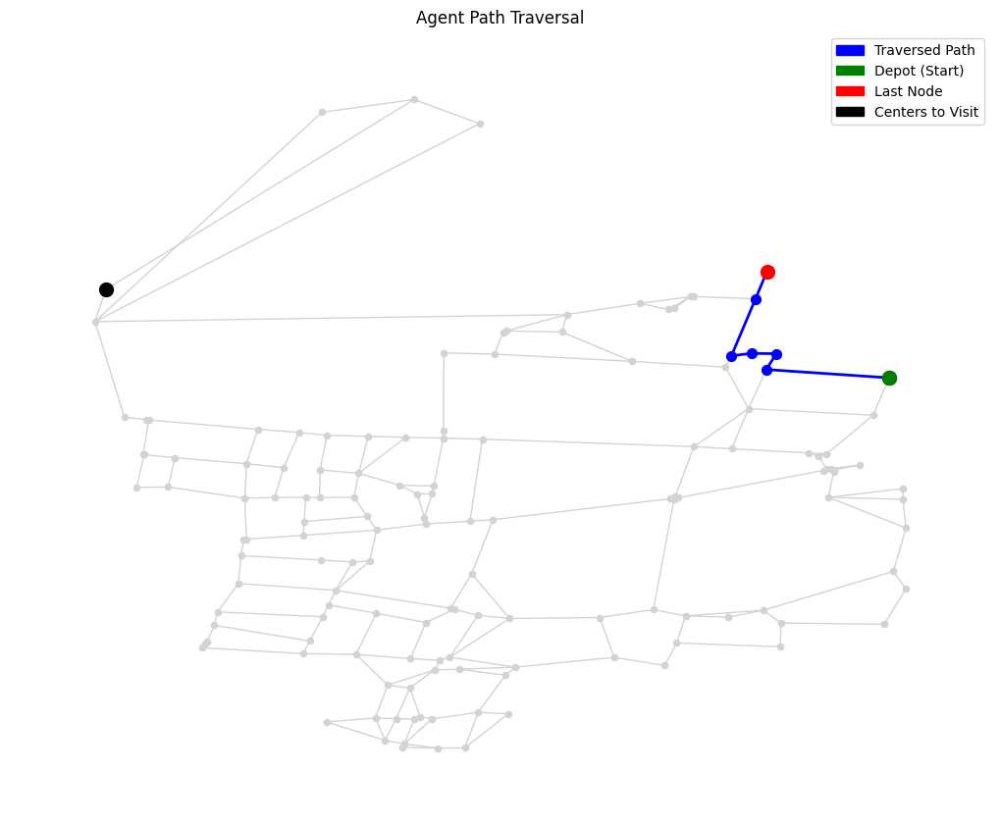

Episode 84, Total reward: 0.00


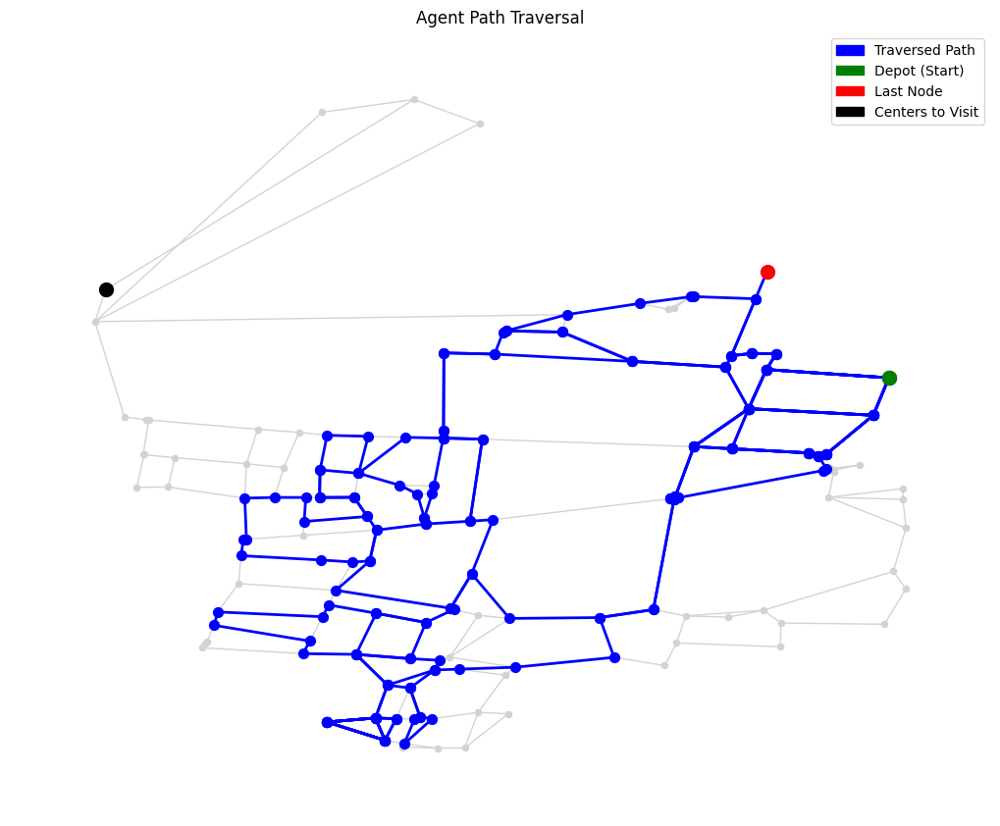

Episode 85, Total reward: -8605216.52


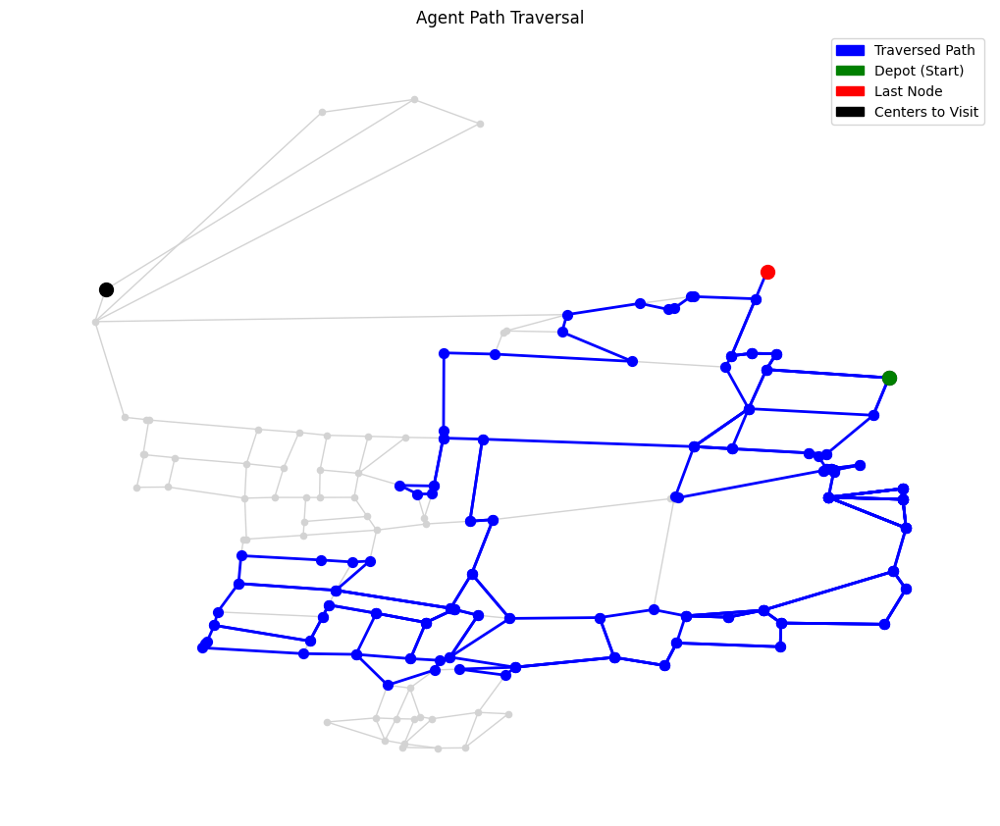

Episode 86, Total reward: -7941853.74


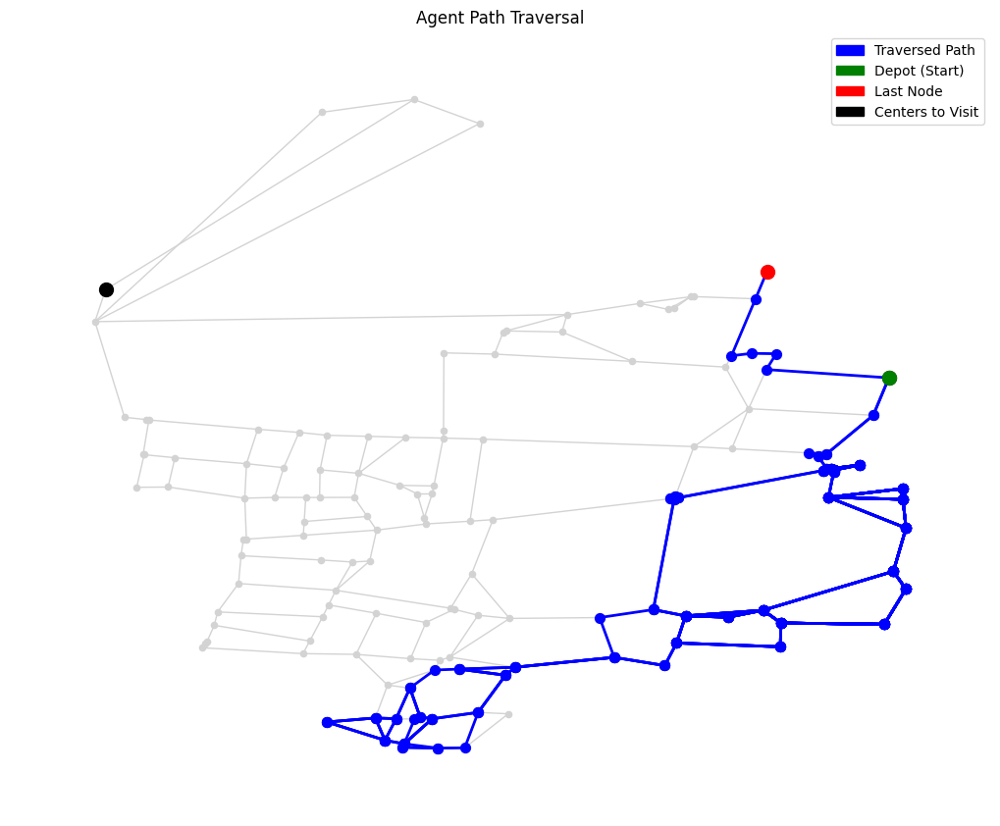

Episode 87, Total reward: -14408472.89


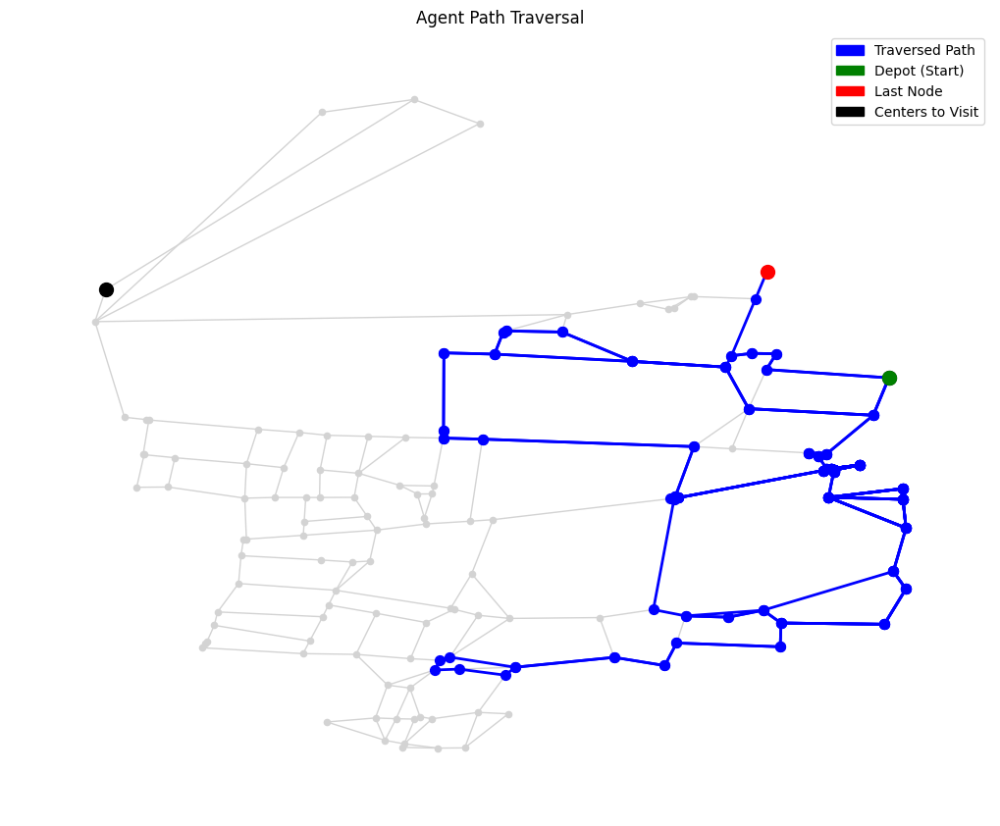

Episode 88, Total reward: -5096960.28


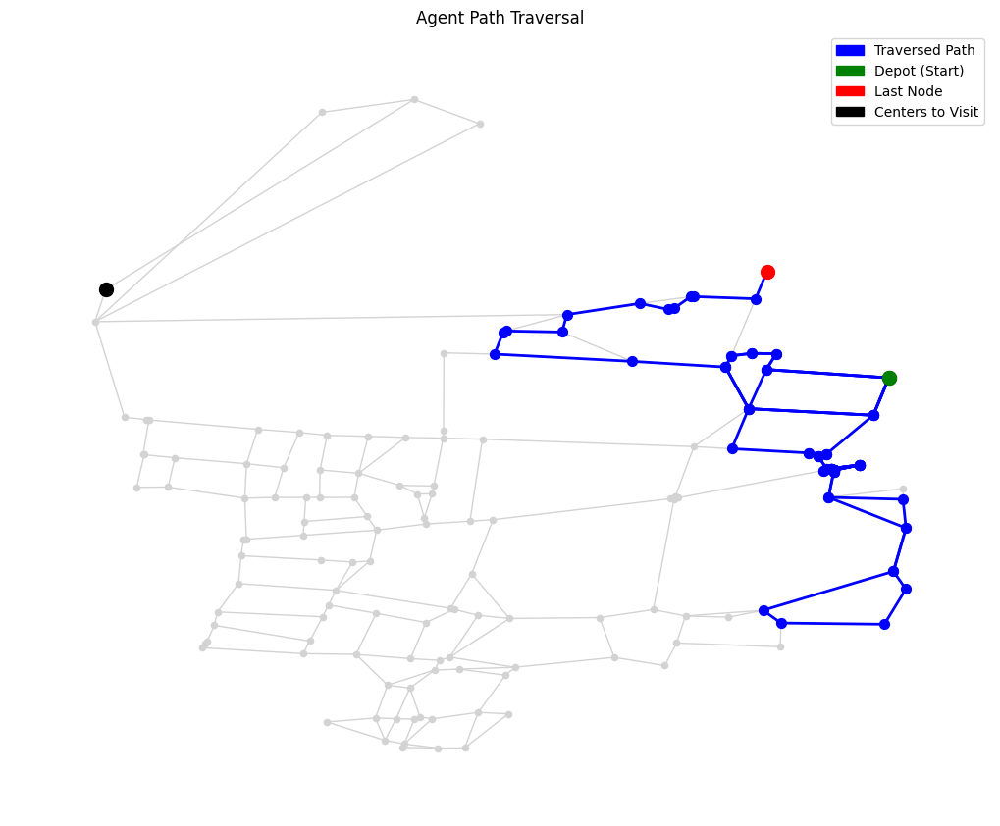

Episode 89, Total reward: -722614.29


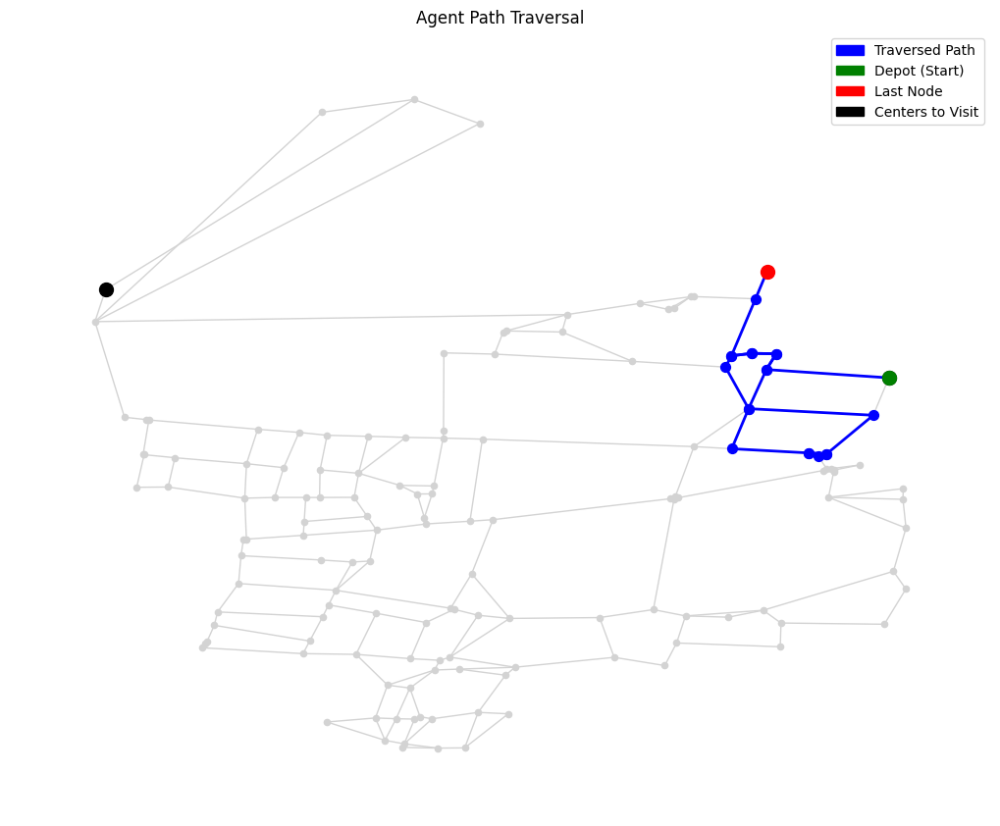

Episode 90, Total reward: -3373.85


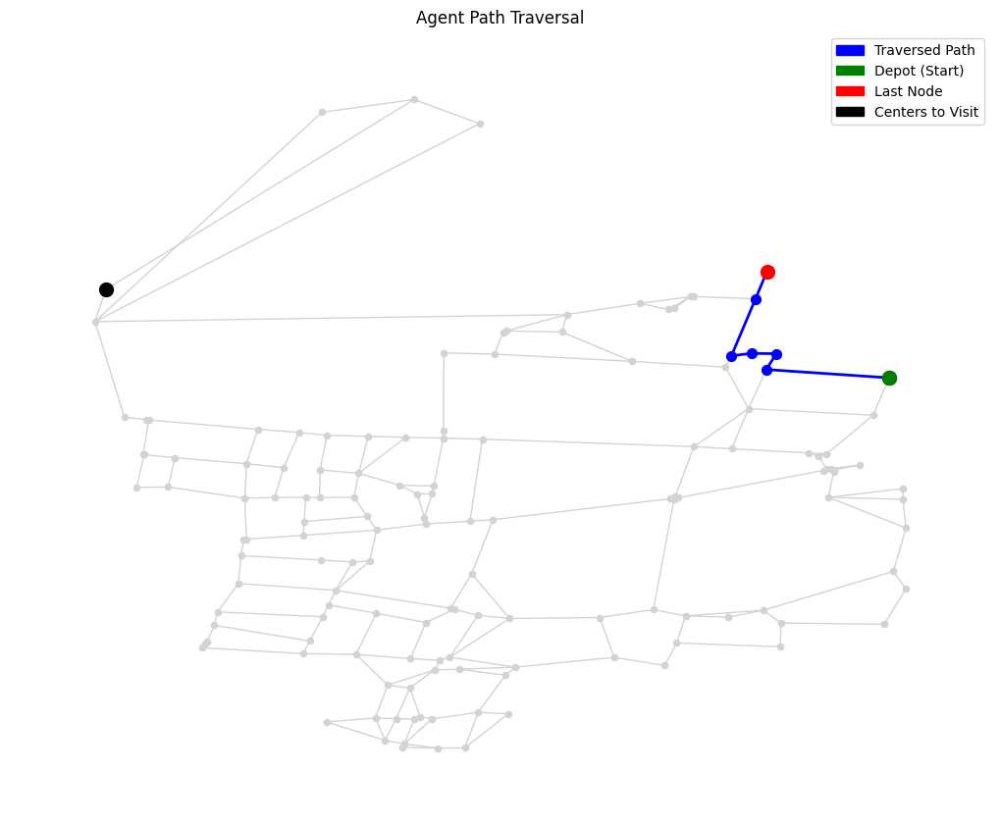

Episode 91, Total reward: 0.00


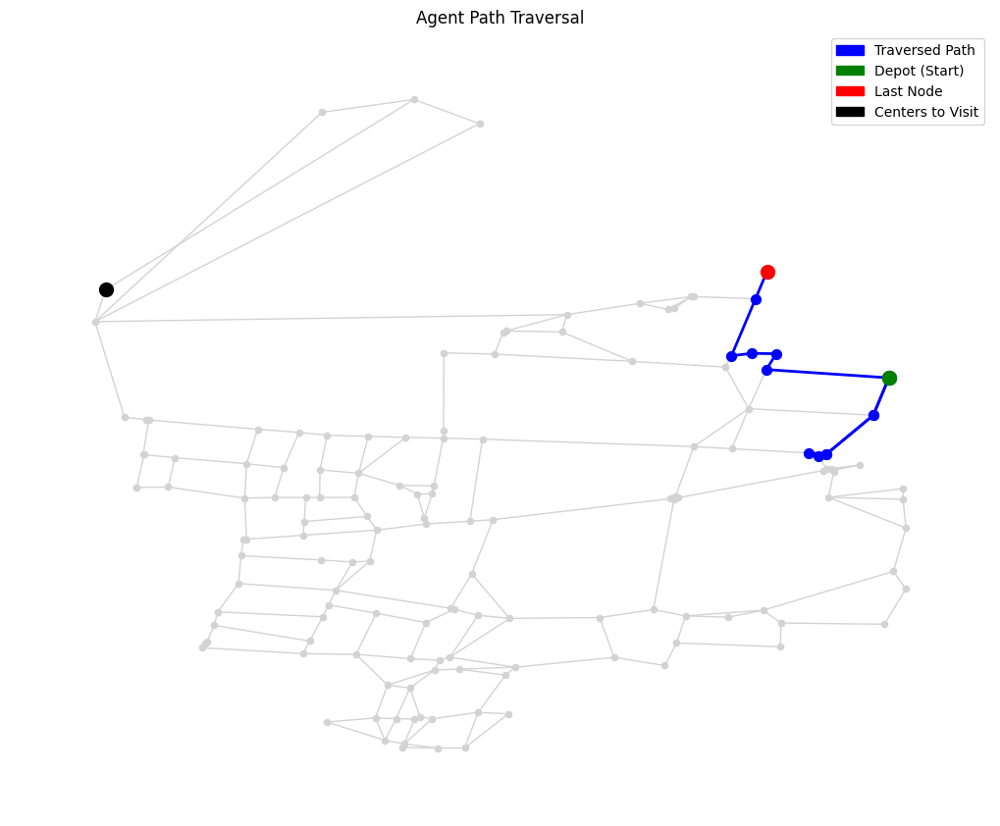

Episode 92, Total reward: -15.00


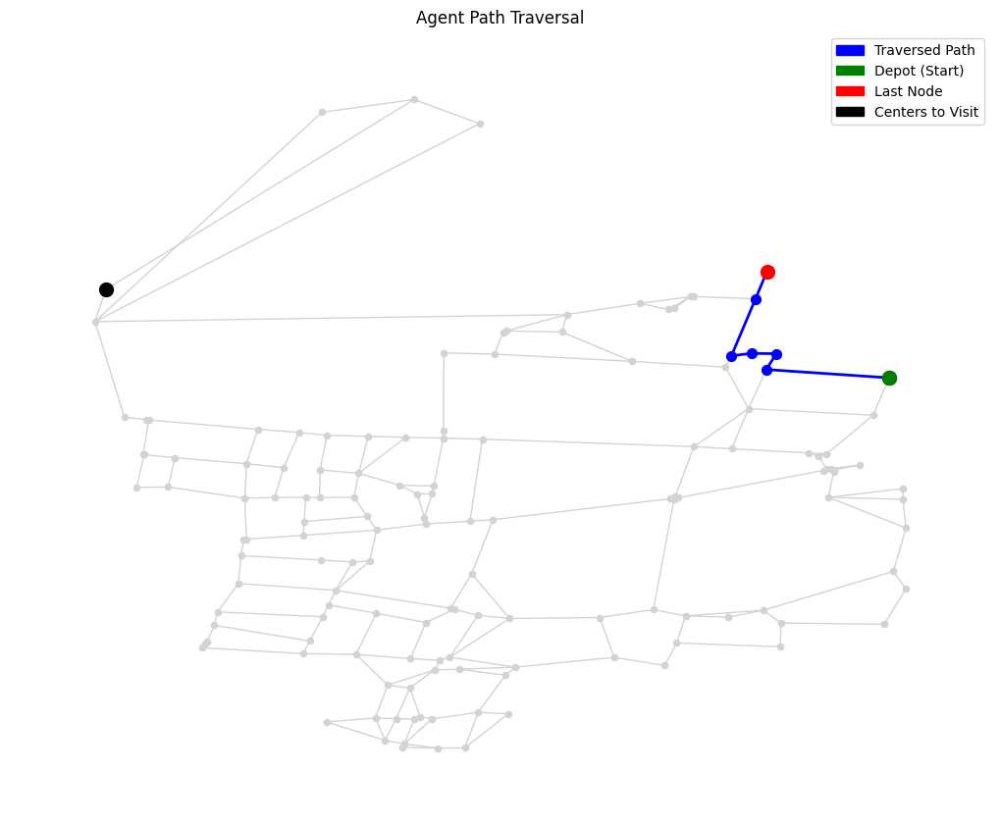

Episode 93, Total reward: 0.00


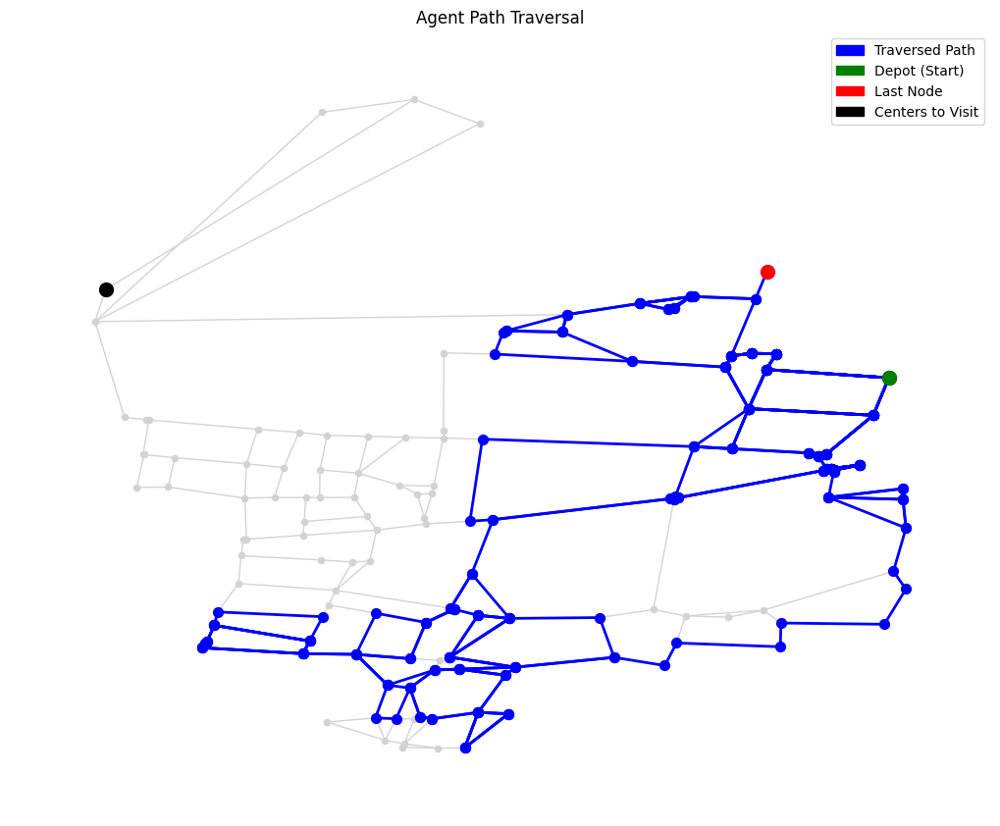

Episode 94, Total reward: -12108482.21


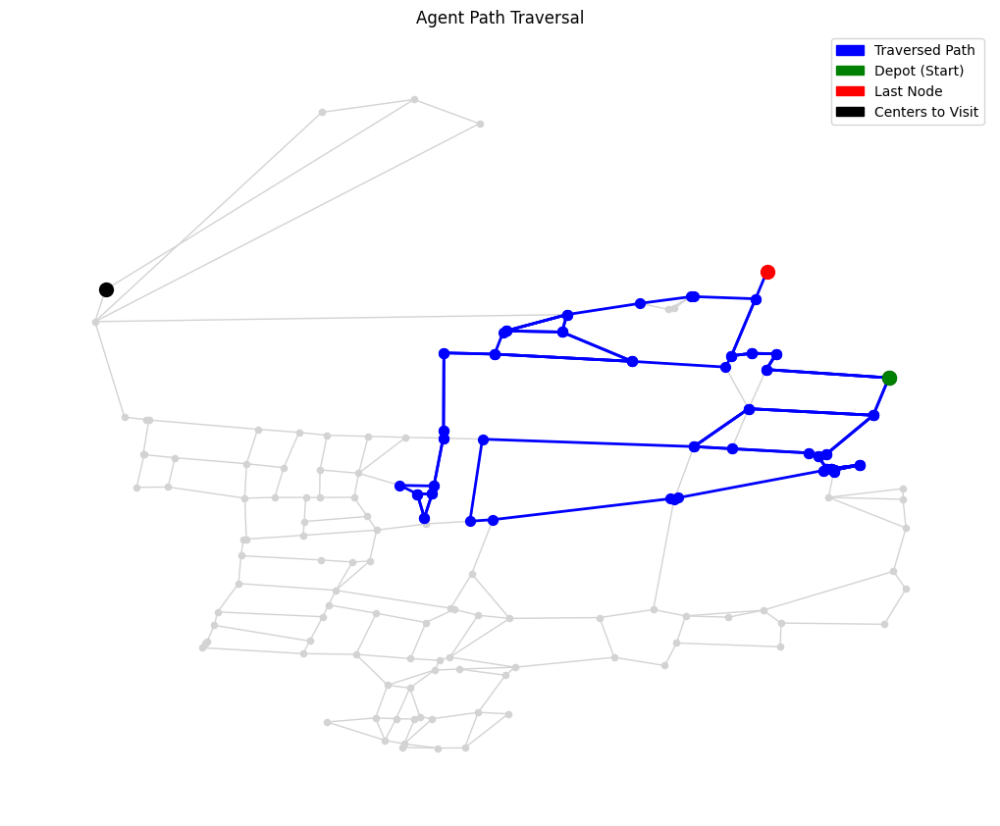

Episode 95, Total reward: -1064788.99


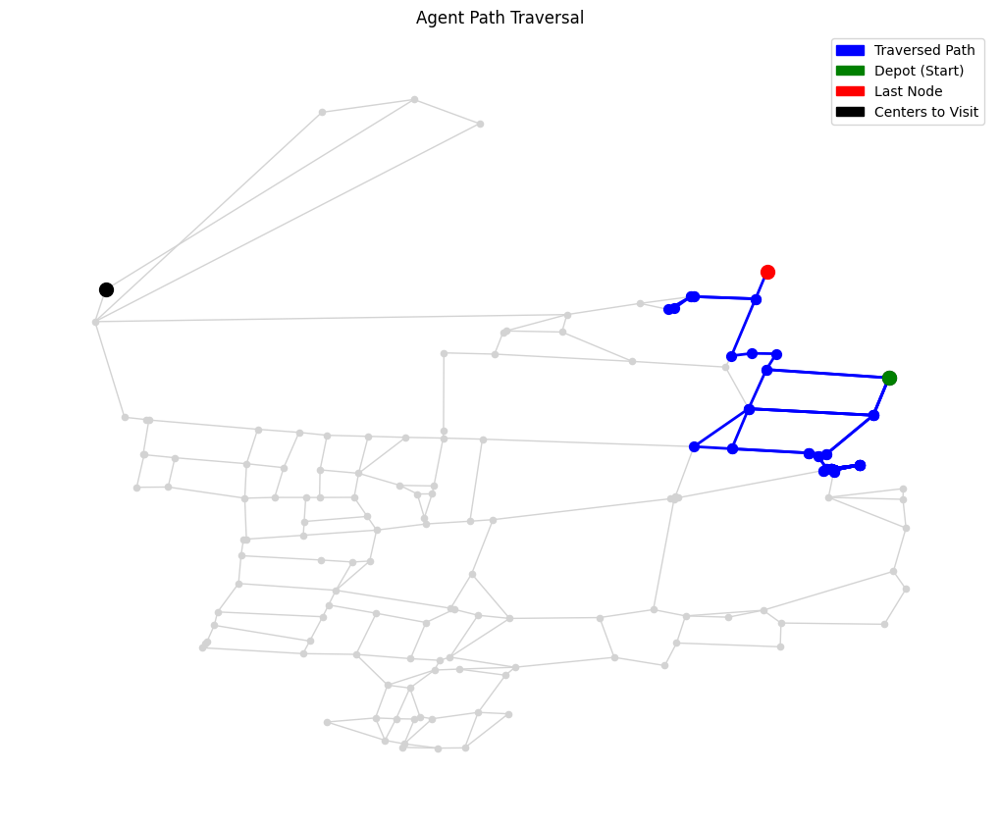

Episode 96, Total reward: -84224.63


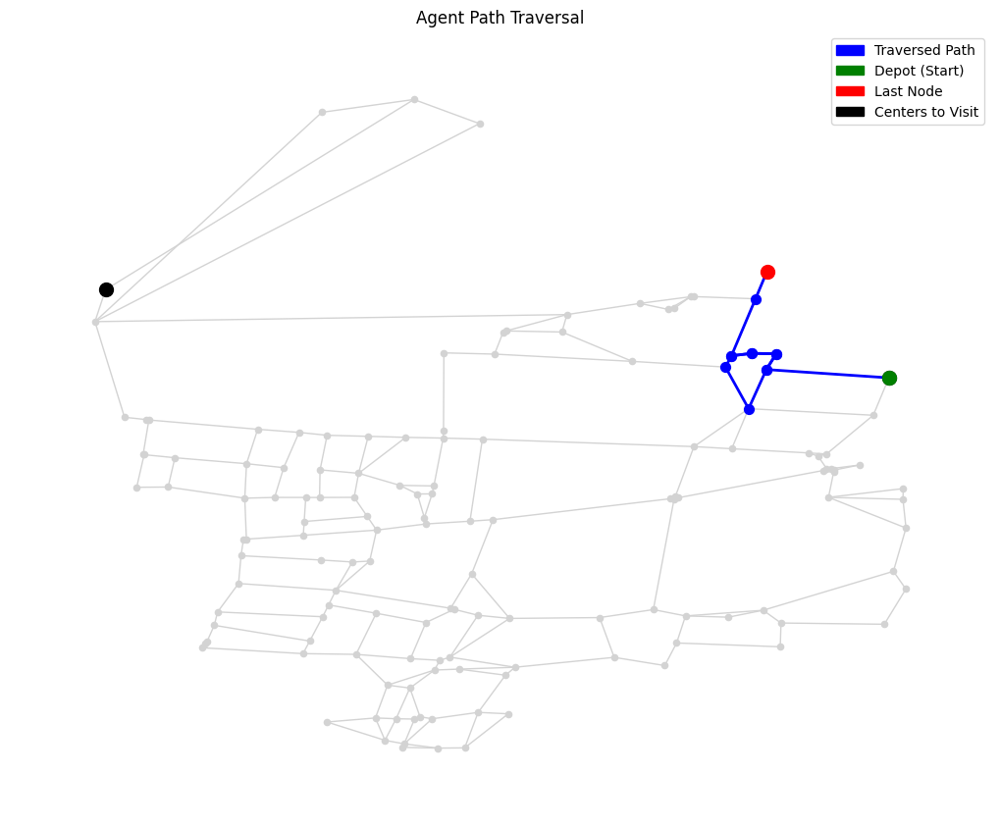

Episode 97, Total reward: -63.97


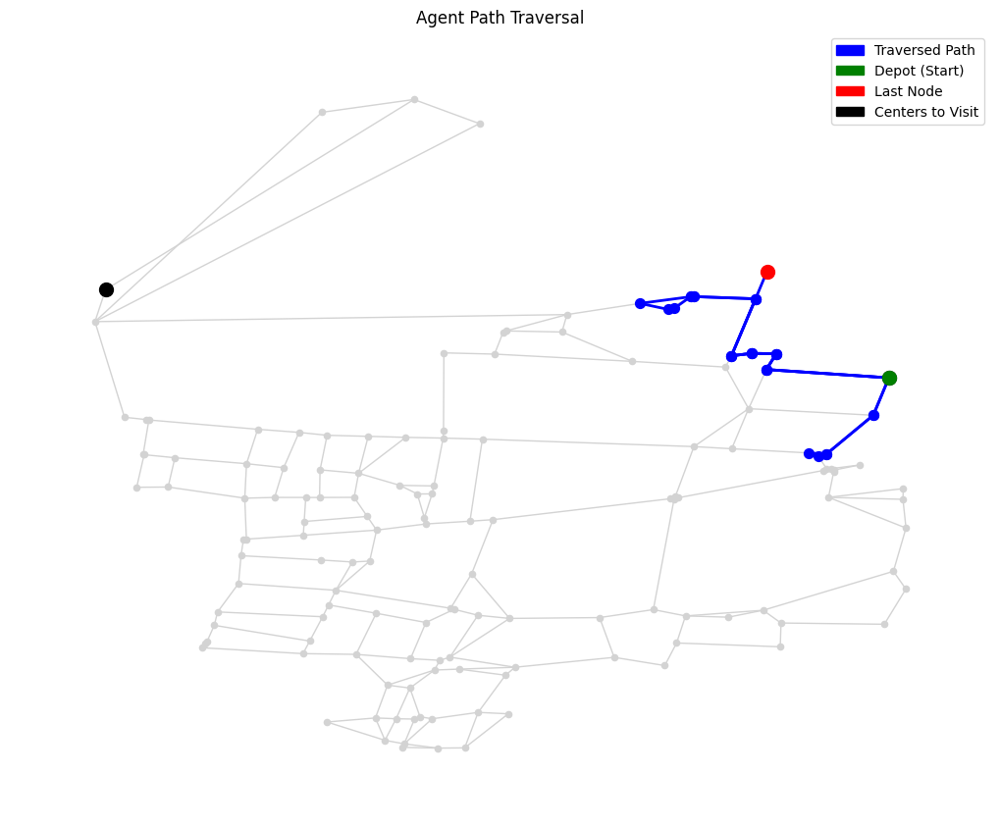

Episode 98, Total reward: -20217.62


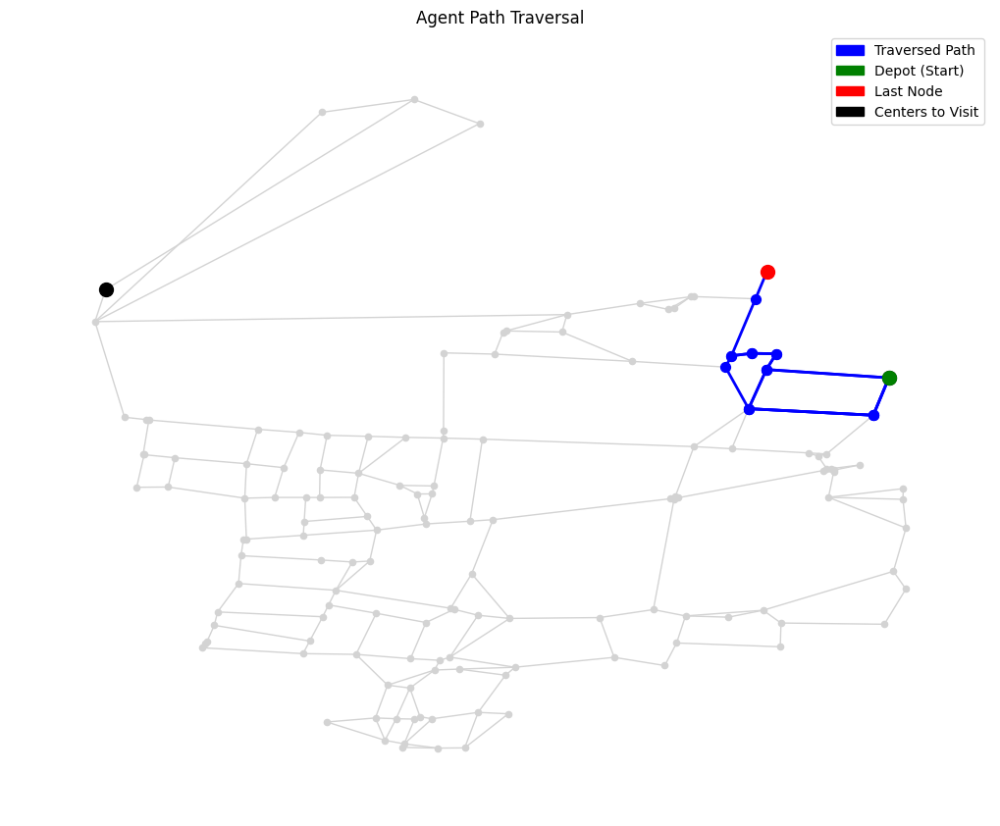

Episode 99, Total reward: -13675.17


In [105]:
state_size = 10
action_size = 4


# node_to_index = {node: i for i, node in enumerate(index_to_node)}

dqn = DQN(state_size, action_size)
optimizer = optim.Adam(dqn.parameters(), lr=0.001)
criterion = nn.MSELoss()

eps = 100
gamma = 0.95
epsilon = 1.0
decay = 0.995
min_epsilon = 0.01


for episode in range(eps):
    state = torch.tensor(env.reset(), dtype=torch.float32).unsqueeze(0)
    visited_path = []
    visited_path.append(env.current_node)
    # print(state.shape)
    total_reward = 0
    done = False

    while( not done) :         #for i in range(100):

        action,idx = env.select_action(state,epsilon)

        if action is None:
            break

        next_state, reward, done, _ = env.step(action)

        next_state = torch.tensor(next_state, dtype=torch.float32).unsqueeze(0)
        target = reward + gamma * torch.max(dqn(next_state)).item()

        # print(dqn(state).shape)
        output = dqn(state)[0,idx]
        loss = criterion(output, torch.tensor(target))

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        state = next_state
        total_reward += reward
        if done:
            break
        visited_path.append(env.current_node)
        # print(f"Episode {i}")

    epsilon = max(min_epsilon, epsilon * decay)

    # Visualize visited path after training
    plot_path_static(env.graph, visited_path)


    if episode % 1 == 0:
        print(f"Episode {episode}, Total reward: {total_reward:.2f}")


In [106]:
torch.save(dqn.state_dict(), "dqn_vehicle_routing.pth")


## Eval

In [111]:
state_size = 10
action_size = 4

dqn = DQN(state_size, action_size)
dqn.load_state_dict(torch.load("dqn_vehicle_routing.pth"))
dqn.eval()  # set the model to evaluation mode


DQN(
  (fc1): Linear(in_features=10, out_features=128, bias=True)
  (fc2): Linear(in_features=128, out_features=64, bias=True)
  (out): Linear(in_features=64, out_features=4, bias=True)
)

In [112]:
id = 0

collection_centers = [c['coords'] for c in assigned_vehicles[id]['collection_centers']]
disposal_centers = [c['coords'] for c in assigned_vehicles[id]['disposal_center']]


In [113]:
# env.current_node , list(G.neighbors(visited_path[-1]))

In [114]:
from collections import deque

env = VehicleRoutingEnv(
    graph=G,
    vehicle=vehicles[id],
    collection_centers=collection_centers,
    disposal_centers=disposal_centers
)

state = torch.tensor(env.reset(), dtype=torch.float32).unsqueeze(0)
visited_path = deque(maxlen=20)  # Track recent nodes to detect loops
visited_path.append(env.current_node)

done = False
action = None
count = 0
max_steps = 100  # Safety limit to prevent infinite loops

while not done and count < max_steps:
    current_node = env.current_node
    valid_actions = list(G.neighbors(current_node))

    # Avoid immediate backtracking if there's more than one option
    if env.prev_node and len(valid_actions) > 1:
        if env.prev_node in valid_actions:
            valid_actions.remove(env.prev_node)

    # Check if we're in a loop (visiting same node again)
    if current_node in visited_path and current_node not in env.disposal_centers:
        print("Loop detected at:", current_node)
        # print("Visited path:", list(visited_path))

        # Try rerouting by filtering out recently visited nodes
        reroute_actions = [a for a in G.neighbors(current_node) if a not in visited_path]
        if reroute_actions:
            action = random.choice(reroute_actions)
            print("Re-routing to:", action)
        else:
            print("No fresh routes available. Taking random action.")
            action = random.choice(valid_actions)

    else:
        with torch.no_grad():
            q_vals = dqn(state)  # Get Q-values
            masked_q_vals = torch.full_like(q_vals, float('-inf'))  # Init with -inf
            sorted_actions = [None] * 4  # ['north', 'east', 'south', 'west']

            for neighbor in valid_actions:
                relative_dir = env.relative_position(current_node, neighbor)
                if relative_dir:
                    dir_index = env.directions.index(relative_dir)
                    sorted_actions[dir_index] = neighbor
                    masked_q_vals[0, dir_index] = q_vals[0, dir_index]

            best_action_idx = torch.argmax(masked_q_vals).item()
            action = sorted_actions[best_action_idx]

            if action is None:
                print("No valid DQN direction. Choosing random.")
                action = random.choice(valid_actions)

    # Take action
    next_state, reward, done, _ = env.step(action)

    visited_path.append(env.current_node)
    state = torch.tensor(next_state, dtype=torch.float32).unsqueeze(0)
    count += 1

print("✅ Final path:", list(visited_path))
print("✅ Done:", done)


Loop detected at: (87.3140445, 22.3187008)
Re-routing to: (87.3148889, 22.3188712)
Loop detected at: (87.3148889, 22.3188712)
Re-routing to: (87.3149089, 22.3184503)
Loop detected at: (87.3149089, 22.3184503)
Re-routing to: (87.3147801, 22.3180997)
Loop detected at: (87.3147801, 22.3180997)
Re-routing to: (87.3141759, 22.317996)
Loop detected at: (87.3141759, 22.317996)
Re-routing to: (87.3144805, 22.3163921)
Loop detected at: (87.3144805, 22.3163921)
Re-routing to: (87.3148684, 22.3140173)
Loop detected at: (87.3148684, 22.3140173)
Re-routing to: (87.3160402, 22.3141654)
Loop detected at: (87.3160402, 22.3141654)
Re-routing to: (87.3161071, 22.3142149)
Loop detected at: (87.3161071, 22.3142149)
Re-routing to: (87.3169799, 22.3152648)
Loop detected at: (87.3169799, 22.3152648)
Re-routing to: (87.3166026, 22.307132)
Loop detected at: (87.3166026, 22.307132)
Re-routing to: (87.3277825, 22.3110414)
Loop detected at: (87.3277825, 22.3110414)
Re-routing to: (87.3284675, 22.3126279)
Loop det

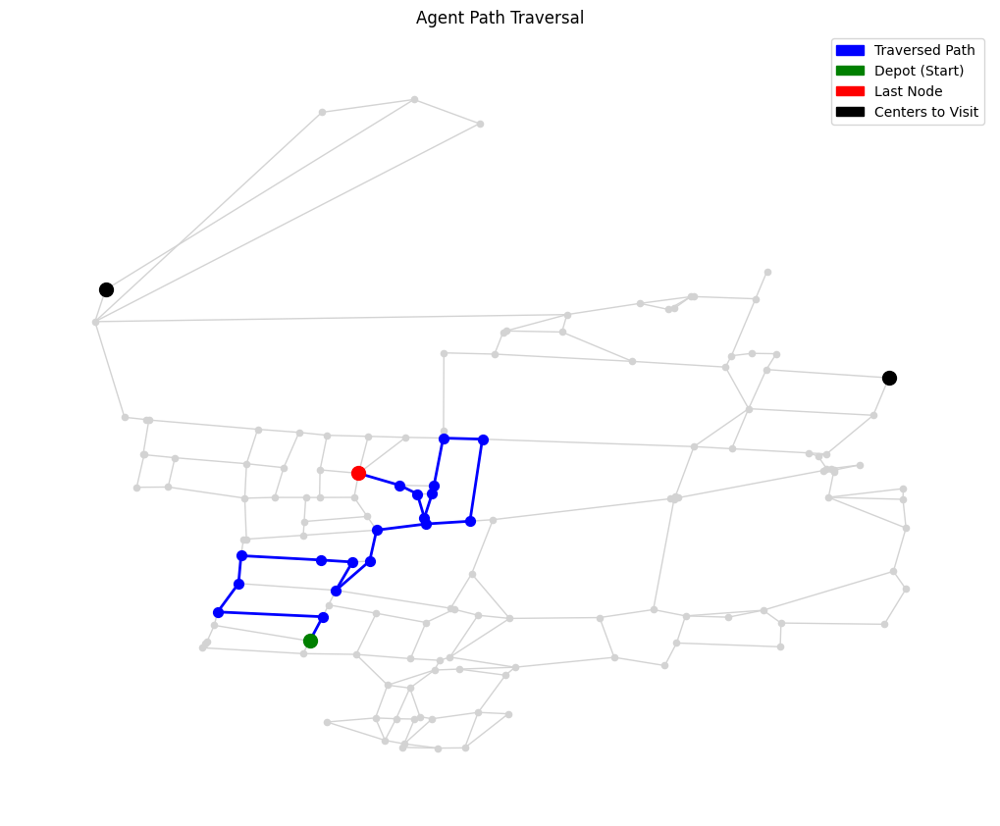

In [115]:
# Visualize visited path after training
plot_path_static(env.graph, list(visited_path))